## Setup and import

In [2]:
# import
import xarray as xr
import numpy as np

from rhwhitepackages.readwrite import *
from rhwhitepackages.plotting import *
from rhwhitepackages.CESMmanip import *
from rhwhitepackages import CESMdiag_Rose

from cartopy.util import add_cyclic_point

import scipy
from scipy import stats

# import matplotlib
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
import matplotlib.path as mpath
import matplotlib.ticker as mticker

%matplotlib inline


In [3]:
# Define colormaps with white centre
reds =   np.array([10, 20, 100, 220,255,255,255,255,192],np.float)
greens = np.array([50, 130,200,250,255,230,150, 20, 0],np.float)
blues =  np.array([120,210,240,250,255,100,40,  0,  0],np.float)

reds = reds/255
blues = blues/255
greens = greens/255

ncolors = len(reds)

colors = [[reds[0],greens[0],blues[0]]]
for i in range(1,ncolors):
    colors.append([reds[i],greens[i],blues[i]])

spacing = np.linspace(0,1,ncolors)
cdict = {'red': ((spacing[0], reds[0], reds[0]),
                     (spacing[1], reds[1], reds[1]),
                     (spacing[2], reds[2], reds[2]),
                     (spacing[3], reds[3], reds[3]),
                     (spacing[4], reds[4], reds[4]),
                     (spacing[5], reds[5], reds[5]),
                     (spacing[6], reds[6], reds[6]),
                ),
          'green': ((spacing[0], greens[0], greens[0]),
                     (spacing[1], greens[1], greens[1]),
                     (spacing[2], greens[2], greens[2]),
                     (spacing[3], greens[3], greens[3]),
                     (spacing[4], greens[4], greens[4]),
                     (spacing[5], greens[5], greens[5]),
                     (spacing[6], greens[6], greens[6])
                   ),
           'blue': ((spacing[0], blues[0], blues[0]),
                     (spacing[1], blues[1], blues[1]),
                     (spacing[2], blues[2], blues[2]),
                     (spacing[3], blues[3], blues[3]),
                     (spacing[4], blues[4], blues[4]),
                     (spacing[5], blues[5], blues[5]),
                     (spacing[6], blues[6], blues[6])
                   )}

cmap_wc_small = matplotlib.colors.LinearSegmentedColormap('my_colormap',cdict,256)

# Define new colormap with large white centre
reds =   np.array([10, 15, 30, 60, 80, 130,160,200,255,255,255,255,255,255,255,255,255,255,192,165],np.float)
greens = np.array([50, 75, 110,160,180,210,240,255,255,255,255,255,232,192,160,96, 50, 20, 0,  0],np.float)
blues =  np.array([120,165,200,240,250,255,255,255,255,255,255,255,120,60, 0,  0,  0,  0,  0,  0],np.float)

reds = reds/255
blues = blues/255
greens = greens/255

ncolors = len(reds)

spacing = np.linspace(0,1,ncolors)
cdict = {'red': ((spacing[0], reds[0], reds[0]),
                 (spacing[1], reds[1], reds[1]),
                 (spacing[2], reds[2], reds[2]),
                 (spacing[3], reds[3], reds[3]),
                 (spacing[4], reds[4], reds[4]),
                 (spacing[5], reds[5], reds[5]),
                 (spacing[6], reds[6], reds[6]),
                 (spacing[7], reds[7], reds[7]),
                 (spacing[8], reds[8], reds[8]),
                 (spacing[9], reds[9], reds[9]),
                 (spacing[10], reds[10], reds[10]),
                 (spacing[11], reds[11], reds[11]),
                 (spacing[12], reds[12], reds[12]),
                 (spacing[13], reds[13], reds[13]),
                 (spacing[14], reds[14], reds[14]),
                 (spacing[15], reds[15], reds[15]),
                 (spacing[16], reds[16], reds[16]),
                 (spacing[17], reds[17], reds[17]),
                 (spacing[18], reds[18], reds[18]),
                 (spacing[19], reds[19], reds[19])
                ),
         'green': ((spacing[0], greens[0], greens[0]),
                  (spacing[1], greens[1], greens[1]),
                 (spacing[2], greens[2], greens[2]),
                 (spacing[3], greens[3], greens[3]),
                 (spacing[4], greens[4], greens[4]),
                 (spacing[5], greens[5], greens[5]),
                 (spacing[6], greens[6], greens[6]),
                 (spacing[7], greens[7], greens[7]),
                 (spacing[8], greens[8], greens[8]),
                 (spacing[9], greens[9], greens[9]),
                 (spacing[10], greens[10], greens[10]),
                 (spacing[11], greens[11], greens[11]),
                 (spacing[12], greens[12], greens[12]),
                 (spacing[13], greens[13], greens[13]),
                 (spacing[14], greens[14], greens[14]),
                 (spacing[15], greens[15], greens[15]),
                 (spacing[16], greens[16], greens[16]),
                 (spacing[17], greens[17], greens[17]),
                 (spacing[18], greens[18], greens[18]),              
                 (spacing[19], greens[19], greens[19])                      
                  ),

         'blue': ((spacing[0], blues[0], blues[0]),
                 (spacing[1], blues[1], blues[1]),
                 (spacing[2], blues[2], blues[2]),
                 (spacing[3], blues[3], blues[3]),
                 (spacing[4], blues[4], blues[4]),
                 (spacing[5], blues[5], blues[5]),
                 (spacing[6], blues[6], blues[6]),
                 (spacing[7], blues[7], blues[7]),
                 (spacing[8], blues[8], blues[8]),
                 (spacing[9], blues[9], blues[9]),
                 (spacing[10], blues[10], blues[10]),
                 (spacing[11], blues[11], blues[11]),
                 (spacing[12], blues[12], blues[12]),
                 (spacing[13], blues[13], blues[13]),
                 (spacing[14], blues[14], blues[14]),
                 (spacing[15], blues[15], blues[15]),
                 (spacing[16], blues[16], blues[16]),
                 (spacing[17], blues[17], blues[17]),
                 (spacing[18], blues[18], blues[18]),               
                 (spacing[19], blues[19], blues[19])
                 )}

cmap_wc = matplotlib.colors.LinearSegmentedColormap('my_colormap',cdict,256)

# Define new colormap with large white centre
reds =   np.array([10, 15, 30, 60, 80, 130,160,200,235,255,255,255,255,255,255,255,255,255,192,165],np.float)
greens = np.array([50, 75, 110,160,180,210,240,255,255,255,255,255,232,192,160,96, 50, 20, 0,  0],np.float)
blues =  np.array([120,165,200,240,250,255,255,255,255,255,255,200,120,60, 0,  0,  0,  0,  0,  0],np.float)

reds = reds/255
blues = blues/255
greens = greens/255

ncolors = len(reds)

spacing = np.linspace(0,1,ncolors)
cdict = {'red': ((spacing[0], reds[0], reds[0]),
                 (spacing[1], reds[1], reds[1]),
                 (spacing[2], reds[2], reds[2]),
                 (spacing[3], reds[3], reds[3]),
                 (spacing[4], reds[4], reds[4]),
                 (spacing[5], reds[5], reds[5]),
                 (spacing[6], reds[6], reds[6]),
                 (spacing[7], reds[7], reds[7]),
                 (spacing[8], reds[8], reds[8]),
                 (spacing[9], reds[9], reds[9]),
                 (spacing[10], reds[10], reds[10]),
                 (spacing[11], reds[11], reds[11]),
                 (spacing[12], reds[12], reds[12]),
                 (spacing[13], reds[13], reds[13]),
                 (spacing[14], reds[14], reds[14]),
                 (spacing[15], reds[15], reds[15]),
                 (spacing[16], reds[16], reds[16]),
                 (spacing[17], reds[17], reds[17]),
                 (spacing[18], reds[18], reds[18]),
                 (spacing[19], reds[19], reds[19])
                ),
         'green': ((spacing[0], greens[0], greens[0]),
                  (spacing[1], greens[1], greens[1]),
                 (spacing[2], greens[2], greens[2]),
                 (spacing[3], greens[3], greens[3]),
                 (spacing[4], greens[4], greens[4]),
                 (spacing[5], greens[5], greens[5]),
                 (spacing[6], greens[6], greens[6]),
                 (spacing[7], greens[7], greens[7]),
                 (spacing[8], greens[8], greens[8]),
                 (spacing[9], greens[9], greens[9]),
                 (spacing[10], greens[10], greens[10]),
                 (spacing[11], greens[11], greens[11]),
                 (spacing[12], greens[12], greens[12]),
                 (spacing[13], greens[13], greens[13]),
                 (spacing[14], greens[14], greens[14]),
                 (spacing[15], greens[15], greens[15]),
                 (spacing[16], greens[16], greens[16]),
                 (spacing[17], greens[17], greens[17]),
                 (spacing[18], greens[18], greens[18]),              
                 (spacing[19], greens[19], greens[19])                      
                  ),

         'blue': ((spacing[0], blues[0], blues[0]),
                 (spacing[1], blues[1], blues[1]),
                 (spacing[2], blues[2], blues[2]),
                 (spacing[3], blues[3], blues[3]),
                 (spacing[4], blues[4], blues[4]),
                 (spacing[5], blues[5], blues[5]),
                 (spacing[6], blues[6], blues[6]),
                 (spacing[7], blues[7], blues[7]),
                 (spacing[8], blues[8], blues[8]),
                 (spacing[9], blues[9], blues[9]),
                 (spacing[10], blues[10], blues[10]),
                 (spacing[11], blues[11], blues[11]),
                 (spacing[12], blues[12], blues[12]),
                 (spacing[13], blues[13], blues[13]),
                 (spacing[14], blues[14], blues[14]),
                 (spacing[15], blues[15], blues[15]),
                 (spacing[16], blues[16], blues[16]),
                 (spacing[17], blues[17], blues[17]),
                 (spacing[18], blues[18], blues[18]),               
                 (spacing[19], blues[19], blues[19])
                 )}

cmap_swc = matplotlib.colors.LinearSegmentedColormap('my_colormap',cdict,256)


In [43]:
# define functions
def HFreadfiles(dir,filename):                            
    atmfile = CESMdiag_Rose.compute_all_diagnostics(
                             xrOpen(dir + filename,
                             False),verbose=False)

    return(atmfile)  

def readseasons(atmfields,Dir,exp,startyr,nyears,name,camversion='cam2'):
    for seas in ['ANN','DJF','JJA']:
        try:
            atmfields[exp][seas] = xr.open_dataset(Dir + '/' + seas + str(startyr) + '_' + str(nyears) + '_mean_' + name + '.' + camversion + '.h0.nc')
        except SystemExit:
            atmfields[exp][seas]=None    

    atmfields['p' + exp] = {}
            
    for seas in ['ANN','DJF','JJA']:
        try:
            atmfields['p' + exp][seas] = xr.open_dataset(Dir + '/' + seas + str(startyr) + '_' + str(nyears) + '_mean_Xpl_' + name + '.' + camversion + '.h0.nc')
        except SystemExit:
            print 'missing pl file for ' + exp

def add_lon(toplot,coord):
    lon_idx = toplot.dims.index(coord)
    cyclic_data, cyclic_coord = add_cyclic_point(toplot.values,
                                                 coord=toplot.coords[coord],
                                                 axis=lon_idx)

    # Copy and add the cyclic coordinate and data
    new_coords = dict(toplot.coords)
    new_coords[coord] = cyclic_coord
    new_values = cyclic_data

    new_da = xr.DataArray(new_values, dims=toplot.dims, coords=new_coords)
    return(new_da)

def setaxes_latN(title,units,ps=1000,pt=10,fontsize=16,log=True):
    ps = ps
    pt = pt    
    if log:
        plt.yscale('log')   
        plt.gca().set_yticks([1000,500,200,100,50,20,10,5,2,1,])
        plt.gca().set_yticklabels(['1000','500','200','100','50','20','10','5','2','1'])

    else: 
        plt.gca().set_yticks([1000,750,500,250])
        plt.gca().set_yticklabels(['1000','750','500','250'])
       
        
    plt.gca().invert_yaxis()
    
    #plt.gca().set_xticks([10,20,30,40,50,60,70,80,90])
    #plt.gca().set_xticklabels(['10N','20N','30N','40N','50N','60N','70N','80N','90N'])    
    plt.gca().set_xticks([20,40,60,80])
    plt.gca().set_xticklabels(['20N','40N','60N','80N'])    

    
    #plt.gca().set_xticks([-80,-60,-40,-20,0,10,20,30,40,50,60,70,80])
    #plt.gca().set_xticklabels(['80S','60S','40S','20S','EQ','10N','20N','30N','40N','50N','60N','70N','80N'])    
    plt.xlim([0,90]) 
    plt.ylim([ps,pt]) 
    plt.title(title,loc='left')
    plt.xlabel('')
    plt.ylabel(title)
    plt.text(95,ps+100,units,fontsize = fontsize)

def setaxes_lon(title,units,ps=1000,pt=10):
    ps = ps
    pt = pt    
    plt.yscale('log')  
    plt.gca().invert_yaxis()
        
    plt.gca().set_yticks([1000,500,200,100,50,20,10])
    plt.gca().set_yticklabels(['1000','500','200','100','50','20','10'])

    plt.gca().set_xticks([60,120,180,240,300])
    plt.gca().set_xticklabels(['60E','120E','180','120W','60W'])    

    
    #plt.gca().set_xticks([-80,-60,-40,-20,0,10,20,30,40,50,60,70,80])
    #plt.gca().set_xticklabels(['80S','60S','40S','20S','EQ','10N','20N','30N','40N','50N','60N','70N','80N'])    
    #plt.xlim([xmin,xmax]) 
    plt.ylim([ps,pt]) 
    plt.title(title,loc='left')
    plt.xlabel('')
    plt.ylabel('')
    plt.text(90,ps+100,units)    
        
def setaxes_latNS(title,units,ps=1000,pt=10,fontsize=16,log=True):
    ps = ps
    pt = pt    
    if log:
        plt.yscale('log')  
    plt.gca().invert_yaxis()
        
    if log:
        plt.gca().set_yticks([1000,500,200,100,50,20,10])
        plt.gca().set_yticklabels(['1000','500','200','100','50','20','10'])
    else:
        plt.gca().set_yticks([1000,800,600,400,200])
        plt.gca().set_yticklabels(['1000','800','600','400','200'])
        
    plt.gca().set_xticks([80,60,40,20,0,-20,-40,-60,-80])
    plt.gca().set_xticklabels(['80N','60N','40N','20N','0','20S','40S','60S','80S'])    

    
    #plt.gca().set_xticks([-80,-60,-40,-20,0,10,20,30,40,50,60,70,80])
    #plt.gca().set_xticklabels(['80S','60S','40S','20S','EQ','10N','20N','30N','40N','50N','60N','70N','80N'])    
    plt.xlim([-90,90]) 
    plt.ylim([ps,pt]) 
    plt.title(title,loc='left',fontsize=fontsize)
    plt.xlabel('')
    plt.ylabel('pressure (mb)')
    plt.text(105,ps+100,units)
      
def set_NPstereo(nrows,ncols,n,include180=True):
    #proj = ccrs.Stereographic(central_latitude=90.0, central_longitude=0.0, 
    #                          false_easting=0.0, false_northing=0, 
    #                          true_scale_latitude=0, globe=None)
    proj=ccrs.NorthPolarStereo()

    ax = plt.subplot(ncols,nrows,n,projection=proj)

    ax.coastlines()

    ax.set_extent([-180, 180, 20, 90], ccrs.PlateCarree())

     # Compute a circle in axes coordinates, which we can use as a boundary
     # for the map. We can pan/zoom as much as we like - the boundary will be
     # permanently circular.
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    ax.set_boundary(circle, transform=ax.transAxes)

    gl = ax.gridlines(crs=ccrs.PlateCarree(),linewidth=1.5,linestyle = '--')
    gl.ylocator = mticker.FixedLocator([0,30,60])

    gl.xlocator = mticker.FixedLocator([0,30,60,90,120,150,180,210,240,270,300,330,360])
    ax.text(-2,16,'0',transform=ccrs.PlateCarree())
    #ax.text(-36,10,'30W',transform=ccrs.PlateCarree())
    ax.text(-62,8,'60W',transform=ccrs.PlateCarree())
    #ax.text(-89,7,'90W',transform=ccrs.PlateCarree())
    ax.text(-116,7.5,'120W',transform=ccrs.PlateCarree())
    #ax.text(-140,11,'150W',transform=ccrs.PlateCarree())
    if include180:
        ax.text(-175,18,'180',transform=ccrs.PlateCarree())

    #ax.text(30,17,'30E',transform=ccrs.PlateCarree())
    ax.text(60,18,'60E',transform=ccrs.PlateCarree())
    #ax.text(88.8,19,'90E',transform=ccrs.PlateCarree())
    ax.text(120,19,'120E',transform=ccrs.PlateCarree())
    #ax.text(150,19,'150E',transform=ccrs.PlateCarree())
    
    return(ax)

def set_NPstereo_small(nrows,ncols,n):
    #proj = ccrs.Stereographic(central_latitude=90.0, central_longitude=0.0, 
    #                          false_easting=0.0, false_northing=0, 
    #                          true_scale_latitude=0, globe=None)
    proj=ccrs.NorthPolarStereo()

    ax = plt.subplot(ncols,nrows,n,projection=proj)

    ax.coastlines()

    ax.set_extent([-180, 180, 20, 90], ccrs.PlateCarree())

     # Compute a circle in axes coordinates, which we can use as a boundary
     # for the map. We can pan/zoom as much as we like - the boundary will be
     # permanently circular.
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    ax.set_boundary(circle, transform=ax.transAxes)

    gl = ax.gridlines(crs=ccrs.PlateCarree(),linewidth=1.5,linestyle = '--')
    gl.ylocator = mticker.FixedLocator([0,30,60])

    gl.xlocator = mticker.FixedLocator([0,30,60,90,120,150,180,210,240,270,300,330,360])
    ax.text(-2,17,'0',transform=ccrs.PlateCarree())
    #ax.text(-36,11,'30W',transform=ccrs.PlateCarree())
    ax.text(-64,7,'60W',transform=ccrs.PlateCarree())
    #ax.text(-89,8,'90W',transform=ccrs.PlateCarree())
    ax.text(-114,5.3,'120W',transform=ccrs.PlateCarree())
    #ax.text(-140,11,'150W',transform=ccrs.PlateCarree())
    ax.text(-175,18,'180',transform=ccrs.PlateCarree())

    #ax.text(30,17,'30E',transform=ccrs.PlateCarree())
    ax.text(60,18,'60E',transform=ccrs.PlateCarree())
    #ax.text(88.8,19,'90E',transform=ccrs.PlateCarree())
    ax.text(120,19,'120E',transform=ccrs.PlateCarree())
    #ax.text(150,19,'150E',transform=ccrs.PlateCarree())
    
    return(ax)

# Functions to calculate EP fluxes
def calcEP(indata,indataPS,BWs = False):
    a = 6.37122e06  # radius of Earth
    PI = 3.14159265358979
    omega =  7.2921e-5
    g = 9.80616
    P0 = 1000.0
    cp = 1.00464e3
    Rd = 287.0
    kappa = (Rd/cp)

    try:
        THETA = indata['TH']
    except AttributeError:
        THETA = indata['T'] * np.power(indata['T'].lev_p/1000.0,(-1.0 * kappa))

    U = indata['U'] #.mean(dim='time')
    V = indata['V'] #.mean(dim='time')

    if BWs: # account for the fact that U is now backwards
        U = -1.0 * U
        
    PS = indataPS['PS'] #.mean(dim='time')
    # mask where below ground
    nlevs = len(U.lev_p)
    nlons = len(U.lon)
    nlats = len(U.lat)
    ntimes = len(U.time)
    
    # mask if PS above level for any point, but

    for ilev in range(0,nlevs):
        plev = U.lev_p[ilev]
        U[:,ilev,...] = np.where(PS[...]/100. < plev,np.nan,U[:,ilev,...])
        V[:,ilev,...] = np.where(PS[...]/100. < plev,np.nan,V[:,ilev,...])
        THETA[:,ilev,...] = np.where(PS[...]/100. < plev,np.nan,THETA[:,ilev,...])

    THETAzm = THETA.mean(dim='lon')

    # Calculate zonal mean TH
    lat = THETAzm.lat
    level = THETAzm.lev_p

    # Calculate d(THETA)/dp on time mean fields from vertical finite differences in
    # log-pressure coordinates
    # noting that dT/dp = (1/p) * dT/d(lnp)
    loglevel = np.log(level)

    # find index that corresponds to levels    # find index that corresponds to latitude
    for idx in range(0,len(THETAzm.dims)):
        if THETAzm.dims[idx] == 'lev_p':
            idxlev = idx
    THETAp = np.gradient(THETAzm,axis=idxlev)/np.gradient(loglevel)[:,None]

    #THETAp = THETAzm.differentiate('lev_p')/np.gradient(loglevel)[:,None]

    THETAp = THETAp/(level.values[:,None]*100.0)

    if len(THETAzm.dims) == 2:
        THETAp = xr.DataArray(THETAp, coords=[THETA.lev_p, THETA.lat], dims=['lev_p', 'lat'])
    elif len(THETAzm.dims) == 3:
        THETAp = xr.DataArray(THETAp, coords=[THETA.time, THETA.lev_p, THETA.lat], dims=['time','lev_p', 'lat'])
    else:
        sys.exit('Unexpected number of dimensions in inputdata')

    Uzm = U.mean(dim='lon')
    Uza = U - Uzm
    Vza = V - V.mean(dim='lon')

    THETAza = THETA - THETAzm

    UV = Uza * Vza
    UVzm = UV.mean(dim='lon')
    VTHETA = Vza * THETAza
    VTHETAzm = VTHETA.mean(dim='lon')

    phi = np.deg2rad(U.lat)     # Get latitude in radians
    cphi = np.cos(phi)
    sphi = np.sin(phi)
    acphi = a * cphi
    asphi = a * sphi
    f = 2*omega*sphi

    latfac = acphi * cphi

    Fphi = (-UVzm*latfac).mean(dim='time')

    Fp = ((f.values*acphi.values *VTHETAzm)/THETAp).mean(dim='time')

    # find index that corresponds to latitude
    for idx in range(0,len(Fphi.dims)):
        if Fphi.dims[idx] == 'lat':
            idxlat = idx

    EPdiv1 = np.gradient(Fphi, axis=idxlat)/np.gradient(asphi)

    # find index that corresponds to level
    for idx in range(0,len(Fphi.dims)):
        if Fphi.dims[idx] == 'lev_p':
            idxlev = idx
    EPdiv2 = np.gradient(Fp,axis=idxlev)/np.gradient(level*100.0)[:,None]

    # put into dataarrays
    EPdiv1 = xr.DataArray(EPdiv1, coords=[THETA.lev_p, THETA.lat], dims=['lev_p', 'lat'])
    EPdiv2 = xr.DataArray(EPdiv2, coords=[THETA.lev_p, THETA.lat], dims=['lev_p', 'lat'])

    # Add together derivative components
    EPdiv = EPdiv1 + EPdiv2

    # Compute acceleration from divF

    dudt = 86400.0 * EPdiv/acphi
    
    EP_CTL = xr.Dataset({'Fp': (['lev_int', 'lat'],  Fp),
                         'Fphi': (['lev_int', 'lat'],  Fphi),
                         'dudt': (['lev_int', 'lat'],  dudt),
                          'EPdiv':(['lev_int','lat'],EPdiv),
                          'EPdiv_H':(['lev_int','lat'],EPdiv1),
                          'EPdiv_z':(['lev_int','lat'],EPdiv2)},
                          coords={'lev_int': (['lev_int'], THETA.lev_p),
                                  'lat': (['lat'], THETA.lat),
                            })

    
    return(EP_CTL)

# Calculate EP when variables are from different datasets
def calcEP_vars(indata,indataPS,BWs = False,sepV = False, sepT=False,indataV=0, indataT=0):
    a = 6.37122e06  # radius of Earth
    PI = 3.14159265358979
    omega =  7.2921e-5
    g = 9.80616
    P0 = 1000.0
    cp = 1.00464e3
    Rd = 287.0
    kappa = (Rd/cp)

    U = indata['U'] #.mean(dim='time')
    if sepV: # separate V file
        V = indataV['V'] #.mean(dim='time')
    else: # U and V in same file
        V = indata['V'] #.mean(dim='time')
        
       
    if sepT: # separate T file
        try:
            THETA = indataT['TH']
        except KeyError:
            THETA = indataT['T'] * np.power(indataT['T'].lev_p/1000.0,(-1.0 * kappa))

    else: # same T file
        try:
            THETA = indata['TH']
        except KeyError:
            THETA = indata['T'] * np.power(indata['T'].lev_p/1000.0,(-1.0 * kappa))
        
        
    if BWs: # account for the fact that U is now backwards
        U = -1.0 * U
        
    PS = indataPS['PS'] #.mean(dim='time')
    # mask where below ground
    nlevs = len(U.lev_p)
    nlons = len(U.lon)
    nlats = len(U.lat)
    
    ntimes = len(U.time)
    
    # mask if climatological PS above level for any point
    for ilev in np.arange(0,nlevs):
        plev = U.lev_p[ilev]
        U[:,ilev,...] = np.where(PS[...]/100. < plev,np.nan,U[:,ilev,...])
        V[:,ilev,...] = np.where(PS[...]/100. < plev,np.nan,V[:,ilev,...])
        THETA[:,ilev,...] = np.where(PS[...]/100. < plev,np.nan,THETA[:,ilev,...])

    THETAzm = THETA.mean(dim='lon')

    # Calculate zonal mean TH
    lat = THETAzm.lat
    level = THETAzm.lev_p

    # Calculate d(THETA)/dp on time mean fields from vertical finite differences in
    # log-pressure coordinates
    # noting that dT/dp = (1/p) * dT/d(lnp)
    loglevel = np.log(level)

    # find index that corresponds to levels    # find index that corresponds to latitude
    for idx in range(0,len(THETAzm.dims)):
        if THETAzm.dims[idx] == 'lev_p':
            idxlev = idx
    THETAp = np.gradient(THETAzm,axis=idxlev)/np.gradient(loglevel)[:,None]

    #THETAp = THETAzm.differentiate('lev_p')/np.gradient(loglevel)[:,None]

    THETAp = THETAp/(level.values[:,None]*100.0)

    if len(THETAzm.dims) == 2:
        THETAp = xr.DataArray(THETAp, coords=[THETA.lev_p, THETA.lat], dims=['lev_p', 'lat'])
    elif len(THETAzm.dims) == 3:
        THETAp = xr.DataArray(THETAp, coords=[THETA.time, THETA.lev_p, THETA.lat], dims=['time','lev_p', 'lat'])
    else:
        sys.exit('Unexpected number of dimensions in inputdata')

    Uzm = U.mean(dim='lon')
    Uza = U - Uzm
    Vza = V - V.mean(dim='lon')

    THETAza = THETA - THETAzm

    UV = Uza * Vza
    UVzm = UV.mean(dim='lon')
    VTHETA = Vza * THETAza
    VTHETAzm = VTHETA.mean(dim='lon')

    phi = np.deg2rad(U.lat)     # Get latitude in radians
    cphi = np.cos(phi)
    sphi = np.sin(phi)
    acphi = a * cphi
    asphi = a * sphi
    f = 2*omega*sphi

    latfac = acphi * cphi

    Fphi = (-UVzm*latfac).mean(dim='time')

    Fp = ((f.values*acphi.values * VTHETAzm)/THETAp).mean(dim='time')

    # find index that corresponds to latitude
    for idx in range(0,len(Fphi.dims)):
        if Fphi.dims[idx] == 'lat':
            idxlat = idx

    EPdiv1 = np.gradient(Fphi, axis=idxlat)/np.gradient(asphi)

    # find index that corresponds to level
    for idx in range(0,len(Fphi.dims)):
        if Fphi.dims[idx] == 'lev_p':
            idxlev = idx
    EPdiv2 = np.gradient(Fp,axis=idxlev)/np.gradient(level*100.0)[:,None]

    # put into dataarrays
    EPdiv1 = xr.DataArray(EPdiv1, coords=[THETA.lev_p, THETA.lat], dims=['lev_p', 'lat'])
    EPdiv2 = xr.DataArray(EPdiv2, coords=[THETA.lev_p, THETA.lat], dims=['lev_p', 'lat'])

    # Add together derivative components
    EPdiv = EPdiv1 + EPdiv2

    # Compute acceleration from divF

    dudt = 86400.0 * EPdiv/acphi
    
    EP_CTL = xr.Dataset({'Fp': (['lev_int', 'lat'],  Fp),
                         'Fphi': (['lev_int', 'lat'],  Fphi),
                         'dudt': (['lev_int', 'lat'],  dudt),
                          'EPdiv':(['lev_int','lat'],EPdiv),
                          'EPdiv_H':(['lev_int','lat'],EPdiv1),
                          'EPdiv_z':(['lev_int','lat'],EPdiv2)},
                          coords={'lev_int': (['lev_int'], THETA.lev_p),
                                  'lat': (['lat'], THETA.lat),
                            })

    
    return(EP_CTL)

# EP plotting functions  
def plotEP_log(infileEP,diffs,Fpname,Fphiname,Ps,Pt,lev_name='lev_p',ticks=None,key=True,m=1,n=3,sch=False):
    # Constants for scaling
    a = 6.37122e06
    PI = 3.14159
    P0 = 100000.0   # "Pa"
    secs = 86400.0
    H = 8000 #km
    
    pn = n   # plot every n lats
    pm = m    # plot every m heights
    
    # Set levels
    if diffs ==1:
        arrowscale = 150
        Ulevels = np.arange(-50,50.1,5)

    else:
        arrowscale = 300
        Ulevels = np.arange(0,60,5)

    # Get 
    
    # Get lats and cos(phi) etc
    phi = infileEP['lat'].values[:] * PI / 180.0
    cphi = np.cos(phi)
    acphi = a * np.cos(phi)
    asphi = a * np.sin(phi)
    
    lev = infileEP[lev_name].values


    # Scale by a, cosphi and the relative ranges of the two axes of the plot, 
    Fpsc = infileEP[Fpname] * cphi[None,:] # No conversion to Flogp 
    
    Fphisc = infileEP[Fphiname] / a
    
    # Now scale by the relative ranges of the two axes of the plot,
    # Either pi or pi/2 radians and 10^5 Pa
    
    Fpsc = Fpsc / 1.0E5
    
    Fphisc = Fphisc / PI
        
    # Scale by sqrt of P0/P a la Taguchi and Hartmann  2006
    Fpsc = Fpsc * np.sqrt(1000./lev[:,None])
    Fphisc = Fphisc * np.sqrt(1000./lev[:,None])
    
    if sch:
        # for schematic plot set minlength=3
        quiv = plt.quiver(infileEP['lat'][::pn], infileEP[lev_name][::pm], 
                      Fphisc.values[::pm,::pn], -Fpsc.values[::pm,::pn],  # assign to var
                      color='k', 
                      headlength=8,
                      headwidth=8,
                      scale=arrowscale,
                      width=0.006,
                      pivot='middle',
                      minlength=3
                     )
    else:
        quiv = plt.quiver(infileEP['lat'][::pn], infileEP[lev_name][::pm], 
                      Fphisc.values[::pm,::pn], -Fpsc.values[::pm,::pn],  # assign to var
                      color='k', 
                      headlength=8,
                      headwidth=8,
                      scale=arrowscale,
                      width=0.006,
                      pivot='middle',
                     )

    if key:
        if diffs == 1:
            plt.quiverkey(quiv, X=0.8, Y=1.03, U=20,
                 label=r'$20$', labelpos='E')

        else:
            plt.quiverkey(quiv, X=0.8, Y=1.03, U=25,
                 label=r'$25$', labelpos='E')    

def plotEPU2(infileEP,intitle,
             diffs,Fpname,Fphiname,colors,levels,
             Ps,Pt,lev_name='lev_p',ticks=None,
             man_locations=None,m=1,n=3,Udiffs =0,key=True,plotU=True,BWs=False,sch=False):
    # Constants for scaling
    a = 6.37122e06
    PI = 3.14159
    P0 = 100000.0   # "Pa"
    secs = 86400.0
    H = 8000 #km

    if BWs:
        Udiffs = -1.0 * Udiffs
    # Colors
    if diffs ==1:
        Ulevels = np.arange(-60,60.1,5)
    else:
        Ulevels = np.arange(0,60,5)

    # Get lats and cos(phi) etc
    phi = infileEP['lat'].values[:] * PI / 180.0
    cphi = np.cos(phi)
    acphi = a * np.cos(phi)

    # Get levels
    lev = infileEP[lev_name].values
    nlev = lev.shape[0]

    # First, plot EP fluxes in the zonal mean
    #levels = np.arange(conmin, conmax+float(conmax-conmin)/float(ncon), float(conmax-conmin)/float(ncon))
    try:
        EPdiv = infileEP['EPdiv']
    except KeyError:
        EPdiv = infileEP['EPdiv_tm']
        
    # Scale EPdiv according to Joe Barsugli to add contours of EP-Flux divergence June 2010
    # Really we're now plotting du/dt here!
    EPdivscaled = EPdiv * secs / acphi #

    im = plt.contourf(infileEP['lat'], infileEP[lev_name], EPdivscaled, levels=levels, 
                      yscale='log',extend='both',colors=colors,alpha=0.8)

    plotEP_log(infileEP,diffs,Fpname,Fphiname,Ps,Pt,lev_name=lev_name,ticks=None,key=key,
               m=m,n=n,sch=sch)
    
    if plotU:
        cpU = plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=Ulevels, 
                              yscale='log',extend='both',colors='k',alpha=0.7)
        plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=[0], 
                              yscale='log',colors='k',linewidths=[3.0])
    
    return(im)
    #setaxes_latN(intitle,r'$m/s/day$',Ps,Pt,fontsize = 20)
    #plt.xlim(20,85)
    

## Read files

In [5]:
# Set up dictionaries
atmfields={}

daily_UV = {}
daily_T = {}
EPfluxes_daily = {}

for iseas in ['DJF','JJA']:
    daily_UV[iseas] = {}
    daily_T[iseas] = {}  
    EPfluxes_daily[iseas] = {}



In [6]:
## Read ERA-interim
# Read ERA-interim data
ERAI_3deg = xr.open_dataset('/home/disk/eos4/rachel/Obs/ERAI/Processed/Clim_seas_U_TH_Z_pl_all_3deg_1980-2015.nc')
ERAI ={}
ERAI['DJF'] ={}

ERAI['DJF']['Q'] = (xr.open_dataset('/home/disk/eos4/rachel/Obs/ERAI/raw/1.5deg/' + 
                            'EI.DJF.nc').Q)

# Read ERA-I stationary EP fluxes
ERAI_EP_clim = {}
ERAI_EP_clim['DJF'] = xr.open_dataset('/home/disk/eos4/rachel/Obs/ERAI/Processed/1.5deg/EPfluxes_EI.DJF.nc')
ERAI_EP_clim['JJA'] = xr.open_dataset('/home/disk/eos4/rachel/Obs/ERAI/Processed/1.5deg/EPfluxes_EI.JJA.nc')



In [7]:
# Read WACCM6 1deg files
startyr = 2
nyears = 20


for exp,name in ([('WACCM6_CTL','WACCMSC6_f09_fSST_2000_CTL'),
                 ('WACCM6_Flat','WACCMSC6_f09_fSST_2000_Flat'),
                 ('WACCM6_MSmooth','WACCMSC6_f09_fSST_2000_MSmooth'),
                 ('WACCM6_FlatRough','WACCMSC6_f09_fSST_2000_FlatRough')]):

    atmfields[exp] = {}
    Dir = '/home/disk/eos4/rachel/CESM_outfiles/StationaryWaves/' + name + '/atm/hist/'
    readseasons(atmfields,Dir,exp,startyr,nyears,name,camversion='cam')


In [19]:
# Read WACCM6 2deg files
startyr = 2
nyears = 20

for exp,name in ([('WACCM6_2deg_CTL','WACCMSC6_f19_fSST_2000_CTL'),
                 ('WACCM6_2deg_Flat','WACCMSC6_f19_fSST_2000_Flat'),
                 ('WACCM6_2deg_MSmooth','WACCMSC6_f19_fSST_2000_MSmooth'),
                 ('WACCM6_2deg_FlatRough','WACCMSC6_f19_fSST_2000_FlatRough'),
                 ('WACCM6_BW_CTL','WACCMSC6_f19_fSST_2000_BW_CTL'),
                 ('WACCM6_BW_Flat','WACCMSC6_f19_fSST_2000_BW_Flat')]):
    atmfields[exp] = {}
    Dir = '/home/disk/eos4/rachel/CESM_outfiles/StationaryWaves/' + name + '/atm/hist/'
    readseasons(atmfields,Dir,exp,startyr,nyears,name,camversion='cam')



In [20]:
## Read WACCM4 2deg Obs SSTS
exp = 'WACCM4_CTL'
atmfields[exp] = {}
startyr = 2
nyears = 15
Dir = '/home/disk/eos4/rachel/CESM_outfiles/StationaryWaves/WACCMSC_obsSSTs_CTL/atm/hist/'
name = 'WACCMSC_obsSSTs_CTL'
readseasons(atmfields,Dir,exp,startyr,nyears,name,camversion='cam')


exp = 'WACCM4_Flat'
atmfields[exp] = {}
startyr = 2
nyears = 20
Dir = '/home/disk/eos4/rachel/CESM_outfiles/StationaryWaves/WACCMSC_obsSSTs_Flat/atm/hist/'
name = 'WACCMSC_obsSSTs_Flat'
readseasons(atmfields,Dir,exp,startyr,nyears,name,camversion='cam')

exp = 'WACCM4_MSmooth'
atmfields[exp] = {}
startyr = 2
nyears = 20
Dir = '/home/disk/eos4/rachel/CESM_outfiles/StationaryWaves/WACCMSC_topo_smooth/atm/hist/'
name = 'WACCMSC_topo_smooth'
readseasons(atmfields,Dir,exp,startyr,nyears,name,camversion='cam')



In [48]:
# Read in daily UVT and get seasons, and calculate daily EP fluxes. 1 deg. 
startyr = 2
endyr = 21
for exp,expname in ([('WACCM6_CTL','WACCMSC6_f09_fSST_2000_CTL'),
                 ('WACCM6_Flat','WACCMSC6_f09_fSST_2000_Flat'),
                 ('WACCM6_MSmooth','WACCMSC6_f09_fSST_2000_MSmooth'),
                 ('WACCM6_FlatRough','WACCMSC6_f09_fSST_2000_FlatRough'),
                 ]):
    print(exp)

    fileinUV = xr.open_dataset('/home/disk/eos4/rachel/CESM_outfiles/StationaryWaves/' + expname + '/atm/hist/' + 
                   'U_V_pldaily_' + expname + '.cam.000' + str(startyr) + '-00' + str(endyr) + '.nc',decode_times=False)
    fileinT = xr.open_dataset('/home/disk/eos4/rachel/CESM_outfiles/StationaryWaves/' + expname + '/atm/hist/' + 
                   'T_pldaily_' + expname + '.cam.000' + str(startyr) + '-00' + str(endyr) + '.nc',decode_times=False)

    for iseas in ['DJF','JJA']:
        daily_UV[iseas][exp] = selectmonths(fileinUV,iseas)
        daily_T[iseas][exp] = selectmonths(fileinT,iseas)
    
# Calculate EP fluxes in daily data

print('EP flux calculation')
for iseas in ['DJF']:
        
    for exp in ['WACCM6_CTL','WACCM6_Flat','WACCM6_MSmooth','WACCM6_FlatRough']:
        print(exp)
        EPfluxes_daily[iseas][exp] = calcEP_vars(daily_UV[iseas][exp],
                                           atmfields[exp][iseas],sepV=False,sepT=True,
                                           indataT = daily_T[iseas][exp])
        

WACCM6_CTL
WACCM6_Flat
EP flux calculation
WACCM6_CTL


/home/disk/eos4/rachel/anaconda2/lib/python2.7/site-packages/xarray/core/nanops.py:161: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


WACCM6_Flat


In [37]:
# Read in daily UVT and get seasons, and calculate daily EP fluxes: 2deg.  
startyr = 2
endyr = 21
for exp,expname in ([('WACCM6_2deg_CTL','WACCMSC6_f19_fSST_2000_CTL'),
                 ('WACCM6_2deg_Flat','WACCMSC6_f19_fSST_2000_Flat'),
                 ('WACCM6_2deg_FlatRough','WACCMSC6_f19_fSST_2000_FlatRough'),
                 ('WACCM6_2deg_MSmooth','WACCMSC6_f19_fSST_2000_MSmooth')]):
    print(exp)

    fileinUV = xrOpen('/home/disk/eos4/rachel/CESM_outfiles/StationaryWaves/' + expname + '/atm/hist/' + 
                   'U_V_pldaily_' + expname + '.cam.000' + str(startyr) + '-00' + str(endyr) + '.nc',False)
    fileinT = xrOpen('/home/disk/eos4/rachel/CESM_outfiles/StationaryWaves/' + expname + '/atm/hist/' + 
                   'T_pldaily_' + expname + '.cam.000' + str(startyr) + '-00' + str(endyr) + '.nc',False)

    for iseas in ['DJF','JJA']:
        daily_UV[iseas][exp] = selectmonths(fileinUV,iseas)
        daily_T[iseas][exp] = selectmonths(fileinT,iseas)
    
# Calculate EP fluxes in daily data

print('EP flux calculation')
for iseas in ['DJF']:
    for exp in ['WACCM6_2deg_CTL','WACCM6_2deg_Flat','WACCM6_2deg_MSmooth','WACCM6_2deg_FlatRough']:
        print(exp)
        EPfluxes_daily[iseas][exp] = calcEP_vars(daily_UV[iseas][exp],
                                           atmfields[exp][iseas],sepV=False,sepT=True,
                                           indataT = daily_T[iseas][exp])

WACCM6_2deg_CTL
WACCM6_2deg_Flat
WACCM6_2deg_FlatRough
WACCM6_2deg_MSmooth
EP flux calculation
WACCM6_2deg_CTL
WACCM6_2deg_Flat
WACCM6_2deg_MSmooth
WACCM6_2deg_FlatRough


In [38]:
# Read in daily UVT and get seasons, and calculate daily EP fluxes: BW Earth
startyr = 2
endyr = 21
for exp,name in ([('WACCM6_BW_CTL','WACCMSC6_f19_fSST_2000_BW_CTL'),
                 ('WACCM6_BW_Flat','WACCMSC6_f19_fSST_2000_BW_Flat')]):

    print(exp)
    fileinUV = xrOpen('/home/disk/eos4/rachel/CESM_outfiles/StationaryWaves/' + name + '/atm/hist/' + 
                   'U_V_pldaily_' + name + '.cam.000' + str(startyr) + '-00' + str(endyr) + '.nc',False)
    fileinT = xrOpen('/home/disk/eos4/rachel/CESM_outfiles/StationaryWaves/' + name + '/atm/hist/' + 
                   'T_pldaily_' + name + '.cam.000' + str(startyr) + '-00' + str(endyr) + '.nc',False)

    for iseas in ['DJF']:
        daily_UV[iseas][exp] = selectmonths(fileinUV,iseas)
        daily_T[iseas][exp] = selectmonths(fileinT,iseas)
      
    
# Calculate EP fluxes in daily data

print('EP flux calculation')
for iseas in ['DJF']:
    for exp in ['WACCM6_BW_CTL','WACCM6_BW_Flat']:
        print(exp)
        EPfluxes_daily[iseas][exp] = calcEP_vars(daily_UV[iseas][exp],
                                           atmfields[exp][iseas],sepV=False,sepT=True,
                                           indataT = daily_T[iseas][exp],BWs = True)      


WACCM6_BW_CTL
WACCM6_BW_Flat
EP flux calculation
WACCM6_BW_CTL
WACCM6_BW_Flat


In [110]:
## Read monthly timeseries of data on pressure levels for significance testing
atmfields_ts = {}
startyr = 2
nyears = 20


for exp,name in ([('WACCM6_2deg_CTL','WACCMSC6_f19_fSST_2000_CTL'),
                 ('WACCM6_2deg_Flat','WACCMSC6_f19_fSST_2000_Flat'),
                 ('WACCM6_CTL','WACCMSC6_f09_fSST_2000_CTL'),
                 ('WACCM6_Flat','WACCMSC6_f09_fSST_2000_Flat')]):

    Dir = '/home/disk/eos4/rachel/CESM_outfiles/StationaryWaves/' + name + '/atm/hist/'
    atmfields_ts[exp] = {}
    atmfields_ts[exp]['DJF'] = xrOpen(Dir + 'DJF' + str(startyr) + '_' + str(nyears) + 
                               '_ts_Xpl_' + name + '.cam.h0.nc')


In [71]:
## Read monthly timeseries of data on surface and model levels for significance testing
atmfields_ts_surf = {}
startyr = 2
nyears = 20


for exp,name in ([('WACCM6_2deg_CTL','WACCMSC6_f19_fSST_2000_CTL'),
                 ('WACCM6_2deg_Flat','WACCMSC6_f19_fSST_2000_Flat'),
                 ('WACCM6_CTL','WACCMSC6_f09_fSST_2000_CTL'),
                 ('WACCM6_Flat','WACCMSC6_f09_fSST_2000_Flat'),
                 ('WACCM6_BW_CTL','WACCMSC6_f19_fSST_2000_BW_CTL'),
                 ('WACCM6_BW_Flat','WACCMSC6_f19_fSST_2000_BW_Flat')]):

    Dir = '/home/disk/eos4/rachel/CESM_outfiles/StationaryWaves/' + name + '/atm/hist/'
    atmfields_ts_surf[exp] = {}
    atmfields_ts_surf[exp]['DJF'] = xrOpen(Dir + 'DJF' + str(startyr) + '_' + str(nyears) + 
                               '_ts_' + name + '.cam.h0.nc')

    atmfields_ts_surf[exp]['ANN'] = xrOpen(Dir + 'ANN' + str(startyr) + '_' + str(nyears) + 
                               '_ts_' + name + '.cam.h0.nc')


## Results

### Main Figures

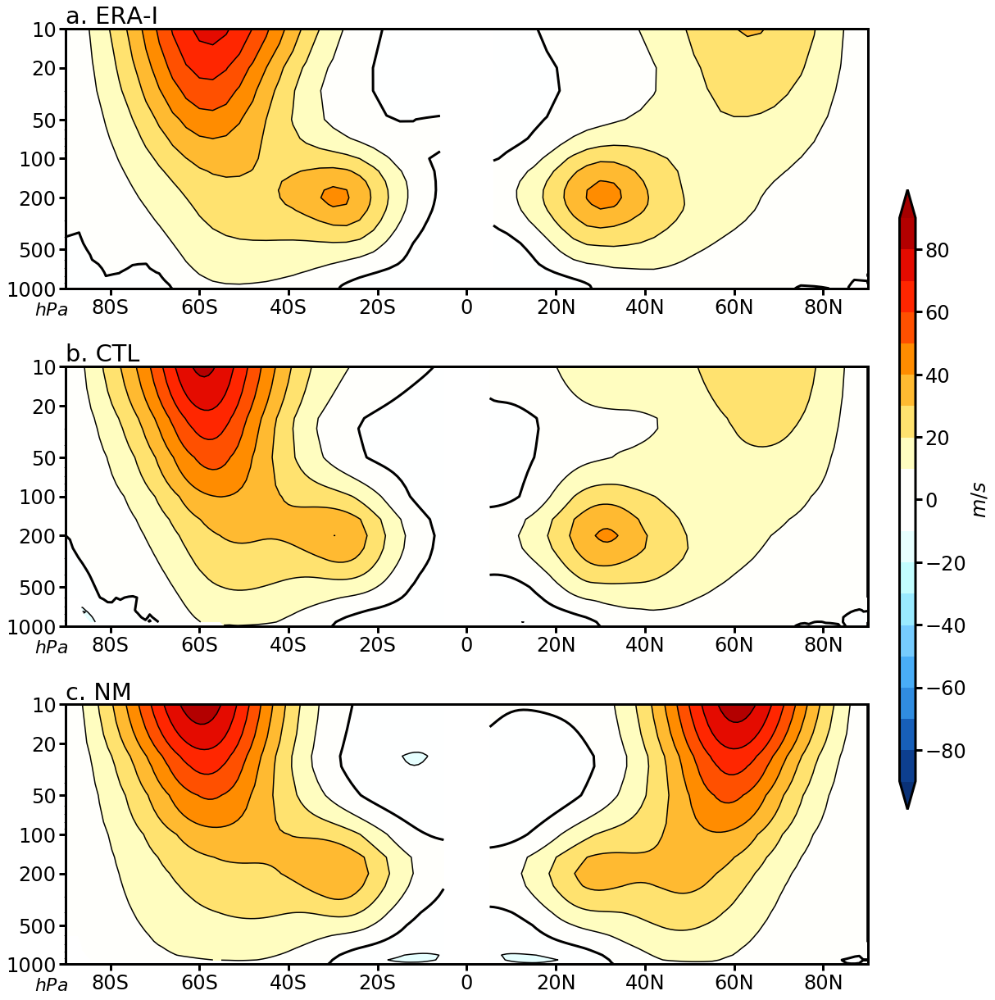

In [53]:
# Figure 1 Plot Z and U pole to pole

CTL = 'WACCM6_CTL'
EXP = 'WACCM6_Flat'

filename = 'JASMay2021Fig1U.eps'

nrows = 3; n=1
ncols = 1
pt=10
matplotlib.rcParams['figure.figsize']=(18,7*nrows)
matplotlib.rcParams.update({'font.size':24})
plt.rcParams["axes.linewidth"]  = 3
plt.rcParams['xtick.major.width'] = 3
plt.rcParams['ytick.major.width'] = 3
plt.rcParams['xtick.major.size'] = 8
plt.rcParams['ytick.major.size'] = 8

const = 1.0
ERAIconst = 1.0/9.81

var1 = 'Z3'
seas = 'DJF'
ZtoplotE = ERAIconst * ERAI_3deg['z'].isel(time=0)
ZSHtoplotE = ERAIconst * ERAI_3deg['z'].isel(time=2)

ZtoplotM = const * atmfields['p' + CTL][seas][var1].mean(dim='time')
ZtoplotNM = const * atmfields['p' + EXP][seas][var1].mean(dim='time')

ZSHtoplotM = const * atmfields['p' + CTL]['JJA'][var1].mean(dim='time')
ZSHtoplotNM = const * atmfields['p' + EXP]['JJA'][var1].mean(dim='time')


var2 = 'U'
UtoplotE = 1.0 * ERAI_3deg['u'].isel(time=0)
USHtoplotE = 1.0 * ERAI_3deg['u'].isel(time=2)

UtoplotM = const * atmfields['p' + CTL][seas][var2].mean(dim='time')
UtoplotNM = const * atmfields['p' + EXP][seas][var2].mean(dim='time')

USHtoplotM = const * atmfields['p' + CTL]['JJA'][var2].mean(dim='time')
USHtoplotNM = const * atmfields['p' + EXP]['JJA'][var2].mean(dim='time')


PStoplot = atmfields[CTL][seas]['PS'].mean(dim='time')

# mask where below ground
nlevs = len(ZtoplotM.lev_p)
for ilev in range(0,nlevs):
    plev = ZtoplotM.lev_p[ilev]
    UtoplotM[ilev,...] = np.where(PStoplot[...]/100. < plev,np.nan,UtoplotM[ilev,...])
    UtoplotNM[ilev,...] = np.where(PStoplot[...]/100. < plev,np.nan,UtoplotNM[ilev,...])
  
    USHtoplotM[ilev,...] = np.where(PStoplot[...]/100. < plev,np.nan,USHtoplotM[ilev,...])
    USHtoplotNM[ilev,...] = np.where(PStoplot[...]/100. < plev,np.nan,USHtoplotNM[ilev,...])

    
# zonal mean
UtoplotE = UtoplotE.mean(dim='longitude')
USHtoplotE = USHtoplotE.mean(dim='longitude')

UtoplotM = UtoplotM.mean(dim='lon')
UtoplotNM = UtoplotNM.mean(dim='lon')

USHtoplotM = USHtoplotM.mean(dim='lon')
USHtoplotNM = USHtoplotNM.mean(dim='lon')

levelsU = np.arange(-90,91,10)

# ERAI#
fig, axes = plt.subplots(nrows=nrows, ncols=ncols)

plt.subplot(nrows,1,n); n+=1

title = ('a. ERA-I') # ERA-I')

toplotNH = UtoplotE
toplotSH = USHtoplotE

toplotNH.values = np.where(toplotNH.latitude<5,np.nan,toplotNH.values)
toplotSH.values = np.where(toplotSH.latitude>-5,np.nan,toplotSH.values)

plt.contour(toplotNH.latitude, toplotNH.level,toplotNH.values,
    levels=levelsU,colors='k',extend='both',linestyles='-')
plt.contour(toplotNH.latitude, toplotNH.level,toplotNH.values,
    levels=[0],colors='k',extend='both',linestyles='-',linewidths=3)

plt.contourf(toplotNH.latitude, toplotNH.level,toplotNH.values,
    levels=levelsU,cmap=cmap_swc,extend='both',linestyles='-')

plt.contour(toplotSH.latitude, toplotSH.level,toplotSH.values,
    levels=levelsU,colors='k',extend='both',linestyles='-')
plt.contour(toplotSH.latitude, toplotSH.level,toplotSH.values,
    levels=[0],colors='k',extend='both',linestyles='-',linewidths=3)

plt.contourf(toplotSH.latitude, toplotSH.level,toplotSH.values,
    levels=levelsU,cmap=cmap_swc,extend='both',linestyles='-')

#plt.colorbar(label=r'$m/s$')

setaxes_latNS('','',ps=1000,pt=pt)    
plt.title(title,loc='left')
plt.ylabel('')
plt.text(-97,1600,r'$hPa$',fontsize=22)

# WACCM SOM
plt.subplot(nrows,1,n); n+=1

title = ('b. CTL') # CTL')

toplotNH = UtoplotM
toplotSH = USHtoplotM

toplotNH.values = np.where(toplotNH.lat<5,np.nan,toplotNH.values)
toplotSH.values = np.where(toplotSH.lat>-5,np.nan,toplotSH.values)

plt.contour(toplotNH.lat, toplotNH.lev_p,toplotNH.values,
    levels=levelsU,colors='k',extend='both',linestyles='-')
plt.contour(toplotNH.lat, toplotNH.lev_p,toplotNH.values,
    levels=[0],colors='k',extend='both',linestyles='-',linewidths=3)
plt.contourf(toplotNH.lat, toplotNH.lev_p,toplotNH.values,
    levels=levelsU,cmap=cmap_swc,extend='both',linestyles='-')

plt.contour(toplotSH.lat, toplotSH.lev_p,toplotSH.values,
    levels=levelsU,colors='k',extend='both',linestyles='-')
plt.contour(toplotSH.lat, toplotSH.lev_p,toplotSH.values,
    levels=[0],colors='k',extend='both',linestyles='-',linewidths=3)
plt.contourf(toplotSH.lat, toplotSH.lev_p,toplotSH.values,
    levels=levelsU,cmap=cmap_swc,extend='both',linestyles='-')
#plt.colorbar(label=r'$m/s$')

setaxes_latNS('','',ps=1000,pt=pt)    
plt.title(title,loc='left')
plt.ylabel('')
plt.text(-97,1600,r'$hPa$',fontsize=22)

# WACCM SOM Flat
plt.subplot(nrows,1,n); n+=1

title = ('c. NM') #NM')

toplotNH = UtoplotNM
toplotSH = USHtoplotNM

toplotNH.values = np.where(toplotNH.lat<5,np.nan,toplotNH.values)
toplotSH.values = np.where(toplotSH.lat>-5,np.nan,toplotSH.values)

plt.contour(toplotNH.lat, toplotNH.lev_p,toplotNH.values,
    levels=levelsU,colors='k',extend='both',linestyles='-')
plt.contour(toplotNH.lat, toplotNH.lev_p,toplotNH.values,
    levels=[0],colors='k',extend='both',linestyles='-',linewidths=3)
plt.contourf(toplotNH.lat, toplotNH.lev_p,toplotNH.values,
    levels=levelsU,cmap=cmap_swc,extend='both',linestyles='-')

plt.contour(toplotSH.lat, toplotSH.lev_p,toplotSH.values,
    levels=levelsU,colors='k',extend='both',linestyles='-')
plt.contour(toplotSH.lat, toplotSH.lev_p,toplotSH.values,
    levels=[0],colors='k',extend='both',linestyles='-',linewidths=3)
im = plt.contourf(toplotSH.lat, toplotSH.lev_p,toplotSH.values,
    levels=levelsU,cmap=cmap_swc,extend='both',linestyles='-')
#plt.colorbar(label=r'$m/s$')

setaxes_latNS('','',ps=1000,pt=pt)    
plt.title(title,loc='left')
plt.ylabel('')
plt.text(-97,1600,r'$hPa$',fontsize=22)

cbar_ax = fig.add_axes([0.91, 0.25, 0.015, 0.5])
cbar_ax.tick_params(labelsize=24) 
cb = fig.colorbar(im,cax=cbar_ax,orientation='vertical',drawedges=False)
cb.set_label(label = r'$m/s$',fontsize=24)


fig.subplots_adjust(right=0.88)
fig.subplots_adjust(hspace=0.3)
#fig.subplots_adjust(wspace=0.2)

plt.savefig('/home/disk/eos4/rachel/Projects/StationaryWaves/FiguresJAS/' + filename, dpi=None, facecolor='w', 
        edgecolor='w',
        orientation='portrait')

plt.show()


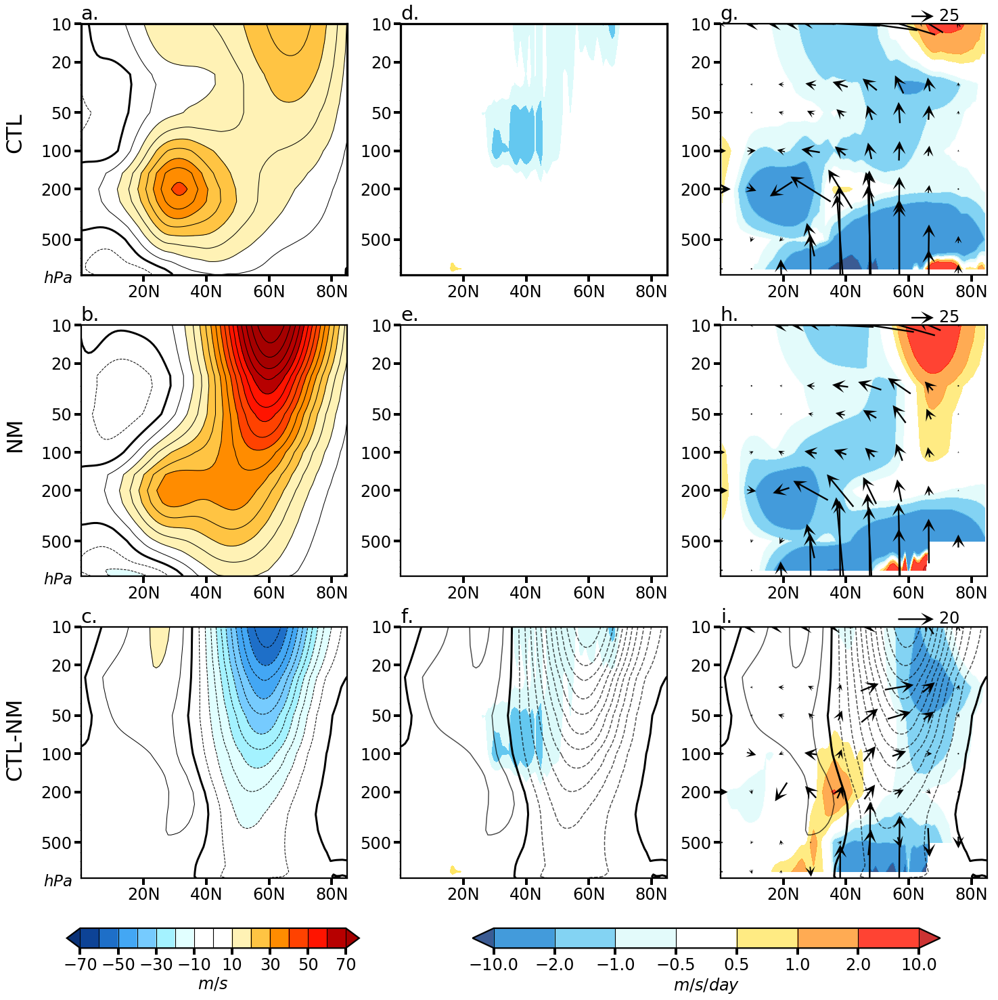

In [51]:
# Figure 2 - EP flux forcing and gravity wave forcing - CTL, NM, CTL-NM
filename = 'JASMay2021Fig2deltaUCTLNM.eps'

CTL = 'WACCM6_CTL'
FLAT = 'WACCM6_Flat'
SM = 'WACCM6_MSmooth'

Utitles = {}
Utitles['WACCM6_CTL'] = 'CTL'
Utitles['WACCM6_Flat'] = 'NM'
Utitles['WACCM6_Msmooth'] = 'SmoothM'

GWconst = 60*60*24
const=1.0

nrows = 3; ncols = 3; n=1
matplotlib.rcParams['figure.figsize']=(8*ncols,8 * nrows)
matplotlib.rcParams.update({'font.size':24})
plt.rcParams["axes.linewidth"]  = 3.25
plt.rcParams['xtick.major.width'] = 4
plt.rcParams['ytick.major.width'] = 4
plt.rcParams['xtick.major.size'] = 10
plt.rcParams['ytick.major.size'] = 10

#plotlabels = ['a.','c.','e.','b.','d.','f.']
plotlabels = ['a.','d.','g.','b.','e.','h.','c.','f.','i.']

seas='DJF'

# plot EP and U

cmax = 4.01
cmin = -4
cint = 1.0/3.0

startlat = 0
endlat = 85
startp = 850
endp = 2

Pt = 10
Ps = 950

fig, axes = plt.subplots(nrows=nrows, ncols=ncols)

levels = [850,500,200,100,50,30,10,5,2]
labels = ['CTL','NM','CTL-NM']
ilabel=0

clev = 4
Ulevels = np.arange(-80,80.1,5)
Ulevels_col = np.arange(-70,70.1,10)

Flevels = [-10,-2,-1,-0.5,0.5,1,2,10]

seas = 'DJF'

for iexp in [CTL, FLAT]:

    EP_CTL = EPfluxes_daily[seas][iexp].sel(lat=slice(startlat,endlat)).sel(lev_int = slice(endp,startp)).sel(lev_int = levels)

    U_CTL = const * atmfields['p' + iexp][seas]['U'].mean(dim='time').mean(dim='lon')

    GW_CTL = GWconst * atmfields['p' + iexp][seas]['UTGWORO'].mean(dim='time').mean(dim='lon')

    ax = plt.subplot(nrows,ncols,n); n+=1

    toplot = U_CTL
    
    plt.contour(U_CTL['lat'], U_CTL['lev_p'], U_CTL.values, levels=Ulevels, 
                          colors='k',linewidths=[1.0])
    plt.contour(U_CTL['lat'], U_CTL['lev_p'], U_CTL.values, levels=[0], 
                          colors='k',linewidths=[3.0])
    Uim = ax.contourf(toplot.lat,toplot.lev_p,toplot.values,
        levels=Ulevels_col,cmap=cmap_wc,extend='both',linestyles='--',alpha=1.0)

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    plt.ylabel('')
    #plt.ylabel(labels[ilabel],fontsize=28); ilabel+=1    
    plt.text(-12,1100,r'$hPa$',fontsize=23)    

    ax = plt.subplot(nrows,ncols,n); n+=1

    toplot = GW_CTL
    
    im = ax.contourf(toplot.lat, toplot.lev_p,toplot.values,
        levels=Flevels,colors=colors,extend='both',linestyles='--',alpha=1.0)

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    plt.ylabel('')

    plt.rcParams["axes.linewidth"]  = 2.25
    
    
    ax = plt.subplot(nrows,ncols,n); n+=1
    imEP = plotEPU2(EP_CTL,
             'WACCM',False,'Fp','Fphi',colors,Flevels,Ps,Pt,'lev_int',
                  m=1,n=10,Udiffs = U_CTL,key=True,plotU=False)

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    plt.ylabel('')
    
for ictl,iexp in zip([CTL],[FLAT]):

    EP_CTL = EPfluxes_daily[seas][ictl].sel(lat=slice(startlat,endlat)).sel(lev_int = slice(endp,startp)).sel(lev_int = levels)
    EP_NM = EPfluxes_daily[seas][iexp].sel(lat=slice(startlat,endlat)).sel(lev_int = slice(endp,startp)).sel(lev_int = levels)

    U_CTL = const * atmfields['p' + ictl][seas]['U'].mean(dim='time').mean(dim='lon')
    U_NM = const * atmfields['p' + iexp][seas]['U'].mean(dim='time').mean(dim='lon')

    GW_CTL = GWconst * atmfields['p' + ictl][seas]['UTGWORO'].mean(dim='time')
    GW_NM = GWconst * atmfields['p' + iexp][seas]['UTGWORO'].mean(dim='time')


    EPdiffs = EP_CTL - EP_NM
    Udiffs = U_CTL - U_NM
    GWdiffs = GW_CTL.mean(dim='lon') - GW_NM.mean(dim='lon')

    ax = plt.subplot(nrows,ncols,n); n+=1

    toplot = Udiffs
    
    Uim = ax.contourf(toplot.lat, toplot.lev_p,Udiffs.values,
        levels=Ulevels_col,cmap=cmap_wc,extend='both',linestyles='--',alpha=1.0)
    plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=Ulevels, 
                          colors='k',linewidths=[1.0])
    plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=[0], 
                          colors='k',linewidths=[3.0])

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    plt.ylabel('')
    plt.text(-12,1100,r'$hPa$',fontsize=23)    
    
    ax = plt.subplot(nrows,ncols,n); n+=1

    toplotM = GWconst * atmfields['p' + ictl][seas]['UTGWORO'].mean(dim='time')
    toplotNM = GWconst * atmfields['p' + iexp][seas]['UTGWORO'].mean(dim='time')

    toplot = toplotM-toplotNM
    
    im = ax.contourf(toplot.lat, toplot.lev_p,GWdiffs.values,
        levels=Flevels,colors = colors,extend='both',linestyles='--',alpha=1.0)

    cpU = plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=Ulevels, 
                          extend='both',colors='k',alpha=0.7)
    plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=[0], 
                          colors='k',linewidths=[3.0])

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    #plt.ylabel(labels[ilabel],fontsize=28); ilabel+=1  
    plt.ylabel('')

    ax = plt.subplot(nrows,ncols,n); n+=1
    im = plotEPU2(EPdiffs,
             'WACCM',True,'Fp','Fphi',colors,Flevels,Ps,Pt,'lev_int',
                  m=1,n=10,Udiffs = Udiffs,key=True)

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    plt.ylabel('')

    plt.rcParams["axes.linewidth"]  = 2.25


fig.subplots_adjust(bottom=0.15)
fig.subplots_adjust(hspace=0.2)
fig.subplots_adjust(wspace=0.2)

fig.text(0.06,0.79,labels[0],fontsize=32,rotation=90)
fig.text(0.06,0.53,labels[1],fontsize=32,rotation=90)
fig.text(0.06,0.29,labels[2],fontsize=32,rotation=90)
#fig.text(0.06,0.30,labels[3],fontsize=32,rotation=90)

cbar_ax = fig.add_axes([0.113, 0.09, 0.25, 0.017])
cbar_ax.tick_params(labelsize=24) 
cb = plt.colorbar(Uim,cax=cbar_ax,orientation='horizontal',drawedges=True,ticks=[-70,-50,-30,-10,10,30,50,70])
cb.set_label(label = r'$m/s$')

cbar_ax = fig.add_axes([0.46, 0.09, 0.4, 0.017])
cbar_ax.tick_params(labelsize=24) 
cb = plt.colorbar(im,cax=cbar_ax,orientation='horizontal',drawedges=True)
cb.set_label(label = r'$m/s/day$')

plt.savefig('/home/disk/eos4/rachel/Projects/StationaryWaves/FiguresJAS/' + filename, dpi=None, facecolor='w', 
        edgecolor='w',
        orientation='portrait')

plt.show()

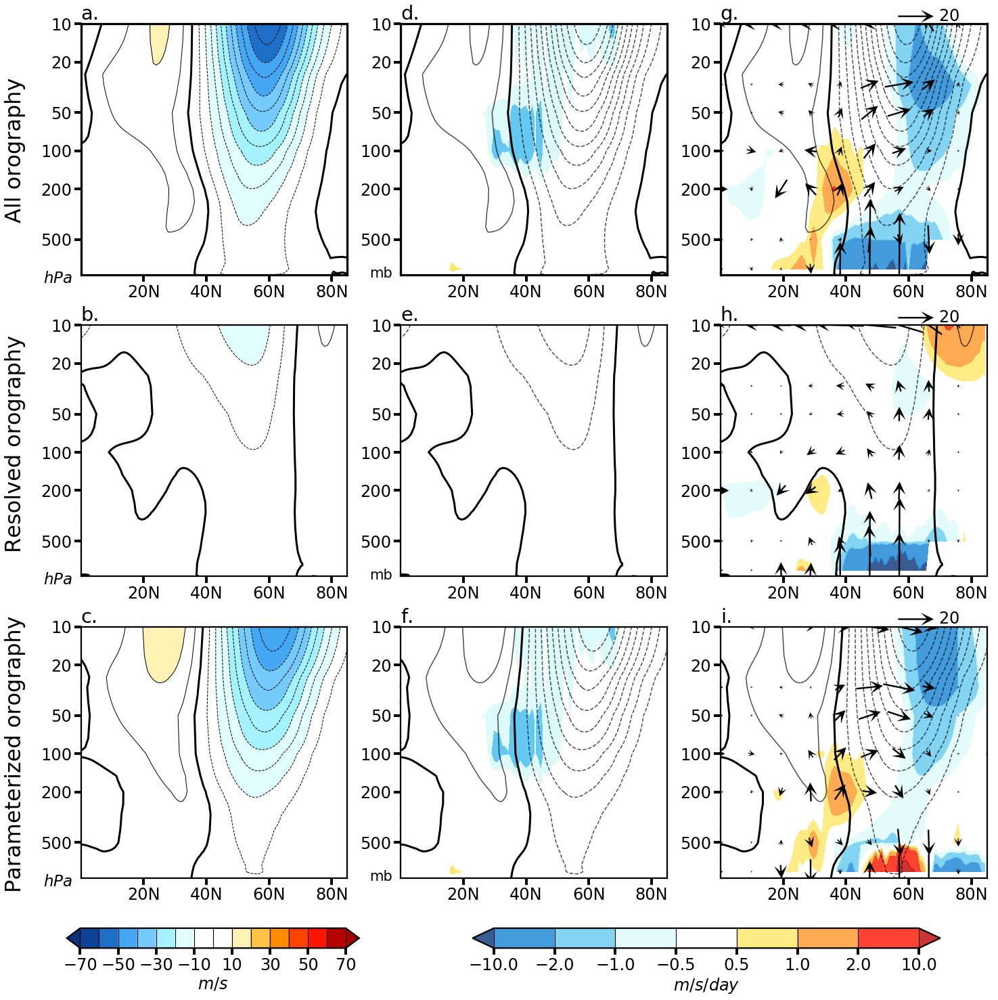

In [52]:
# Figure 3 - EP flux forcing and gravity wave forcing - resolved and unresolved orography
filename = 'JASMay2021Fig3deltaUrespar.eps'

CTL = 'WACCM6_CTL'
FLAT = 'WACCM6_Flat'
SM = 'WACCM6_MSmooth'

GWconst = 60*60*24
const=1.0

nrows = 3; ncols = 3; n=1
matplotlib.rcParams['figure.figsize']=(8*ncols,8 * nrows)
matplotlib.rcParams.update({'font.size':24})
plt.rcParams["axes.linewidth"]  = 3.25
plt.rcParams['xtick.major.width'] = 4
plt.rcParams['ytick.major.width'] = 4
plt.rcParams['xtick.major.size'] = 10
plt.rcParams['ytick.major.size'] = 10

#plotlabels = ['a.','c.','e.','b.','d.','f.']
plotlabels = ['a.','d.','g.','b.','e.','h.','c.','f.','i.']

seas='DJF'

# plot EP and U

cmax = 4.01
cmin = -4
cint = 1.0/3.0

startlat = 0
endlat = 85
startp = 850
endp = 2

Pt = 10
Ps = 950

fig, axes = plt.subplots(nrows=nrows, ncols=ncols)

levels = [850,500,200,100,50,30,10,5,2]
labels = ['All orography','Resolved orography','Parameterized orography']
ilabel=0

clev = 4
Ulevels = np.arange(-80,80.1,5)
Ulevels_col = np.arange(-70,70.1,10)

Flevels = [-10,-2,-1,-0.5,0.5,1,2,10]

seas = 'DJF'
    
for ictl,iexp in zip([CTL,SM,CTL],[FLAT,FLAT,SM]):

    EP_CTL = EPfluxes_daily[seas][ictl].sel(lat=slice(startlat,endlat)).sel(lev_int = slice(endp,startp)).sel(lev_int = levels)
    EP_NM = EPfluxes_daily[seas][iexp].sel(lat=slice(startlat,endlat)).sel(lev_int = slice(endp,startp)).sel(lev_int = levels)

    U_CTL = const * atmfields['p' + ictl][seas]['U'].mean(dim='time').mean(dim='lon')
    U_NM = const * atmfields['p' + iexp][seas]['U'].mean(dim='time').mean(dim='lon')

    GW_CTL = GWconst * atmfields['p' + ictl][seas]['UTGWORO'].mean(dim='time')
    GW_NM = GWconst * atmfields['p' + iexp][seas]['UTGWORO'].mean(dim='time')


    EPdiffs = EP_CTL - EP_NM
    Udiffs = U_CTL - U_NM
    GWdiffs = GW_CTL.mean(dim='lon') - GW_NM.mean(dim='lon')

    ax = plt.subplot(nrows,ncols,n); n+=1

    toplot = Udiffs
    
    Uim = ax.contourf(toplot.lat, toplot.lev_p,Udiffs.values,
        levels=Ulevels_col,cmap=cmap_wc,extend='both',linestyles='--',alpha=1.0)
    plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=Ulevels, 
                          colors='k',linewidths=[1.0])
    plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=[0], 
                          colors='k',linewidths=[3.0])

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    plt.ylabel('')
    plt.text(-12,1100,r'$hPa$',fontsize=23)    
    
    
    ax = plt.subplot(nrows,ncols,n); n+=1

    toplotM = GWconst * atmfields['p' + ictl][seas]['UTGWORO'].mean(dim='time')
    toplotNM = GWconst * atmfields['p' + iexp][seas]['UTGWORO'].mean(dim='time')

    toplot = toplotM-toplotNM
    
    im = ax.contourf(toplot.lat, toplot.lev_p,GWdiffs.values,
        levels=Flevels,colors = colors,extend='both',linestyles='--',alpha=1.0)

    cpU = plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=Ulevels, 
                          extend='both',colors='k',alpha=0.7)
    plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=[0], 
                          colors='k',linewidths=[3.0])

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    #plt.ylabel(labels[ilabel],fontsize=28); ilabel+=1  
    plt.ylabel('')
    plt.text(-10,1000,'mb',fontsize=21)

    ax = plt.subplot(nrows,ncols,n); n+=1
    im = plotEPU2(EPdiffs,
             'WACCM',True,'Fp','Fphi',colors,Flevels,Ps,Pt,'lev_int',
                  m=1,n=10,Udiffs = Udiffs,key=True)

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    plt.ylabel('')


    plt.rcParams["axes.linewidth"]  = 2.25


fig.subplots_adjust(bottom=0.15)
fig.subplots_adjust(hspace=0.2)
fig.subplots_adjust(wspace=0.2)

fig.text(0.06,0.82,labels[0],fontsize=32,rotation=90)
fig.text(0.06,0.6,labels[1],fontsize=32,rotation=90)
fig.text(0.06,0.36,labels[2],fontsize=32,rotation=90)
#fig.text(0.06,0.30,labels[3],fontsize=32,rotation=90)

cbar_ax = fig.add_axes([0.113, 0.09, 0.25, 0.017])
cbar_ax.tick_params(labelsize=24) 
cb = plt.colorbar(Uim,cax=cbar_ax,orientation='horizontal',drawedges=True,ticks=[-70,-50,-30,-10,10,30,50,70])
cb.set_label(label = r'$m/s$')

cbar_ax = fig.add_axes([0.46, 0.09, 0.4, 0.017])
cbar_ax.tick_params(labelsize=24) 
cb = plt.colorbar(im,cax=cbar_ax,orientation='horizontal',drawedges=True)
cb.set_label(label = r'$m/s/day$')

plt.savefig('/home/disk/eos4/rachel/Projects/StationaryWaves/FiguresJAS/' + filename, dpi=None, facecolor='w', 
        edgecolor='w',
        orientation='portrait')

plt.show()

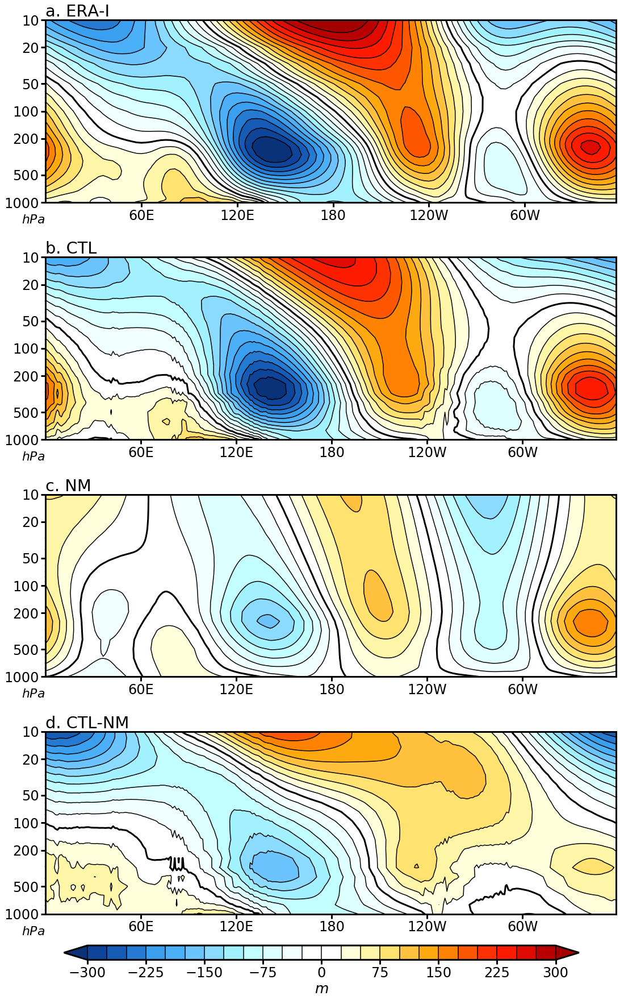

In [25]:
# Fig 4. plot cross-section Z at 45N, ERAI, Mountain vs Thermal with completely flat case
CTL = 'WACCM6_CTL'
EXP = 'WACCM6_Flat'

filename = 'JASMay2021Fig4Zcs45N.eps'
nrows = 4
matplotlib.rcParams['figure.figsize']=(18,7 * nrows)
matplotlib.rcParams.update({'font.size':24})
plt.rcParams["axes.linewidth"]  = 3
plt.rcParams['xtick.major.width'] = 3
plt.rcParams['ytick.major.width'] = 3
plt.rcParams['xtick.major.size'] = 8
plt.rcParams['ytick.major.size'] = 8

seas='DJF'
var='Z_logp'
Evar = 'var156'
lat = 45

ncols = 1
n=1

const = 1.0
ERAIconst = 1.0/9.81

levels1 = np.arange(-300,301,25)

#levels1 = [-750,-700,-650,-600,-550,-500,-450,-400,-350,-300,-250,-200,-150,-100,-50,0,
#           50,100,150,200,250,300,350,400,450,500,550,600,650,700,750]
levels2 = [50,100,150,200,250,300,350,400]

vmin0 = -100; vmax0=100
vmin = -100; vmax = 100
cmap='bwr'
nlevels0 = 16
nlevels = 16
cenlon = 0

fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
toplotM = (atmfields['p'+ CTL][seas][var].sel(lat = lat,method='nearest')).mean(dim='time')
toplotNM = (atmfields['p' + EXP][seas][var].sel(lat = lat,method='nearest')).mean(dim='time')

toplotERAI = ERAIconst * ERAI_3deg['z'].isel(time=0).sel(latitude = lat,method='nearest')
#ERAI['DJF']['z'].sel(latitude = lat,method='nearest')

#plot ERAI
ax = plt.subplot(nrows,ncols,n); n+=1
toplot = toplotERAI

toplot = toplot - toplot.mean(dim='longitude')
im = toplot.plot.contourf(
    levels=levels1,cmap=cmap_swc,extend='both',linestyles='--',add_colorbar = False)
toplot.plot.contour(
    levels=levels1,colors='k',extend='both',linestyles='-')
toplot.plot.contour(
    levels=[0],colors='k',extend='both',linestyles='-',linewidths=3.0)
title = ('a. ERA-I')
setaxes_lon(title,'')
plt.ylabel('')
plt.xlabel('')
plt.title('')
plt.text(-15,1700,r'$hPa$',fontsize=22)



#plot WACCM
ax = plt.subplot(nrows,ncols,n); n+=1
toplot = toplotM

toplot = toplot - toplot.mean(dim='lon')
im = toplot.plot.contourf(
    levels=levels1,cmap=cmap_swc,extend='both',linestyles='--',add_colorbar = False)
toplot.plot.contour(
    levels=levels1,colors='k',extend='both',linestyles='-')
toplot.plot.contour(
    levels=[0],colors='k',extend='both',linestyles='-',linewidths=3.0)
title = ('b. CTL')
setaxes_lon(title,'')
plt.ylabel('')
plt.xlabel('')
plt.title('')
plt.text(-15,1700,r'$hPa$',fontsize=22)

#plot WACCM
ax = plt.subplot(nrows,ncols,n); n+=1
toplot = toplotNM

toplot = toplot - toplot.mean(dim='lon')
im = toplot.plot.contourf(
    levels=levels1,cmap=cmap_swc,extend='both',linestyles='--',add_colorbar = False)
toplot.plot.contour(
    levels=levels1,colors='k',extend='both',linestyles='-')
toplot.plot.contour(
    levels=[0],colors='k',extend='both',linestyles='-',linewidths=3.0)
title = ('c. NM')
setaxes_lon(title,'')
plt.ylabel('')
plt.xlabel('')
plt.title('')
plt.text(-15,1700,r'$hPa$',fontsize=22)


#plot WACCM
ax = plt.subplot(nrows,ncols,n); n+=1
toplot = toplotM - toplotNM

toplot = toplot - toplot.mean(dim='lon')
im = toplot.plot.contourf(
    levels=levels1,cmap=cmap_swc,extend='both',linestyles='--',add_colorbar = False)
toplot.plot.contour(
    levels=levels1,colors='k',extend='both',linestyles='-')
toplot.plot.contour(
    levels=[0],colors='k',extend='both',linestyles='-',linewidths=3.0)
title = ('d. CTL-NM')
setaxes_lon(title,'')
plt.ylabel('')
plt.xlabel('')
plt.title('')
plt.text(-15,1700,r'$hPa$',fontsize=22)


fig.subplots_adjust(bottom=0.1)
fig.subplots_adjust(hspace=0.3)

cbar_ax = fig.add_axes([0.15, 0.06, 0.7, 0.0125])
cbar_ax.tick_params(labelsize=24) 
cb = fig.colorbar(im,cax=cbar_ax,orientation='horizontal',drawedges=True)
cb.set_label(label = r'$m$',fontsize=25)

plt.savefig('/home/disk/eos4/rachel/Projects/StationaryWaves/FiguresJAS/' + filename, dpi=None, facecolor='w', 
        edgecolor='w',
        orientation='portrait')

plt.show()


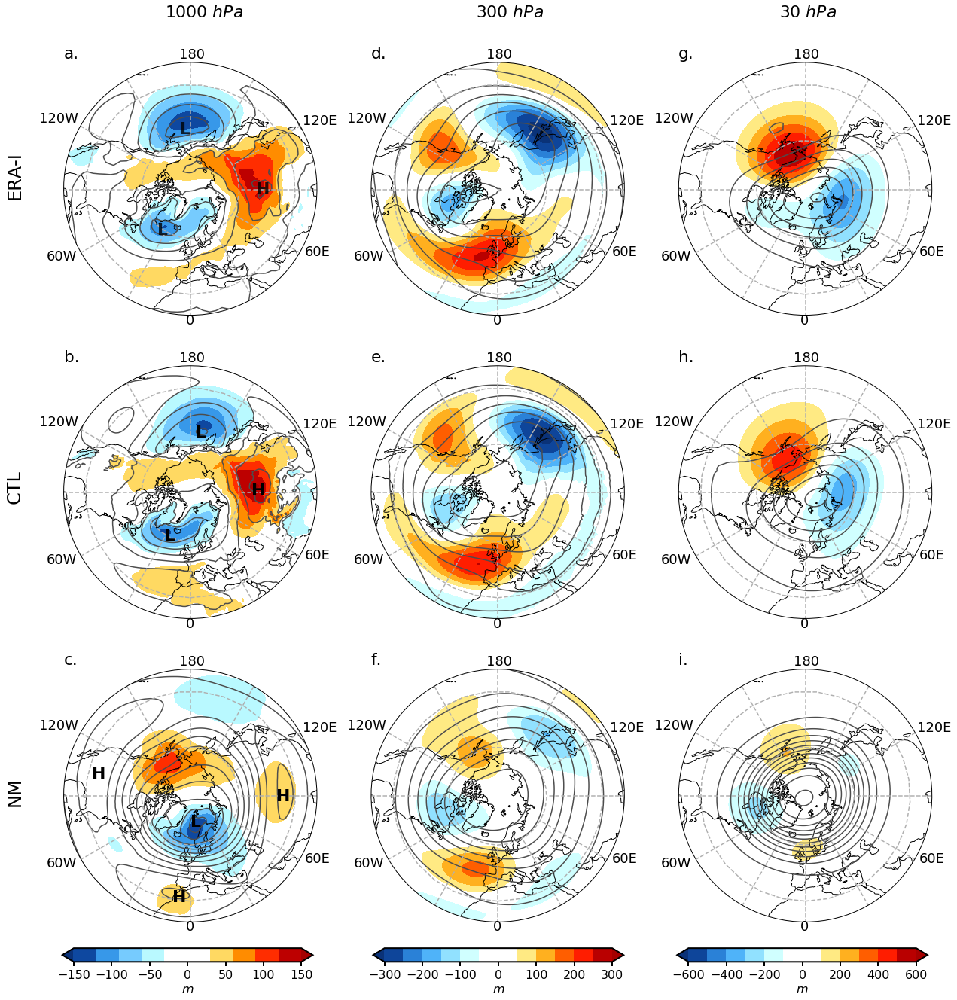

In [54]:
#Fig 5. Z30, Z300 and Z1000 WACCM ERAI, CTL, and CTL-NM 
filename = 'JASMay2021Fig5Zmapsw30.eps'

CTL = 'WACCM6_CTL'
EXP = 'WACCM6_Flat'
nrows=3
ncols = 3
matplotlib.rcParams['figure.figsize']=(7*ncols,7*nrows)
matplotlib.rcParams.update({'font.size':18})
plt.rcParams["axes.linewidth"]  = 2
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2
plt.rcParams['xtick.major.size'] = 6
plt.rcParams['ytick.major.size'] = 6

from cartopy.util import add_cyclic_point

seas='DJF'
var='Z3'

n=1

fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
fig.subplots_adjust(wspace=0.05)
fig.subplots_adjust(hspace=0.2)


alpha = 1.0 # doesn't seem to work when printing to eps
ccolor = [(0.3,0.3,0.3)]

vmin0 = 990; vmax0=1035
vmin = -100; vmax = 100
cmap='bwr'
nlevels0 = 16
nlevels = 16
cenlon = 0
const = 0.01
ERAIconst = 1.0/9.81
#plotCTL(seas,var,vmin=vmin0,vmax=vmax0)

font0 = FontProperties()
font0.set_weight('bold')
n=1
o=4
p=7

labeln = 0
labels = ['a.','b.','c.','d.','e.','f.','g.','h.','i.','j.']

n=1
for plev,vbar in [(1000,0.15),(300,0.423),(30,0.69)]:

    # plotting:
    toplotE = ERAIconst * ERAI_3deg['z'].isel(time=0).sel(level=plev)
            #ERAI['DJF']['z' + str(plev)]
        
    toplotM = atmfields['p' + CTL]['DJF']['Z3'].sel(lev_p=plev).mean(dim='time')
    toplotNM = atmfields['p' + EXP]['DJF']['Z3'].sel(lev_p=plev).mean(dim='time')


    if plev == 1000:
        levels1 = np.arange(-500,500.1,50.0)

        levels2 = np.arange(-150,150.1,30)      
    elif plev == 300:
        levels1 = np.arange(2000,15001,200)

        levels2 = np.arange(-300,301,50) 
    elif plev == 30:
        levels1 = np.arange(15000,30001,250)

        levels2 = np.arange(-600,601,100)
                
    # ERAI
    toplot = toplotE
    name = 'ERA-I'
    
    ax = set_NPstereo_small(ncols,nrows,n); n+=1

    toplot2 = toplot - toplot.mean(dim='longitude')

    new_da = add_lon(toplot,coord='longitude')
    new_da2 = add_lon(toplot2,coord='longitude')
   
    plt.contour(new_da.longitude, new_da.latitude,new_da.values,transform=ccrs.PlateCarree(),
            levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    # bold zero contour
    #plt.contour(new_da.longitude, new_da.latitude,new_da.values,transform=ccrs.PlateCarree(),
    #        levels=[0],colors=ccolor,extend='both',linewidths=2,alpha=alpha)  

    im = plt.contourf(new_da2.longitude, new_da2.latitude,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')
    
    plt.title(labels[labeln],loc='left'); labeln +=1
              
        
    # Draw H's and L's in fixed locations
    if plev == 300:
        #plt.text(0.40,0.46,'L',fontsize = 22,transform=ax.transAxes,fontproperties=font0,alpha=0.8)
        pass
    elif plev == 1000:
        plt.text(0.37,0.32,'L',fontsize = 22,transform=ax.transAxes,fontproperties=font0,alpha=0.8)
        plt.text(0.46,0.72,'L',fontsize = 22,transform=ax.transAxes,fontproperties=font0,alpha=0.8)
        plt.text(0.76,0.48,'H',fontsize = 22,transform=ax.transAxes,fontproperties=font0,alpha=0.8)

        
    ax = set_NPstereo_small(ncols,nrows,o); o+=1
    
    toplot = toplotM
    name = 'CTL'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')
  
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    # bold zero contour
    #plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
    #        levels=[0],colors=ccolor,extend='both',linewidths=2,alpha=alpha)  

    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')
    
    plt.title(labels[labeln],loc='left'); labeln +=1

    #plt.title(labels[labeln] + ' A = ' + '{:02.2f}'.format(float(latsum.values)),
    #                                                      loc='left'); labeln+=1

    # Draw H's and L's in fixed locations
    if plev == 300:
        #plt.text(0.42,0.45,'L',fontsize = 22,transform=ax.transAxes,fontproperties=font0)
        pass
    elif plev == 1000:
        plt.text(0.40,0.31,'L',fontsize = 22,transform=ax.transAxes,fontproperties=font0)
        plt.text(0.52,0.72,'L',fontsize = 22,transform=ax.transAxes,fontproperties=font0)
        plt.text(0.74,0.49,'H',fontsize = 22,transform=ax.transAxes,fontproperties=font0)

    ax = set_NPstereo_small(ncols,nrows,p); p+=1
    
    toplot = toplotNM
    name = 'NM'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')
  
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    # bold zero contour
    #plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
    #        levels=[0],colors=ccolor,extend='both',linewidths=2,alpha=alpha)
    
    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')
    
    plt.title(labels[labeln],loc='left'); labeln +=1
              

    title = (name)
    if plev == 1000:
        fig.text(0.08,0.79,'ERA-I',fontsize=24,rotation=90)
        fig.text(0.08,0.51,'CTL',fontsize=24,rotation=90)
        fig.text(0.08,0.24,'NM',fontsize=24,rotation=90)

    #plt.title(labels[labeln] + ' A = ' + '{:02.2f}'.format(float(latsum.values)),
    #                                                      loc='left'); labeln+=1

    # Draw H's and L's in fixed locations
    if plev == 300:
        #plt.text(0.48,0.47,'L',fontsize = 22,transform=ax.transAxes,fontproperties=font0)
        pass
    elif plev == 1000:
        plt.text(0.5,0.38,'L',fontsize = 22,transform=ax.transAxes,fontproperties=font0)
        plt.text(0.84,0.48,'H',fontsize = 22,transform=ax.transAxes,fontproperties=font0)
        plt.text(0.43,0.08,'H',fontsize = 22,transform=ax.transAxes,fontproperties=font0)
        plt.text(0.11,0.57,'H',fontsize = 22,transform=ax.transAxes,fontproperties=font0)

    if plev == 30:
        ticks = [-600,-400,-200,0,200,400,600]        
    elif plev == 300:
        ticks = [-300,-200,-100,0,100,200,300]
    elif plev == 850:
        ticks = [-150,-100,-50,0,50,100,150]
    elif plev == 1000:
        ticks = [-150,-100,-50,0,50,100,150]        
    cbar_ax = fig.add_axes([vbar -0.02, 0.09, 0.22, 0.012])
    cbar_ax.tick_params(labelsize=16) 
    cb = fig.colorbar(im,cax=cbar_ax,orientation='horizontal',ticks=ticks)
    cb.set_label(label = r'$m$',fontsize=16)
    fig.text(vbar+0.07,0.92,r'$' + str(plev) + '$ $hPa$',rotation=0,fontsize=22)

plt.subplots_adjust(wspace=0.15)

plt.savefig('/home/disk/eos4/rachel/Projects/StationaryWaves/FiguresJAS/' + filename, dpi=None, facecolor='w', 
        edgecolor='w',
        orientation='portrait')

plt.show()

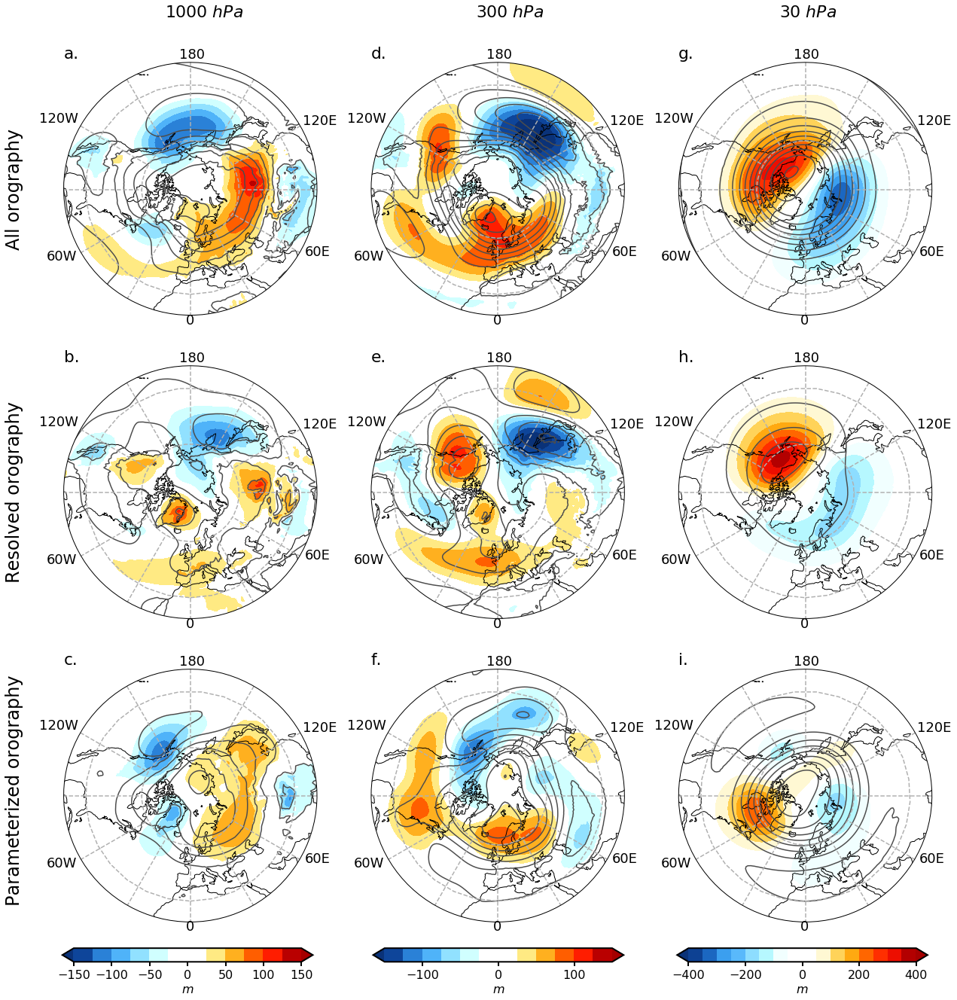

In [45]:
#Fig 6 Z300 and Z1000 CTL-NM, MSmooth-NM and CTL-MSmooth 
filename = 'JASMay2021Zmapsrespar.eps'

CTL = 'WACCM6_CTL'
SM = 'WACCM6_MSmooth'
NM = 'WACCM6_Flat'

nrows=3
ncols = 3
matplotlib.rcParams['figure.figsize']=(7*ncols,7*nrows)
matplotlib.rcParams.update({'font.size':18})
plt.rcParams["axes.linewidth"]  = 2
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2
plt.rcParams['xtick.major.size'] = 6
plt.rcParams['ytick.major.size'] = 6

from cartopy.util import add_cyclic_point

seas='DJF'
var='Z3'

n=1

fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
fig.subplots_adjust(wspace=0.05)
fig.subplots_adjust(hspace=0.2)


alpha = 1.0 # doesn't seem to work when printing to eps
ccolor = [(0.3,0.3,0.3)]

vmin0 = 990; vmax0=1035
vmin = -100; vmax = 100
cmap='bwr'
nlevels0 = 16
nlevels = 16
cenlon = 0
const = 0.01
ERAIconst = 1.0/9.81
#plotCTL(seas,var,vmin=vmin0,vmax=vmax0)

font0 = FontProperties()
font0.set_weight('bold')
n=1
o=4
p=7

labeln = 0
labels = ['a.','b.','c.','d.','e.','f.','g.','h.','i.','j.']

n=1

for plev,vbar in [(1000,0.15),(300,0.423),(30,0.69)]:
        
    toplotM = atmfields['p' + CTL]['DJF']['Z3'].sel(lev_p=plev).mean(dim='time')
    toplotNM = atmfields['p' + NM]['DJF']['Z3'].sel(lev_p=plev).mean(dim='time')
    toplotSM = atmfields['p' + SM]['DJF']['Z3'].sel(lev_p=plev).mean(dim='time')


    if plev == 1000:
        levels1 = np.arange(-1000,1000.1,50.0)

        levels2 = np.arange(-150,150.1,25)      
    elif plev == 300:
        levels1 = np.arange(-15000,15001,50)

        levels2 = np.arange(-150,151,25) 
    elif plev == 30:
        levels1 = np.arange(-4000,4000,200)

        levels2 = np.arange(-400,401,50)
                              
        
    ax = set_NPstereo_small(ncols,nrows,n); n+=1
    
    toplot = toplotM - toplotNM
    name = 'All'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')
  
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    # bold zero contour
    #plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
    #        levels=[0],colors=ccolor,extend='both',linewidths=2,alpha=alpha)  

    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')
    
    plt.title(labels[labeln],loc='left'); labeln +=1

    #plt.title(labels[labeln] + ' A = ' + '{:02.2f}'.format(float(latsum.values)),
    #                                                      loc='left'); labeln+=1

    ax = set_NPstereo_small(ncols,nrows,o); o+=1
    
    toplot = toplotSM-toplotNM
    name = 'Resolved'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')
  
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    # bold zero contour
    #plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
    #        levels=[0],colors=ccolor,extend='both',linewidths=2,alpha=alpha)
    
    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')
    
    plt.title(labels[labeln],loc='left'); labeln +=1

        
    ax = set_NPstereo_small(ncols,nrows,p); p+=1
    
    toplot = toplotM - toplotSM
    name = 'NM'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')
  
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    # bold zero contour
    #plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
    #        levels=[0],colors=ccolor,extend='both',linewidths=2,alpha=alpha)
    
    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')
    
    plt.title(labels[labeln],loc='left'); labeln +=1
        
        
    title = (name)
    if plev == 1000:
        fig.text(0.08,0.81,'All orography',fontsize=24,rotation=90)
        fig.text(0.08,0.57,'Resolved orography',fontsize=24,rotation=90)
        fig.text(0.08,0.33,'Parameterized orography',fontsize=24,rotation=90)

    #plt.title(labels[labeln] + ' A = ' + '{:02.2f}'.format(float(latsum.values)),
    #                                                      loc='left'); labeln+=1

    if plev == 30:
        ticks = [-600,-400,-200,0,200,400,600]        
    elif plev == 300:
        ticks = [-300,-200,-100,0,100,200,300]
    elif plev == 850:
        ticks = [-150,-100,-50,0,50,100,150]
    elif plev == 1000:
        ticks = [-150,-100,-50,0,50,100,150]        
    cbar_ax = fig.add_axes([vbar -0.02, 0.09, 0.22, 0.012])
    cbar_ax.tick_params(labelsize=16) 
    cb = fig.colorbar(im,cax=cbar_ax,orientation='horizontal',ticks=ticks)
    cb.set_label(label = r'$m$',fontsize=16)
    fig.text(vbar+0.07,0.92,r'$' + str(plev) + '$ $hPa$',rotation=0,fontsize=22)

plt.subplots_adjust(wspace=0.15)

plt.savefig('/home/disk/eos4/rachel/Projects/StationaryWaves/FiguresJAS/' + filename, dpi=None, facecolor='w', 
        edgecolor='w',
        orientation='portrait')

plt.show()

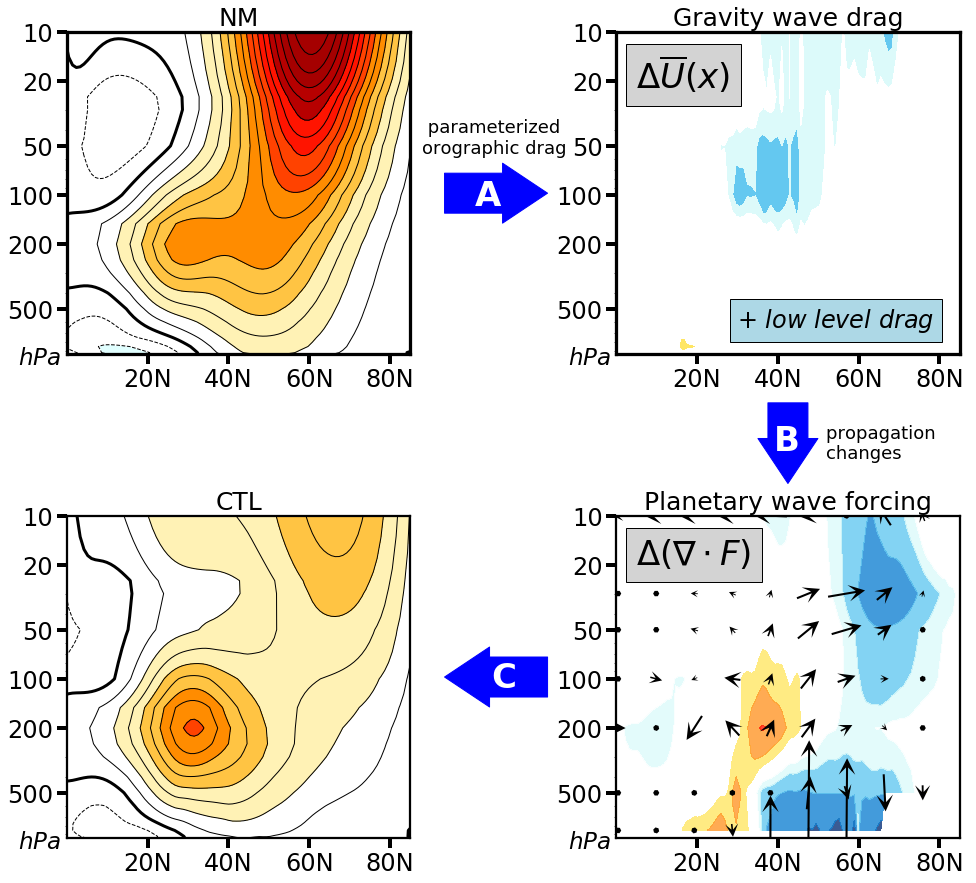

In [52]:
# Figure 7 - Schematic
filename = 'JASMay2021Schematic.eps'

CTL = 'WACCM6_CTL'
FLAT = 'WACCM6_Flat'
SM = 'WACCM6_MSmooth'

Utitles = {}
Utitles['WACCM6_CTL'] = 'CTL'
Utitles['WACCM6_Flat'] = 'NM'
Utitles['WACCM6_Msmooth'] = 'SmoothM'

GWconst = 60*60*24
const=1.0

nrows = 2; ncols = 2; n=1
matplotlib.rcParams['figure.figsize']=(8*ncols,8 * nrows)
matplotlib.rcParams.update({'font.size':24})
plt.rcParams["axes.linewidth"]  = 3.25
plt.rcParams['xtick.major.width'] = 4
plt.rcParams['ytick.major.width'] = 4
plt.rcParams['xtick.major.size'] = 10
plt.rcParams['ytick.major.size'] = 10

titlesize=25

#plotlabels = ['a.','c.','e.','b.','d.','f.']
plotlabels = ['a.','d.','g.','b.','e.','h.','c.','f.','i.']

seas='DJF'

# plot EP and U

startlat = 0
endlat = 85
startp = 850
endp = 2

Pt = 10
Ps = 950

fig, axes = plt.subplots(nrows=nrows, ncols=ncols)

levels = [850,500,200,100,50,30,10,5,2]
labels = ['CTL','NM','CTL-NM']
ilabel=0

clev = 4
Ulevels = np.arange(-80,80.1,5)
Ulevels_col = np.arange(-70,70.1,10)

Flevels = [-10,-2,-1,-0.5,0.5,1,2,10]

seas = 'DJF'

# Plot 1. NM Zonal mean zonal wind

iexp=FLAT
U_CTL = const * atmfields['p' + iexp][seas]['U'].mean(dim='time').mean(dim='lon')
ax = plt.subplot(nrows,ncols,n); n+=1

toplot = U_CTL

plt.contour(U_CTL['lat'], U_CTL['lev_p'], U_CTL.values, levels=Ulevels, 
                      colors='k',linewidths=[1.0])
plt.contour(U_CTL['lat'], U_CTL['lev_p'], U_CTL.values, levels=[0], 
                      colors='k',linewidths=[3.0])
Uim = ax.contourf(toplot.lat,toplot.lev_p,toplot.values,
    levels=Ulevels_col,cmap=cmap_wc,extend='both',linestyles='--',alpha=1.0)

setaxes_latN('','',Ps,Pt,fontsize = 20)
plt.xlim(startlat,endlat)
plt.ylabel('')
plt.title('NM',fontsize=titlesize)
plt.text(-12,1100,r'$hPa$',fontsize=23)    


# Plot 2. Gravity wave drag from Rough mountains
iexp=CTL
GW_1 = GWconst * atmfields['p' + iexp][seas]['UTGWORO'].mean(dim='time').mean(dim='lon')
iexp=FLAT
GW_2 = GWconst * atmfields['p' + iexp][seas]['UTGWORO'].mean(dim='time').mean(dim='lon')

ax = plt.subplot(nrows,ncols,n); n+=1
toplot = GW_1 - GW_2
im = ax.contourf(toplot.lat, toplot.lev_p,toplot.values,
    levels=Flevels,colors=colors,extend='both',linestyles='--',alpha=1.0)

setaxes_latN('','',Ps,Pt,fontsize = 20)
plt.xlim(startlat,endlat)
plt.ylabel('')
plt.title('Gravity wave drag',fontsize=titlesize)
plt.text(-12,1100,r'$hPa$',fontsize=23)    

plt.rcParams["axes.linewidth"]  = 2.25

# Plot 3 (bottom left) CTL wind
iexp=CTL
U_CTL = const * atmfields['p' + iexp][seas]['U'].mean(dim='time').mean(dim='lon')
ax = plt.subplot(nrows,ncols,n); n+=1

toplot = U_CTL

plt.contour(U_CTL['lat'], U_CTL['lev_p'], U_CTL.values, levels=Ulevels, 
                      colors='k',linewidths=[1.0])
plt.contour(U_CTL['lat'], U_CTL['lev_p'], U_CTL.values, levels=[0], 
                      colors='k',linewidths=[3.0])
Uim = ax.contourf(toplot.lat,toplot.lev_p,toplot.values,
    levels=Ulevels_col,cmap=cmap_wc,extend='both',linestyles='--',alpha=1.0)

setaxes_latN('','',Ps,Pt,fontsize = 20)
plt.xlim(startlat,endlat)
plt.ylabel('')
plt.title('CTL',fontsize=titlesize)
plt.text(-12,1100,r'$hPa$',fontsize=23)    


# Plot 4 (bottom right): EP fluxes in CTL-NM
iexp=CTL
EP_1 = EPfluxes_daily[seas][iexp].sel(lat=slice(startlat,endlat)).sel(lev_int = slice(endp,startp)).sel(lev_int = levels)
iexp=FLAT
EP_2 = EPfluxes_daily[seas][iexp].sel(lat=slice(startlat,endlat)).sel(lev_int = slice(endp,startp)).sel(lev_int = levels)
        
ax = plt.subplot(nrows,ncols,n); n+=1
imEP = plotEPU2(EP_1 - EP_2,
         'WACCM',True,'Fp','Fphi',colors,Flevels,Ps,Pt,'lev_int',
              m=1,n=10,Udiffs = U_CTL,key=False,plotU=False,sch=True)

setaxes_latN('','',Ps,Pt,fontsize = 20)
plt.xlim(startlat,endlat)
plt.ylabel('')
plt.title('Planetary wave forcing',fontsize=titlesize)
plt.text(-12,1100,r'$hPa$',fontsize=23)    


ax.annotate('', xy=(-0.2, 2), xycoords='axes fraction', xytext=(-0.5, 2), 
            arrowprops=dict(color='b',width=40,headlength=45,headwidth=60)) #,mutation_scale=50))


ax.annotate('', xy=(0.50, 1.1), xycoords='axes fraction', xytext=(0.50, 1.35), 
            arrowprops=dict(color='b',width=40,headlength=45,headwidth=60)) #,mutation_scale=50))


ax.annotate('', xy=(-0.5, 0.5), xycoords='axes fraction', xytext=(-0.2, 0.5), 
            arrowprops=dict(color='b',width=40,headlength=45,headwidth=60)) #,mutation_scale=50))


ax.text(-35,0.125,'A',fontsize=34,color='w',fontweight='bold')
ax.text(39,4,'B',fontsize=34,color='w',fontweight='bold')
ax.text(-31,114,'C',fontsize=34,color='w',fontweight='bold')

ax.text(-48,0.06,' parameterized  \norographic drag',fontsize=18,color='k')
ax.text(52,4.5,'propagation \nchanges',fontsize=18,color='k')

props = dict(boxstyle='square', facecolor='lightgrey', alpha=1.0)
props2 = dict(boxstyle='square', facecolor='lightblue', alpha=1.0)

# place a text box in upper left in axes coords
#ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14,
#        verticalalignment='top', bbox=props)

ax.text(5,0.024,r'$\Delta \overline{U}(x)$',fontsize=34,bbox=props)
ax.text(30,0.7,r'$+$ $low$ $level$ $drag$',fontsize=24,bbox=props2)

ax.text(5,20.0,r'$\Delta (\nabla \cdot F)$',fontsize=34,bbox=props)

#plt.arrow(40,10,10,0,width=5)

fig.subplots_adjust(bottom=0.15)
fig.subplots_adjust(top=0.85)

fig.subplots_adjust(hspace=0.5)
fig.subplots_adjust(wspace=0.6)

#fig.text(0.06,0.79,labels[0],fontsize=32,rotation=90)
#fig.text(0.06,0.53,labels[1],fontsize=32,rotation=90)
#fig.text(0.06,0.29,labels[2],fontsize=32,rotation=90)
#fig.text(0.06,0.30,labels[3],fontsize=32,rotation=90)

plt.savefig('/home/disk/eos4/rachel/Projects/StationaryWaves/FiguresJAS/' + filename, dpi=None, facecolor='w', 
        edgecolor='w',
        orientation='portrait')

plt.show()

### Appendix Figures

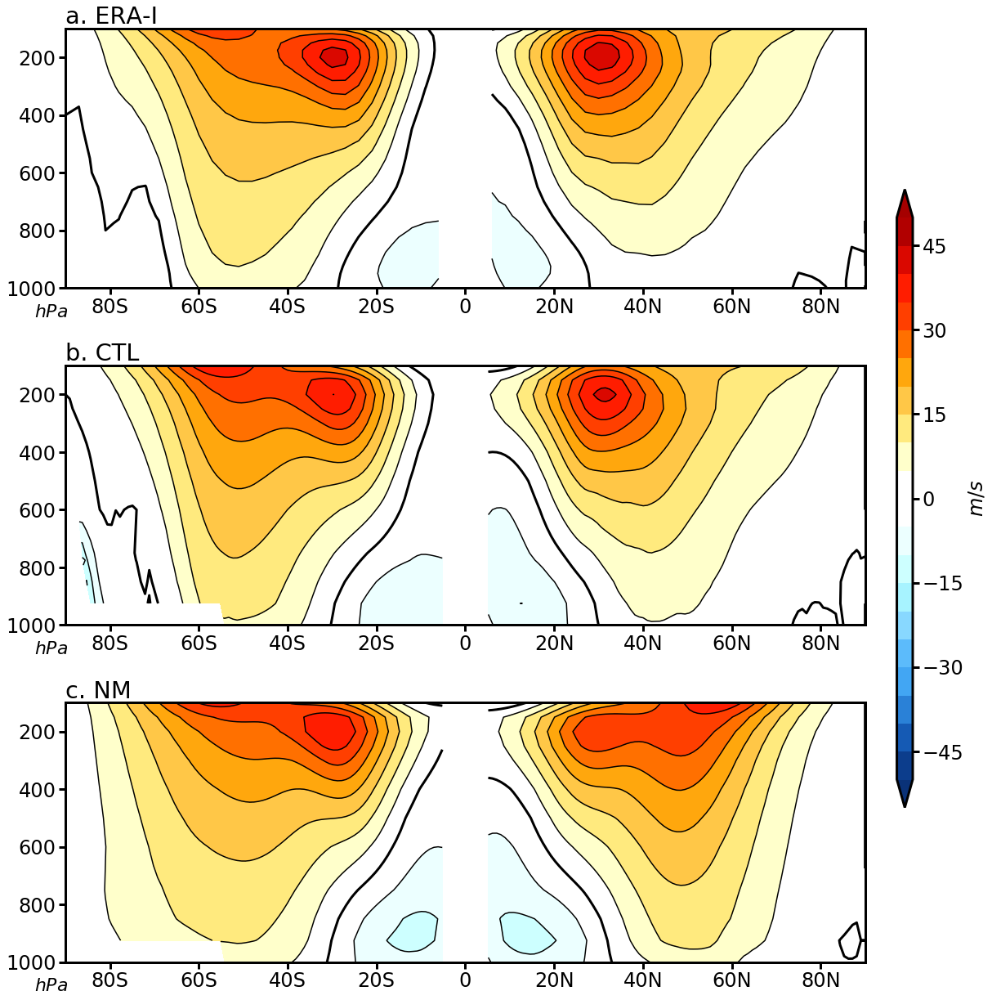

In [31]:
# Figure A1 - troposphere focus. Plot Z and U pole to pole using completely flat case 

CTL = 'WACCM6_CTL'
EXP = 'WACCM6_Flat'

filename = 'JASMay2021Fig1Utrop.eps'

nrows = 3; n=1
ncols = 1
pt=100
matplotlib.rcParams['figure.figsize']=(18,7*nrows)
matplotlib.rcParams.update({'font.size':24})
plt.rcParams["axes.linewidth"]  = 3
plt.rcParams['xtick.major.width'] = 3
plt.rcParams['ytick.major.width'] = 3
plt.rcParams['xtick.major.size'] = 8
plt.rcParams['ytick.major.size'] = 8

const = 1.0
ERAIconst = 1.0/9.81

var1 = 'Z3'
seas = 'DJF'

var2 = 'U'
UtoplotE = 1.0 * ERAI_3deg['u'].isel(time=0)
USHtoplotE = 1.0 * ERAI_3deg['u'].isel(time=2)

UtoplotM = const * atmfields['p' + CTL][seas][var2].mean(dim='time')
UtoplotNM = const * atmfields['p' + EXP][seas][var2].mean(dim='time')

USHtoplotM = const * atmfields['p' + CTL]['JJA'][var2].mean(dim='time')
USHtoplotNM = const * atmfields['p' + EXP]['JJA'][var2].mean(dim='time')


PStoplot = atmfields[CTL][seas]['PS'].mean(dim='time')

# mask where below ground
nlevs = len(ZtoplotM.lev_p)
for ilev in range(0,nlevs):
    plev = ZtoplotM.lev_p[ilev]    
    UtoplotM[ilev,...] = np.where(PStoplot[...]/100. < plev,np.nan,UtoplotM[ilev,...])
    UtoplotNM[ilev,...] = np.where(PStoplot[...]/100. < plev,np.nan,UtoplotNM[ilev,...])
    
    USHtoplotM[ilev,...] = np.where(PStoplot[...]/100. < plev,np.nan,USHtoplotM[ilev,...])
    USHtoplotNM[ilev,...] = np.where(PStoplot[...]/100. < plev,np.nan,USHtoplotNM[ilev,...])

    
# zonal mean
UtoplotE = UtoplotE.mean(dim='longitude')
USHtoplotE = USHtoplotE.mean(dim='longitude')

UtoplotM = UtoplotM.mean(dim='lon')
UtoplotNM = UtoplotNM.mean(dim='lon')
USHtoplotM = USHtoplotM.mean(dim='lon')
USHtoplotNM = USHtoplotNM.mean(dim='lon')

levelsU = np.arange(-50,51,5)

# ERAI#
fig, axes = plt.subplots(nrows=nrows, ncols=ncols)

plt.subplot(nrows,1,n); n+=1

title = ('a. ERA-I') # ERA-I')

toplotNH = UtoplotE
toplotSH = USHtoplotE

toplotNH.values = np.where(toplotNH.latitude<5,np.nan,toplotNH.values)
toplotSH.values = np.where(toplotSH.latitude>-5,np.nan,toplotSH.values)

plt.contour(toplotNH.latitude, toplotNH.level,toplotNH.values,
    levels=levelsU,colors='k',extend='both',linestyles='-')
plt.contour(toplotNH.latitude, toplotNH.level,toplotNH.values,
    levels=[0],colors='k',extend='both',linestyles='-',linewidths=3)
plt.contourf(toplotNH.latitude, toplotNH.level,toplotNH.values,
    levels=levelsU,cmap=cmap_swc,extend='both',linestyles='-')

plt.contour(toplotSH.latitude, toplotSH.level,toplotSH.values,
    levels=levelsU,colors='k',extend='both',linestyles='-')
plt.contour(toplotSH.latitude, toplotSH.level,toplotSH.values,
    levels=[0],colors='k',extend='both',linestyles='-',linewidths=3)
plt.contourf(toplotSH.latitude, toplotSH.level,toplotSH.values,
    levels=levelsU,cmap=cmap_swc,extend='both',linestyles='-')

#plt.colorbar(label=r'$m/s$')

setaxes_latNS('','',ps=1000,pt=pt,log=False)    
plt.title(title,loc='left')
plt.ylabel('')
plt.text(-97,1100,r'$hPa$',fontsize=22)

# WACCM SOM
plt.subplot(nrows,1,n); n+=1

title = ('b. CTL') # CTL')

toplotNH = UtoplotM
toplotSH = USHtoplotM

toplotNH.values = np.where(toplotNH.lat<5,np.nan,toplotNH.values)
toplotSH.values = np.where(toplotSH.lat>-5,np.nan,toplotSH.values)

plt.contour(toplotNH.lat, toplotNH.lev_p,toplotNH.values,
    levels=levelsU,colors='k',extend='both',linestyles='-')
plt.contour(toplotNH.lat, toplotNH.lev_p,toplotNH.values,
    levels=[0],colors='k',extend='both',linestyles='-',linewidths=3)
plt.contourf(toplotNH.lat, toplotNH.lev_p,toplotNH.values,
    levels=levelsU,cmap=cmap_swc,extend='both',linestyles='-')

plt.contour(toplotSH.lat, toplotSH.lev_p,toplotSH.values,
    levels=levelsU,colors='k',extend='both',linestyles='-')
plt.contour(toplotSH.lat, toplotSH.lev_p,toplotSH.values,
    levels=[0],colors='k',extend='both',linestyles='-',linewidths=3)
plt.contourf(toplotSH.lat, toplotSH.lev_p,toplotSH.values,
    levels=levelsU,cmap=cmap_swc,extend='both',linestyles='-')
#plt.colorbar(label=r'$m/s$')

setaxes_latNS('','',ps=1000,pt=pt,log=False)    
plt.title(title,loc='left')
plt.ylabel('')
plt.text(-97,1100,r'$hPa$',fontsize=22)

# WACCM SOM Flat
plt.subplot(nrows,1,n); n+=1

title = ('c. NM') #NM')

toplotNH = UtoplotNM
toplotSH = USHtoplotNM

toplotNH.values = np.where(toplotNH.lat<5,np.nan,toplotNH.values)
toplotSH.values = np.where(toplotSH.lat>-5,np.nan,toplotSH.values)

plt.contour(toplotNH.lat, toplotNH.lev_p,toplotNH.values,
    levels=levelsU,colors='k',extend='both',linestyles='-')
plt.contour(toplotNH.lat, toplotNH.lev_p,toplotNH.values,
    levels=[0],colors='k',extend='both',linestyles='-',linewidths=3)
plt.contourf(toplotNH.lat, toplotNH.lev_p,toplotNH.values,
    levels=levelsU,cmap=cmap_swc,extend='both',linestyles='-')

plt.contour(toplotSH.lat, toplotSH.lev_p,toplotSH.values,
    levels=levelsU,colors='k',extend='both',linestyles='-')
plt.contour(toplotSH.lat, toplotSH.lev_p,toplotSH.values,
    levels=[0],colors='k',extend='both',linestyles='-',linewidths=3)
im = plt.contourf(toplotSH.lat, toplotSH.lev_p,toplotSH.values,
    levels=levelsU,cmap=cmap_swc,extend='both',linestyles='-')
#plt.colorbar(label=r'$m/s$')

setaxes_latNS('','',ps=1000,pt=pt,log=False)  
plt.ylabel(1000,)
plt.title(title,loc='left')
plt.ylabel('')
plt.text(-97,1100,r'$hPa$',fontsize=22)

cbar_ax = fig.add_axes([0.91, 0.25, 0.015, 0.5])
cbar_ax.tick_params(labelsize=24) 
cb = fig.colorbar(im,cax=cbar_ax,orientation='vertical',drawedges=False)
cb.set_label(label = r'$m/s$',fontsize=24)


#fig.subplots_adjust(bottom=0.15)
fig.subplots_adjust(right=0.88)
fig.subplots_adjust(hspace=0.3)
#fig.subplots_adjust(wspace=0.2)

plt.savefig('/home/disk/eos4/rachel/Projects/StationaryWaves/FiguresJAS/' + filename, dpi=None, facecolor='w', 
        edgecolor='w',
        orientation='portrait')

plt.show()


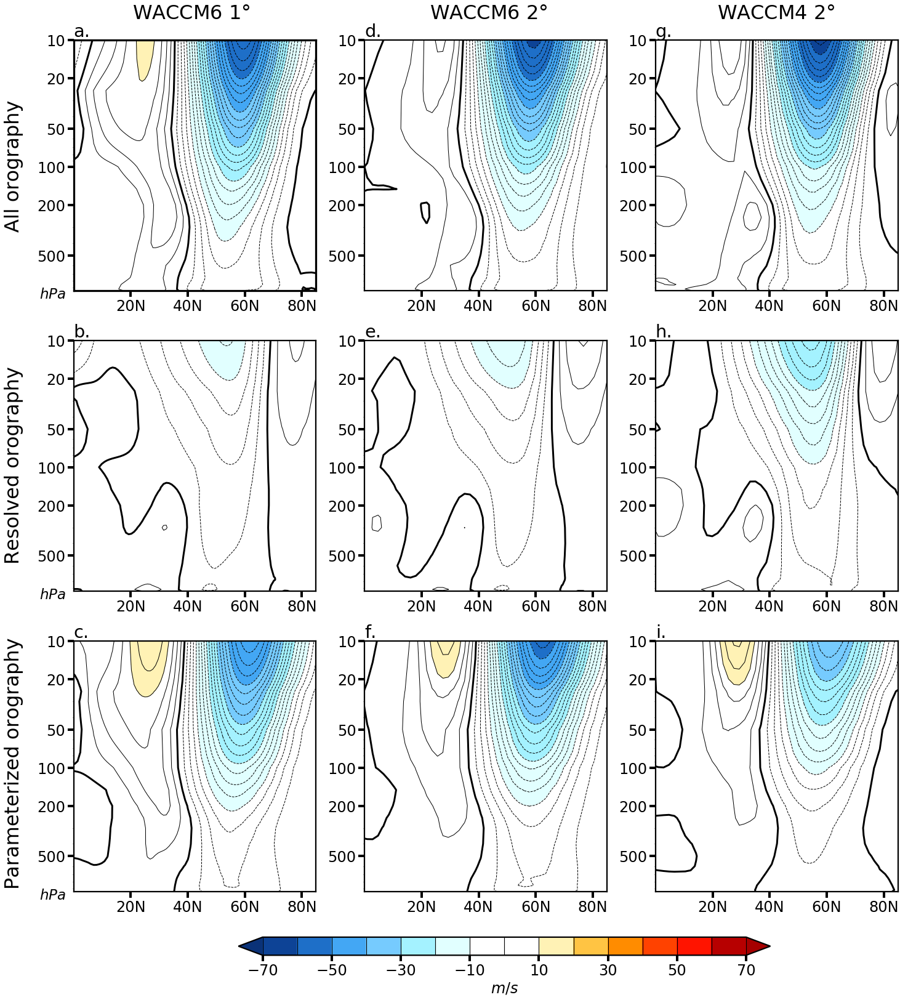

In [56]:
# Appendix Figure A2: WACCM4 vs WACCM6 - resolved and unresolved orography
filename = 'JASMay2021AppendixdeltaUWACCM4WACCM6.eps'

CTL4 = 'WACCM4_CTL'
FLAT4 = 'WACCM4_Flat'
SM4 = 'WACCM4_MSmooth'

CTL6 = 'WACCM6_CTL'
FLAT6 = 'WACCM6_Flat'
SM6 = 'WACCM6_MSmooth'

CTL6_2 = 'WACCM6_2deg_CTL'
FLAT6_2 = 'WACCM6_2deg_Flat'
SM6_2 = 'WACCM6_2deg_MSmooth'


Utitles = {}
Utitles['WACCM4_CTL'] = 'CTL'
Utitles['WACCM4_Flat'] = 'NM'
Utitles['WACCM4_Msmooth'] = 'SmoothM'
Utitles['WACCM6_CTL'] = 'CTL'
Utitles['WACCM6_Flat'] = 'NM'
Utitles['WACCM6_Msmooth'] = 'SmoothM'

GWconst = 60*60*24
const=1.0

nrows = 3; ncols = 3; n=1
matplotlib.rcParams['figure.figsize']=(8*ncols,8 * nrows)
matplotlib.rcParams.update({'font.size':24})
plt.rcParams["axes.linewidth"]  = 3.25
plt.rcParams['xtick.major.width'] = 4
plt.rcParams['ytick.major.width'] = 4
plt.rcParams['xtick.major.size'] = 10
plt.rcParams['ytick.major.size'] = 10

#plotlabels = ['a.','c.','e.','b.','d.','f.']
plotlabels = ['a.','d.','g.','b.','e.','h.','c.','f.','i.']

seas='DJF'

# plot EP and U

cmax = 4.01
cmin = -4
cint = 1.0/3.0

startlat = 0
endlat = 85
startp = 850
endp = 2

Pt = 10
Ps = 950

fig, axes = plt.subplots(nrows=nrows, ncols=ncols)

levels = [850,500,200,100,50,30,10,5,2]
labels = ['All orography','Resolved orography','Parameterized orography']
ilabel=0

clev = 4
Ulevels = np.arange(-80,80.1,2.5)
Ulevels_col = np.arange(-70,70.1,10)

Flevels = [-10,-2,-1,-0.5,0.5,1,2,10]

seas = 'DJF'
    
for ictl,iexp in zip([CTL6, CTL6_2, CTL4, SM6,  SM6_2,  SM4,  CTL6,CTL6_2,CTL4],
                     [FLAT6,FLAT6_2,FLAT4,FLAT6,FLAT6_2,FLAT4,SM6, SM6_2, SM4]):

    U_CTL = const * atmfields['p' + ictl][seas]['U'].mean(dim='time').mean(dim='lon')
    U_NM = const * atmfields['p' + iexp][seas]['U'].mean(dim='time').mean(dim='lon')

    Udiffs = U_CTL - U_NM

    ax = plt.subplot(nrows,ncols,n); n+=1

    toplot = Udiffs
    
    Uim = ax.contourf(toplot.lat, toplot.lev_p,Udiffs.values,
        levels=Ulevels_col,cmap=cmap_wc,extend='both',linestyles='--',alpha=1.0)
    plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=Ulevels, 
                          colors='k',linewidths=[1.0])
    plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=[0], 
                          colors='k',linewidths=[3.0])

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    plt.ylabel('')

    if np.mod(n-2,3) == 0:
        plt.text(-12,1100,r'$hPa$',fontsize=23)    
    
    plt.rcParams["axes.linewidth"]  = 2.25
    
fig.subplots_adjust(top=0.95)
fig.subplots_adjust(bottom=0.15)
fig.subplots_adjust(hspace=0.2)
fig.subplots_adjust(wspace=0.2)

fig.text(0.06,0.88,labels[0],fontsize=32,rotation=90)
fig.text(0.06,0.63,labels[1],fontsize=32,rotation=90)
fig.text(0.06,0.375,labels[2],fontsize=32,rotation=90)
#fig.text(0.06,0.30,labels[3],fontsize=32,rotation=90)

fig.text(0.18,0.97,'WACCM6 ' + r'$1\degree$',fontsize=32)
fig.text(0.46,0.97,'WACCM6 ' + r'$2\degree$',fontsize=32)
fig.text(0.73,0.97,'WACCM4 ' + r'$2\degree$',fontsize=32)


cbar_ax = fig.add_axes([0.28, 0.09, 0.5, 0.017])
cbar_ax.tick_params(labelsize=24) 
cb = plt.colorbar(Uim,cax=cbar_ax,orientation='horizontal',drawedges=True,ticks=[-70,-50,-30,-10,10,30,50,70])
cb.set_label(label = r'$m/s$')


plt.savefig('/home/disk/eos4/rachel/Projects/StationaryWaves/FiguresJAS/' + filename, dpi=None, facecolor='w', 
        edgecolor='w',
        orientation='portrait')

plt.show()

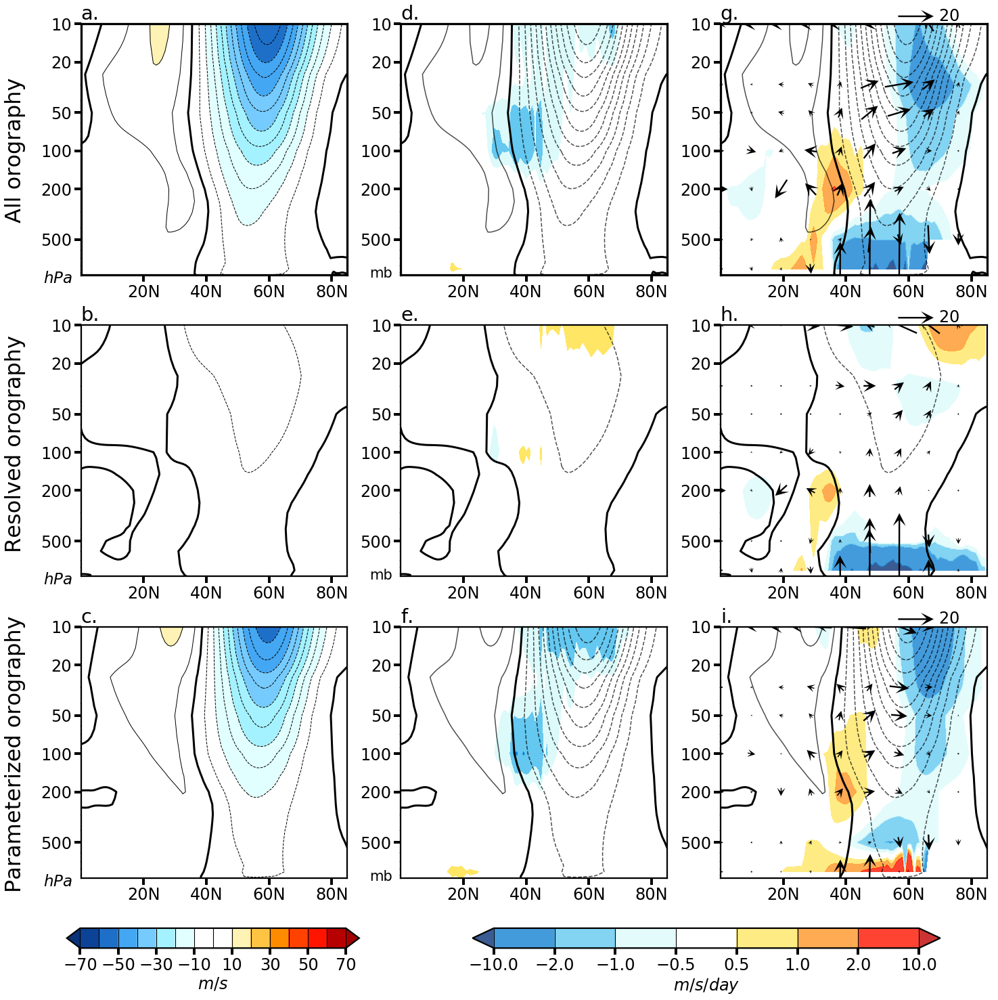

In [48]:
# Figure A3 - EP flux forcing and gravity wave forcing - resolved and unresolved orography
reds =   np.array([10, 20, 100, 220,255,255,255,255,192],np.float)
greens = np.array([50, 130,200,250,255,230,150, 20, 0],np.float)
blues =  np.array([120,210,240,250,255,100,40,  0,  0],np.float)

reds = reds/255
blues = blues/255
greens = greens/255

ncolors = len(reds)

colors = [[reds[0],greens[0],blues[0]]]
for i in range(1,ncolors):
    colors.append([reds[i],greens[i],blues[i]])

filename = 'JASMay2021AppendixdeltaUresparNMrough.eps'

CTL = 'WACCM6_CTL'
FLAT = 'WACCM6_Flat'
RH = 'WACCM6_FlatRough'

GWconst = 60*60*24
const=1.0

nrows = 3; ncols = 3; n=1
matplotlib.rcParams['figure.figsize']=(8*ncols,8 * nrows)
matplotlib.rcParams.update({'font.size':24})
plt.rcParams["axes.linewidth"]  = 3.25
plt.rcParams['xtick.major.width'] = 4
plt.rcParams['ytick.major.width'] = 4
plt.rcParams['xtick.major.size'] = 10
plt.rcParams['ytick.major.size'] = 10

#plotlabels = ['a.','c.','e.','b.','d.','f.']
plotlabels = ['a.','d.','g.','b.','e.','h.','c.','f.','i.']

seas='DJF'

# plot EP and U

cmax = 4.01
cmin = -4
cint = 1.0/3.0

startlat = 0
endlat = 85
startp = 850
endp = 2

Pt = 10
Ps = 950

fig, axes = plt.subplots(nrows=nrows, ncols=ncols)

levels = [850,500,200,100,50,30,10,5,2]
labels = ['All orography','Resolved orography','Parameterized orography']
ilabel=0

clev = 4
Ulevels = np.arange(-80,80.1,5)
Ulevels_col = np.arange(-70,70.1,10)

Flevels = [-10,-2,-1,-0.5,0.5,1,2,10]

seas = 'DJF'
    
for ictl,iexp in zip([CTL,CTL,RH],[FLAT,RH,FLAT]):

    EP_CTL = EPfluxes_daily[seas][ictl].sel(lat=slice(startlat,endlat)).sel(lev_int = slice(endp,startp)).sel(lev_int = levels)
    EP_NM = EPfluxes_daily[seas][iexp].sel(lat=slice(startlat,endlat)).sel(lev_int = slice(endp,startp)).sel(lev_int = levels)

    U_CTL = const * atmfields['p' + ictl][seas]['U'].mean(dim='time').mean(dim='lon')
    U_NM = const * atmfields['p' + iexp][seas]['U'].mean(dim='time').mean(dim='lon')

    GW_CTL = GWconst * atmfields['p' + ictl][seas]['UTGWORO'].mean(dim='time')
    GW_NM = GWconst * atmfields['p' + iexp][seas]['UTGWORO'].mean(dim='time')


    EPdiffs = EP_CTL - EP_NM
    Udiffs = U_CTL - U_NM
    GWdiffs = GW_CTL.mean(dim='lon') - GW_NM.mean(dim='lon')

    ax = plt.subplot(nrows,ncols,n); n+=1

    toplot = Udiffs
    
    Uim = ax.contourf(toplot.lat, toplot.lev_p,Udiffs.values,
        levels=Ulevels_col,cmap=cmap_wc,extend='both',linestyles='--',alpha=1.0)
    plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=Ulevels, 
                          colors='k',linewidths=[1.0])
    plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=[0], 
                          colors='k',linewidths=[3.0])

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    plt.ylabel('')
    plt.text(-12,1100,r'$hPa$',fontsize=23)    
    
    
    ax = plt.subplot(nrows,ncols,n); n+=1

    toplotM = GWconst * atmfields['p' + ictl][seas]['UTGWORO'].mean(dim='time')
    toplotNM = GWconst * atmfields['p' + iexp][seas]['UTGWORO'].mean(dim='time')

    toplot = toplotM-toplotNM
    
    im = ax.contourf(toplot.lat, toplot.lev_p,GWdiffs.values,
        levels=Flevels,colors = colors,extend='both',linestyles='--',alpha=1.0)

    cpU = plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=Ulevels, 
                          extend='both',colors='k',alpha=0.7)
    plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=[0], 
                          colors='k',linewidths=[3.0])

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    #plt.ylabel(labels[ilabel],fontsize=28); ilabel+=1  
    plt.ylabel('')
    plt.text(-10,1000,'mb',fontsize=21)

    ax = plt.subplot(nrows,ncols,n); n+=1
    im = plotEPU2(EPdiffs,
             'WACCM',True,'Fp','Fphi',colors,Flevels,Ps,Pt,'lev_int',
                  m=1,n=10,Udiffs = Udiffs,key=True)

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    plt.ylabel('')


    plt.rcParams["axes.linewidth"]  = 2.25


fig.subplots_adjust(bottom=0.15)
fig.subplots_adjust(hspace=0.2)
fig.subplots_adjust(wspace=0.2)

fig.text(0.06,0.82,labels[0],fontsize=32,rotation=90)
fig.text(0.06,0.6,labels[1],fontsize=32,rotation=90)
fig.text(0.06,0.36,labels[2],fontsize=32,rotation=90)
#fig.text(0.06,0.30,labels[3],fontsize=32,rotation=90)

cbar_ax = fig.add_axes([0.113, 0.09, 0.25, 0.017])
cbar_ax.tick_params(labelsize=24) 
cb = plt.colorbar(Uim,cax=cbar_ax,orientation='horizontal',drawedges=True,ticks=[-70,-50,-30,-10,10,30,50,70])
cb.set_label(label = r'$m/s$')

cbar_ax = fig.add_axes([0.46, 0.09, 0.4, 0.017])
cbar_ax.tick_params(labelsize=24) 
cb = plt.colorbar(im,cax=cbar_ax,orientation='horizontal',drawedges=True)
cb.set_label(label = r'$m/s/day$')

plt.savefig('/home/disk/eos4/rachel/Projects/StationaryWaves/FiguresJAS/' + filename, dpi=None, facecolor='w', 
        edgecolor='w',
        orientation='portrait')

plt.show()

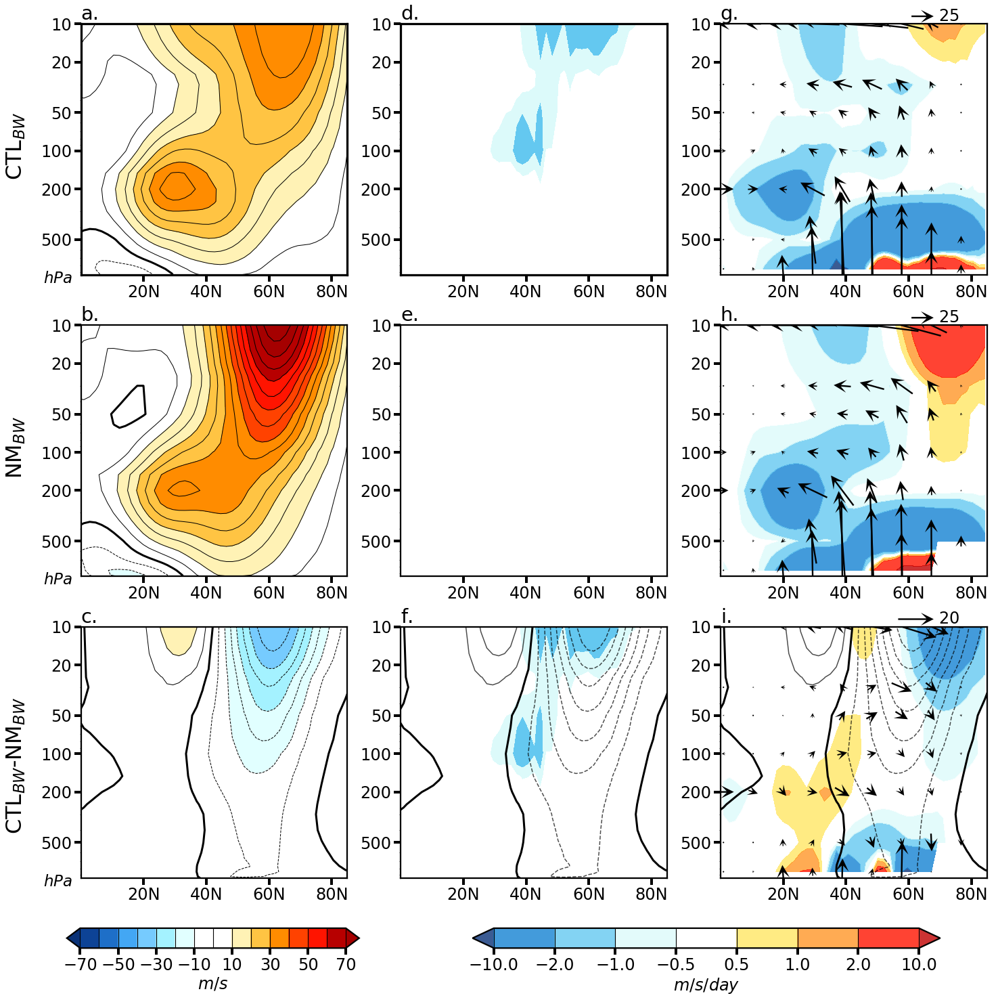

In [57]:
# Appendix figure Backwards: EP flux forcing and gravity wave forcing - CTL, NM, CTL-NM
filename = 'JASMay2021deltaUCTLNMBWs.eps'

CTL = 'WACCM6_BW_CTL'
FLAT = 'WACCM6_BW_Flat'

Utitles = {}
Utitles['WACCM6_CTL'] = 'CTL_BW'
Utitles['WACCM6_Flat'] = 'NM_BW'

GWconst = -1.0 * 60*60*24
const=-1.0

nrows = 3; ncols = 3; n=1
matplotlib.rcParams['figure.figsize']=(8*ncols,8 * nrows)
matplotlib.rcParams.update({'font.size':24})
plt.rcParams["axes.linewidth"]  = 3.25
plt.rcParams['xtick.major.width'] = 4
plt.rcParams['ytick.major.width'] = 4
plt.rcParams['xtick.major.size'] = 10
plt.rcParams['ytick.major.size'] = 10

#plotlabels = ['a.','c.','e.','b.','d.','f.']
plotlabels = ['a.','d.','g.','b.','e.','h.','c.','f.','i.']

seas='DJF'

# plot EP and U

cmax = 4.01
cmin = -4
cint = 1.0/3.0

startlat = 0
endlat = 85
startp = 850
endp = 2

Pt = 10
Ps = 950

fig, axes = plt.subplots(nrows=nrows, ncols=ncols)

levels = [850,500,200,100,50,30,10,5,2]
labels = ['CTL$_{BW}$','NM$_{BW}$','CTL$_{BW}$-NM$_{BW}$']
ilabel=0

clev = 4
Ulevels = np.arange(-80,80.1,5)
Ulevels_col = np.arange(-70,70.1,10)

Flevels = [-10,-2,-1,-0.5,0.5,1,2,10]

seas = 'DJF'

for iexp in [CTL, FLAT]:

    EP_CTL = EPfluxes_daily[seas][iexp].sel(lat=slice(startlat,endlat)).sel(lev_int = slice(endp,startp)).sel(lev_int = levels)

    U_CTL = const * atmfields['p' + iexp][seas]['U'].mean(dim='time').mean(dim='lon')

    GW_CTL = GWconst * atmfields['p' + iexp][seas]['UTGWORO'].mean(dim='time').mean(dim='lon')

    ax = plt.subplot(nrows,ncols,n); n+=1

    toplot = U_CTL
    
    plt.contour(U_CTL['lat'], U_CTL['lev_p'], U_CTL.values, levels=Ulevels, 
                          colors='k',linewidths=[1.0])
    plt.contour(U_CTL['lat'], U_CTL['lev_p'], U_CTL.values, levels=[0], 
                          colors='k',linewidths=[3.0])
    Uim = ax.contourf(toplot.lat,toplot.lev_p,toplot.values,
        levels=Ulevels_col,cmap=cmap_wc,extend='both',linestyles='--',alpha=1.0)

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    plt.ylabel('')
    #plt.ylabel(labels[ilabel],fontsize=28); ilabel+=1    
    #plt.text(-10,1000,'mb',fontsize=21)
    plt.text(-12,1100,r'$hPa$',fontsize=23)    

    ax = plt.subplot(nrows,ncols,n); n+=1

    toplot = GW_CTL
    
    im = ax.contourf(toplot.lat, toplot.lev_p,toplot.values,
        levels=Flevels,colors=colors,extend='both',linestyles='--',alpha=1.0)

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    plt.ylabel('')

    plt.rcParams["axes.linewidth"]  = 2.25
    
    
    ax = plt.subplot(nrows,ncols,n); n+=1
    imEP = plotEPU2(EP_CTL,
             'WACCM',False,'Fp','Fphi',colors,Flevels,Ps,Pt,'lev_int',
                  m=1,n=5,Udiffs = U_CTL,key=True,plotU=False)

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    plt.ylabel('')
    
for ictl,iexp in zip([CTL],[FLAT]):

    EP_CTL = EPfluxes_daily[seas][ictl].sel(lat=slice(startlat,endlat)).sel(lev_int = slice(endp,startp)).sel(lev_int = levels)
    EP_NM = EPfluxes_daily[seas][iexp].sel(lat=slice(startlat,endlat)).sel(lev_int = slice(endp,startp)).sel(lev_int = levels)

    U_CTL = const * atmfields['p' + ictl][seas]['U'].mean(dim='time').mean(dim='lon')
    U_NM = const * atmfields['p' + iexp][seas]['U'].mean(dim='time').mean(dim='lon')

    GW_CTL = GWconst * atmfields['p' + ictl][seas]['UTGWORO'].mean(dim='time')
    GW_NM = GWconst * atmfields['p' + iexp][seas]['UTGWORO'].mean(dim='time')


    EPdiffs = EP_CTL - EP_NM
    Udiffs = U_CTL - U_NM
    GWdiffs = GW_CTL.mean(dim='lon') - GW_NM.mean(dim='lon')

    ax = plt.subplot(nrows,ncols,n); n+=1

    toplot = Udiffs
    
    Uim = ax.contourf(toplot.lat, toplot.lev_p,Udiffs.values,
        levels=Ulevels_col,cmap=cmap_wc,extend='both',linestyles='--',alpha=1.0)
    plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=Ulevels, 
                          colors='k',linewidths=[1.0])
    plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=[0], 
                          colors='k',linewidths=[3.0])

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    plt.ylabel('')
    plt.text(-12,1100,r'$hPa$',fontsize=23)    
    
    
    ax = plt.subplot(nrows,ncols,n); n+=1

    toplotM = GWconst * atmfields['p' + ictl][seas]['UTGWORO'].mean(dim='time')
    toplotNM = GWconst * atmfields['p' + iexp][seas]['UTGWORO'].mean(dim='time')

    toplot = toplotM-toplotNM
    
    im = ax.contourf(toplot.lat, toplot.lev_p,GWdiffs.values,
        levels=Flevels,colors = colors,extend='both',linestyles='--',alpha=1.0)

    cpU = plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=Ulevels, 
                          extend='both',colors='k',alpha=0.7)
    plt.contour(Udiffs['lat'], Udiffs['lev_p'], Udiffs.values, levels=[0], 
                          colors='k',linewidths=[3.0])

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    #plt.ylabel(labels[ilabel],fontsize=28); ilabel+=1  
    plt.ylabel('')
    #plt.text(-10,1000,'mb',fontsize=21)

    ax = plt.subplot(nrows,ncols,n); n+=1
    im = plotEPU2(EPdiffs,
             'WACCM',True,'Fp','Fphi',colors,Flevels,Ps,Pt,'lev_int',
                  m=1,n=5,Udiffs = Udiffs,key=True)

    setaxes_latN(plotlabels[n-2],'',Ps,Pt,fontsize = 20)
    plt.xlim(startlat,endlat)
    plt.ylabel('')


    plt.rcParams["axes.linewidth"]  = 2.25


fig.subplots_adjust(bottom=0.15)
fig.subplots_adjust(hspace=0.2)
fig.subplots_adjust(wspace=0.2)

fig.text(0.06,0.79,labels[0],fontsize=32,rotation=90)
fig.text(0.06,0.53,labels[1],fontsize=32,rotation=90)
fig.text(0.06,0.29,labels[2],fontsize=32,rotation=90)
#fig.text(0.06,0.30,labels[3],fontsize=32,rotation=90)

cbar_ax = fig.add_axes([0.113, 0.09, 0.25, 0.017])
cbar_ax.tick_params(labelsize=24) 
cb = plt.colorbar(Uim,cax=cbar_ax,orientation='horizontal',drawedges=True,ticks=[-70,-50,-30,-10,10,30,50,70])
cb.set_label(label = r'$m/s$')

cbar_ax = fig.add_axes([0.46, 0.09, 0.4, 0.017])
cbar_ax.tick_params(labelsize=24) 
cb = plt.colorbar(im,cax=cbar_ax,orientation='horizontal',drawedges=True)
cb.set_label(label = r'$m/s/day$')

plt.savefig('/home/disk/eos4/rachel/Projects/StationaryWaves/FiguresJAS/' + filename, dpi=None, facecolor='w', 
        edgecolor='w',
        orientation='portrait')

plt.show()

/home/disk/eos4/rachel/anaconda2/lib/python2.7/site-packages/matplotlib/contour.py:1230: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


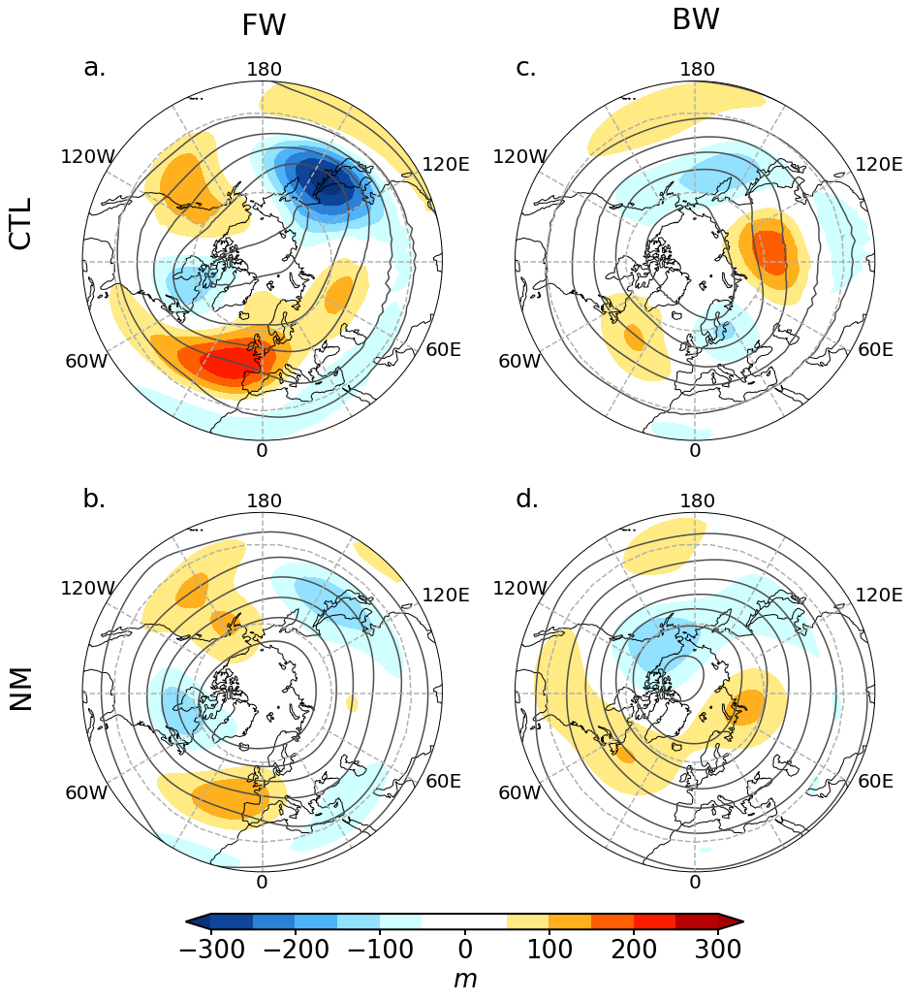

In [58]:
#Z300 and WACCM PD, and BW, CTL, and CTL-NM 
filename = 'JASMay2021Appendix2degZmapsPDBW.eps'

CTL = {}
EXP = {}

CTL['PD'] = 'WACCM6_2deg_CTL'
EXP['PD'] = 'WACCM6_2deg_Flat'

CTL['BW'] = 'WACCM6_BW_CTL'
EXP['BW'] = 'WACCM6_BW_Flat'


nrows=2
ncols = 2
matplotlib.rcParams['figure.figsize']=(8*ncols,7.5*nrows)
matplotlib.rcParams.update({'font.size':20})
plt.rcParams["axes.linewidth"]  = 2
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2
plt.rcParams['xtick.major.size'] = 6
plt.rcParams['ytick.major.size'] = 6

from cartopy.util import add_cyclic_point

seas='DJF'
var='Z3'

n=1

fig, axes = plt.subplots(nrows=nrows, ncols=2)
fig.subplots_adjust(wspace=0.1)
fig.subplots_adjust(hspace=0.2)


alpha=1.0 # doesn't work in eps?? make black contours less dark
ccolor = [(0.3,0.3,0.3)]

vmin0 = 990; vmax0=1035
vmin = -100; vmax = 100
cmap='bwr'
nlevels0 = 16
nlevels = 16
cenlon = 0
const = 0.01
ERAIconst = 1.0/9.81
#plotCTL(seas,var,vmin=vmin0,vmax=vmax0)

font0 = FontProperties()
font0.set_weight('bold')
n=1
o=3

labeln = 0
labels = ['a.','b.','c.','d.','e.','f.','g.','h.','i.','j.','k.','l.']

n=1
plev=300

levels1 = np.arange(-14000,14001,250)
levels2 = np.arange(-300,301,50)


for exp in ['PD','BW']:
    toplotM = atmfields['p' + CTL[exp]]['DJF']['Z3'].sel(lev_p=plev).mean(dim='time')
    toplotNM = atmfields['p' + EXP[exp]]['DJF']['Z3'].sel(lev_p=plev).mean(dim='time')
    

    ax = set_NPstereo(ncols,nrows,n); n+=1

    toplot = toplotM
    name = 'CTL'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')

    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    # bold zero contour
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
            levels=[0],colors=ccolor,extend='both',linewidths=2,alpha=alpha)  

    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both',alpha=1.0)

    plt.title(labels[labeln],loc='left',fontsize=27); labeln +=1

    ax = set_NPstereo(ncols,nrows,o); o+=1

    toplot = toplotNM
    name = 'NM'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')

    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    # bold zero contour
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
            levels=[0],colors=ccolor,extend='both',linewidths=2,alpha=alpha)  

    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both',alpha=1.0)

    plt.title(labels[labeln],loc='left',fontsize=27); labeln +=1

plt.subplots_adjust(wspace=0.0)

fig.text(0.3,0.925,'FW',rotation=0,fontsize=30)
#fig.text(0.5,0.93,'FW',rotation=0,fontsize=30)
fig.text(0.685,0.93,'BW',rotation=0,fontsize=30)

fig.text(0.09,0.75,'CTL',fontsize=30,rotation=90)
fig.text(0.09,0.305,'NM',fontsize=30,rotation=90)

if plev == 300:
    ticks = [-300,-200,-100,0,100,200,300]
elif plev == 850:
    ticks = [-150,-100,-50,0,50,100,150]
elif plev == 1000:
    ticks = [-150,-100,-50,0,50,100,150]        
cbar_ax = fig.add_axes([0.25, 0.07, 0.5, 0.015])
cbar_ax.tick_params(labelsize=26) 
cb = fig.colorbar(im,cax=cbar_ax,orientation='horizontal',ticks=ticks)
cb.set_label(label = r'$m$',fontsize=26)
#fig.text(vbar+0.09,0.95,r'$' + str(plev) + '$ $mb$',rotation=0,fontsize=34)

#fig.subplots_adjust(bottom=0.2)

plt.savefig('/home/disk/eos4/rachel/Projects/StationaryWaves/FiguresJAS/' + filename, dpi=None, facecolor='w', 
        edgecolor='w',
        orientation='portrait')

plt.show()

### Additional analysis

In [100]:
## Calculate mountain torque - following Wahr and Oort, 2nd order finite differences
s2d = 60*60*24
a = 6.371E6

TM2 = {}
PHIS={}

for exp in ['WACCM6_CTL','WACCM6_Flat','WACCM6_MSmooth','WACCM6_2deg_CTL']:   
    lons = atmfields[exp]['DJF'].lon
    nlons = len(lons)
    TM2[exp] = {}
    for seas in ['ANN','DJF','JJA']:
        PHIS[exp] = atmfields[exp][seas].PHIS.mean(dim='time')/9.81 # convert to m
        PS = atmfields[exp][seas].PS.mean(dim='time') # in Pa
        sumPsdH = np.zeros([len(PS.lat)],np.float)
        for ilon in np.arange(1,nlons-1):
            fdiff = 0.5 * (PHIS[exp].isel(lon=ilon+1) - PHIS[exp].isel(lon=ilon-1))
            sumPsdH += PS.isel(lon=ilon) * fdiff

        # End cases
        sumPsdH += PS.isel(lon=0) * 0.5 * (PHIS[exp].isel(lon=1) - PHIS[exp].isel(lon=nlons-1))
        sumPsdH += PS.isel(lon=nlons-1) * 0.5 * (PHIS[exp].isel(lon=0) - PHIS[exp].isel(lon=nlons-2))

        TM2[exp][seas]= -1.0 * a*a * (np.pi / 180) * np.cos(np.deg2rad(atmfields[exp][seas].lat)) * sumPsdH


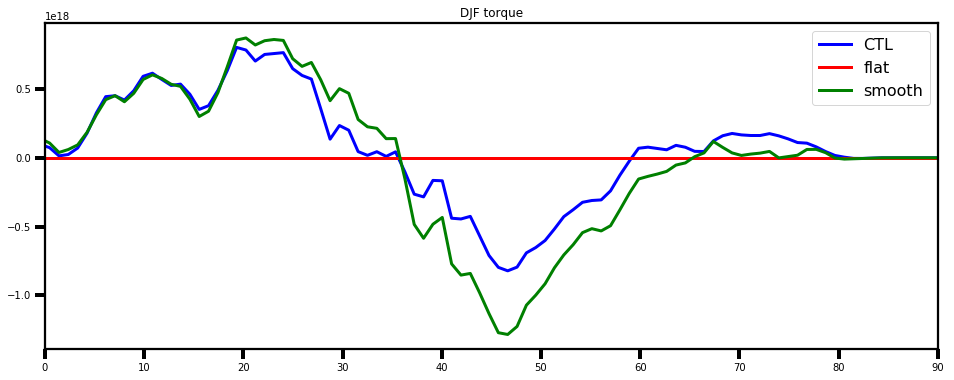

In [101]:
# Plot torques in different experiments
matplotlib.rcParams['figure.figsize']=(16,6)
# plot torque, in 
exp='WACCM6_CTL'
plt.plot(PHIS[exp].lat,TM2[exp]['DJF'],color='b',label='CTL',linewidth=3)
exp='WACCM6_Flat'
plt.plot(PHIS[exp].lat,TM2[exp]['DJF'],color='r',label='flat',linewidth=3)
exp='WACCM6_MSmooth'
plt.plot(PHIS[exp].lat,TM2[exp]['DJF'],color='g',label='smooth',linewidth=3)
plt.legend(fontsize=16)
plt.xlim(0,90)
plt.title('DJF torque')
plt.show()

In [103]:
# take mean from 40-60N in torque/degree latitude
lat1=40
lat2=60
for exp in ['WACCM6_CTL','WACCM6_2deg_CTL']:
    print(exp)
    total_tau2 = TM2[exp]['DJF'].sel(lat=slice(lat1,lat2)).mean(dim='lat').values
    print('DJF ' + exp + ' tau ' + str(lat1) + '-' + str(lat2) + 'N, 2nd order: ' + '{:04.2f}'.format(total_tau2/1E18) + ' Hadleys per degree latitude')

    # convert to m/s/day
    col_mass = 5162 # approximately half the mass of the atmospheric column, below 500mb
    # calculate mass of atmosphere
    circum = 2.0 * np.pi * a * np.cos(np.deg2rad(0.5*(lat1+lat2)))
    width = 110000 # one degree of latitude as calculated in per degree latitude

    F2 = total_tau2/a
    acc2 = F2/(col_mass * circum * width)
    acc2 = acc2 *s2d
         
    print('DJF ' + exp + ' ' + str(lat1) + '-' + str(lat2) + 'N 2nd order acceleration:' + '{:04.2f}'.format(acc2) + ' m/s/day')
    
 

WACCM6_CTL
DJF WACCM6_CTL tau 40-60N, 2nd order: -0.44 Hadleys per degree latitude
DJF WACCM6_CTL 40-60N 2nd order acceleration:-0.41 m/s/day
WACCM6_2deg_CTL
DJF WACCM6_2deg_CTL tau 40-60N, 2nd order: -0.33 Hadleys per degree latitude
DJF WACCM6_2deg_CTL 40-60N 2nd order acceleration:-0.30 m/s/day


In [144]:
# Calculate HFfields
HFfields = {}

for seas in ['DJF','ANN']:
    HFfields[seas] = {}

    startyr = 2
    nyears = 20
    for exp,name in ([('WACCM6_CTL','WACCMSC6_f09_fSST_2000_CTL'),
                 ('WACCM6_Flat','WACCMSC6_f09_fSST_2000_Flat'),
                 ('WACCM6_MSmooth','WACCMSC6_f09_fSST_2000_MSmooth'),
                 ('WACCM4_BWs_ZMSOM_Flat','WACCMSC_BWs_fixedZMSOMSSTs_Flat'),
                 ('WACCM4_ZMSOM_CTL','WACCMSC_ZMSOMSSTs_CTL'),
                 ('WACCM4_ZMSOM_Flat','WACCMSC_fixedZMSOMSSTs_Flat'),
                 ('WACCM4_CTL','WACCMSC_obsSSTs_CTL'),
                 ('WACCM4_Flat','WACCMSC_obsSSTs_Flat'),
                 ('WACCM6_2deg_CTL','WACCMSC6_f19_fSST_2000_CTL'),
                 ('WACCM6_2deg_Flat','WACCMSC6_f19_fSST_2000_Flat'),
                 ('WACCM6_BW_CTL','WACCMSC6_f19_fSST_2000_BW_CTL'),
                 ('WACCM6_BW_Flat','WACCMSC6_f19_fSST_2000_BW_Flat')]):

        Dir = '/home/disk/eos4/rachel/CESM_outfiles/StationaryWaves/' + name + '/atm/hist/'
        camversion = 'cam'

        HFfields[seas][exp] = HFreadfiles(Dir, seas + str(startyr) + '_' + str(nyears) + '_mean_' + name + '.' + camversion + '.h0.nc')


    startyr = 2
    nyears = 30

    for exp,name in ([('WACCM4_BWs_ZMSOM_CTL','WACCMSC_BKWDS_topo_ZMSOMSSTs')]):

        Dir = '/home/disk/eos4/rachel/CESM_outfiles/StationaryWaves/' + name + '/atm/hist/'
        camversion = 'cam'

        HFfields[seas][exp] = HFreadfiles(Dir, seas + str(startyr) + '_' + str(nyears) + '_mean_' + name + '.' + camversion + '.h0.nc')


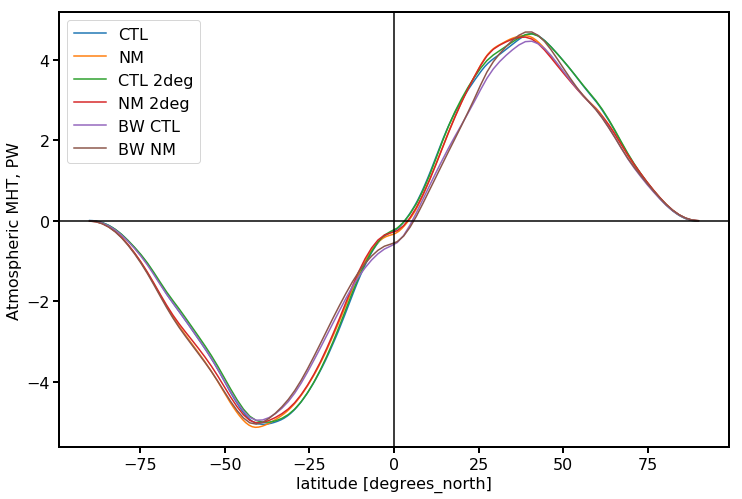

NH
WACCM6_CTL:4.65; diff: 0.00
WACCM6_Flat:4.61; diff: -0.05
WACCM6_2deg_CTL:4.65; diff: 0.00
WACCM6_2deg_Flat:4.57; diff: -0.08
WACCM6_BW_CTL:4.47; diff: -0.18
WACCM6_BW_Flat:4.70; diff: 0.05


SH
WACCM6_CTL:-5.06; diff: 0.00
WACCM6_Flat:-5.14; diff: -0.08
WACCM6_2deg_CTL:-5.01; diff: 0.05
WACCM6_2deg_Flat:-5.02; diff: 0.03
WACCM6_BW_CTL:-4.96; diff: 0.10
WACCM6_BW_Flat:-5.06; diff: 0.00


In [148]:
# Compare all WACCM6 runs FW CTL, FW NM, BW CTL, BW NM 
matplotlib.rcParams['figure.figsize']=(12,8)
matplotlib.rcParams.update({'font.size':16})

seas = 'ANN'
HFfields[seas]['WACCM6_CTL'].HT_atm.mean(dim='time').mean(dim='lon').plot(label='CTL')
HFfields[seas]['WACCM6_Flat'].HT_atm.mean(dim='time').mean(dim='lon').plot(label='NM')

HFfields[seas]['WACCM6_2deg_CTL'].HT_atm.mean(dim='time').mean(dim='lon').plot(label='CTL 2deg')
HFfields[seas]['WACCM6_2deg_Flat'].HT_atm.mean(dim='time').mean(dim='lon').plot(label='NM 2deg')
HFfields[seas]['WACCM6_BW_CTL'].HT_atm.mean(dim='time').mean(dim='lon').plot(label='BW CTL')
HFfields[seas]['WACCM6_BW_Flat'].HT_atm.mean(dim='time').mean(dim='lon').plot(label='BW NM')

plt.legend(loc='best')
plt.axhline(color='k')
plt.axvline(color='k')
plt.ylabel('Atmospheric MHT, PW')
plt.show()

# print maximum values

print('NH')
maxvalues = {}
for exp in ['WACCM6_CTL', 'WACCM6_Flat','WACCM6_2deg_CTL','WACCM6_2deg_Flat',
            'WACCM6_BW_CTL','WACCM6_BW_Flat']:
    
    # find maximum
    temp = HFfields[seas][exp].HT_atm.mean(dim='time').mean(dim='lon').sel(lat=slice(0,90))
    maxvalue = np.amax(temp)
    
    maxvalues[exp] = maxvalue.values
    
for exp in ['WACCM6_CTL', 'WACCM6_Flat','WACCM6_2deg_CTL','WACCM6_2deg_Flat',
            'WACCM6_BW_CTL','WACCM6_BW_Flat']:
    print(exp + ':' + '{:4.2f}'.format(maxvalues[exp]) + '; diff: ' + 
          '{:4.2f}'.format(maxvalues[exp] - maxvalues['WACCM6_CTL']))

print('\n')
print('SH')

maxvalues = {}
for exp in ['WACCM6_CTL', 'WACCM6_Flat','WACCM6_2deg_CTL','WACCM6_2deg_Flat',
            'WACCM6_BW_CTL','WACCM6_BW_Flat']:
    
    # find maximum
    temp = HFfields[seas][exp].HT_atm.mean(dim='time').mean(dim='lon').sel(lat=slice(-90,0))
    maxvalue = np.amin(temp)
    
    maxvalues[exp] = maxvalue.values
    
for exp in ['WACCM6_CTL', 'WACCM6_Flat','WACCM6_2deg_CTL','WACCM6_2deg_Flat',
            'WACCM6_BW_CTL','WACCM6_BW_Flat']:
    print(exp + ':' + '{:4.2f}'.format(maxvalues[exp]) + '; diff: ' + 
          '{:4.2f}'.format(maxvalues[exp] - maxvalues['WACCM6_CTL']))


In [135]:
# Calculate Heat transport fields on timeseries data to estimate standard error
HFtotal_ts = {}
HFatm_ts = {}

latent_heat = 2500000 #J/kg

for seas in ['ANN']:
    HFtotal_ts[seas] = {}
    HFatm_ts[seas] = {}

    startyr = 2
    nyears = 20
    for exp in ['WACCM6_CTL']:

        data = atmfields_ts_surf[exp][seas]
        
        SWsfc = - data.FSNS
        LWsfc = data.FLNS
        
        OLR = data.FLNT
        ASR = data.FSNT
        
        SHF = data.SHFLX
        LHF = latent_heat*data.QFLX
        
        SurfaceHeatFlux = LWsfc + SWsfc + SHF + LHF ## Ignoring snowflux!
        
        HFatm_ts[seas][exp] = CESMdiag_Rose.inferred_heat_transport2(ASR - OLR + SurfaceHeatFlux, None, None)


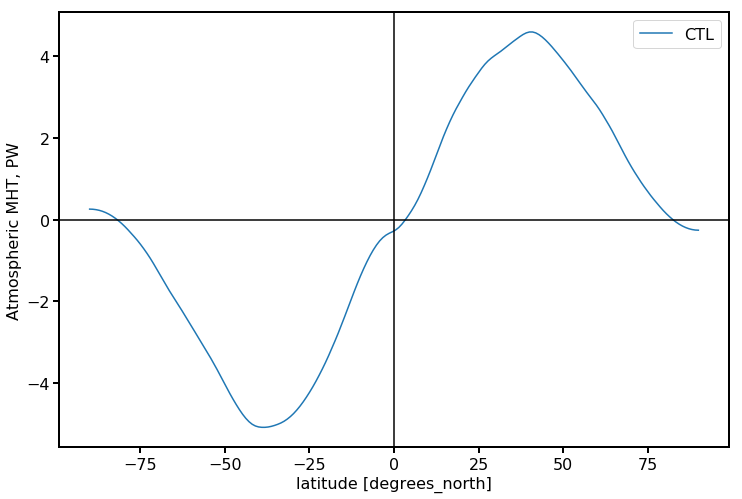

NH
WACCM6_CTL:4.60 +/- 0.01


SH
WACCM6_CTL:-5.09 +/- 0.02


In [146]:
# Plot data from timeseries and print standard error assuming independent years
# Don't have snowflux and so not quite balanced, so not using these calculations for the main results
matplotlib.rcParams['figure.figsize']=(12,8)
matplotlib.rcParams.update({'font.size':16})

seas = 'ANN'
HFatm_ts[seas]['WACCM6_CTL'].mean(dim='time').mean(dim='lon').plot(label='CTL')

plt.legend(loc='best')
plt.axhline(color='k')
plt.axvline(color='k')
plt.ylabel('Atmospheric MHT, PW')
plt.show()

# print maximum values

print('NH')
maxvalues = {}
maxvaluesstd = {}

for exp in ['WACCM6_CTL']:
    
    # find maximum
    temp = HFatm_ts[seas][exp].mean(dim='lon').sel(lat=slice(0,90))
    
    temp = temp.groupby('time.year').mean(dim='time')

    maxvalue = np.amax(temp,0)
    nyears = len(maxvalue)    
    maxvalues[exp] = maxvalue.mean(dim='year').values
    maxvaluesstd[exp] = maxvalue.std(dim='year').values/np.sqrt(nyears-1)
    
    print(exp + ':' + '{:4.2f}'.format(maxvalues[exp]) + ' +/- ' + '{:4.2f}'.format(maxvaluesstd[exp]))

print('\n')
print('SH')

maxvalues = {}
for exp in ['WACCM6_CTL']:
    
    # find maximum
    temp = HFatm_ts[seas][exp].mean(dim='lon').sel(lat=slice(-90,0))
    temp = temp.groupby('time.year').mean(dim='time')
    maxvalue = np.amin(temp,0)
    
    maxvalues[exp] = maxvalue.mean(dim='year').values
    maxvaluesstd[exp] = maxvalue.std(dim='year').values/np.sqrt(20)

    print(exp + ':' + '{:4.2f}'.format(maxvalues[exp]) + ' +/- ' + '{:4.2f}'.format(maxvaluesstd[exp]))


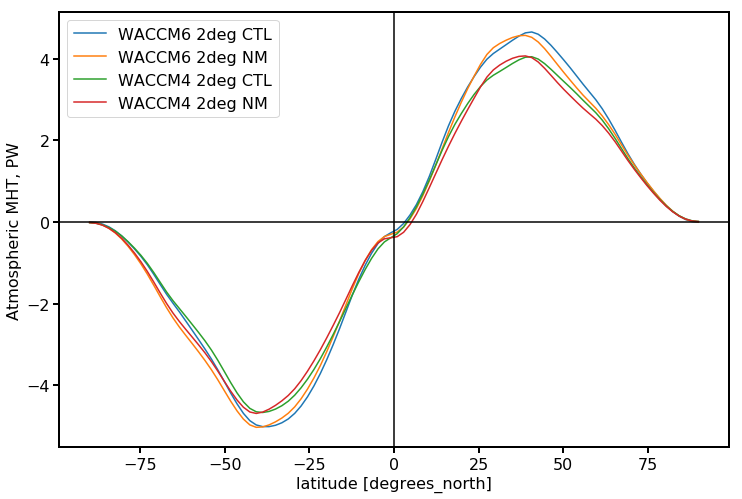

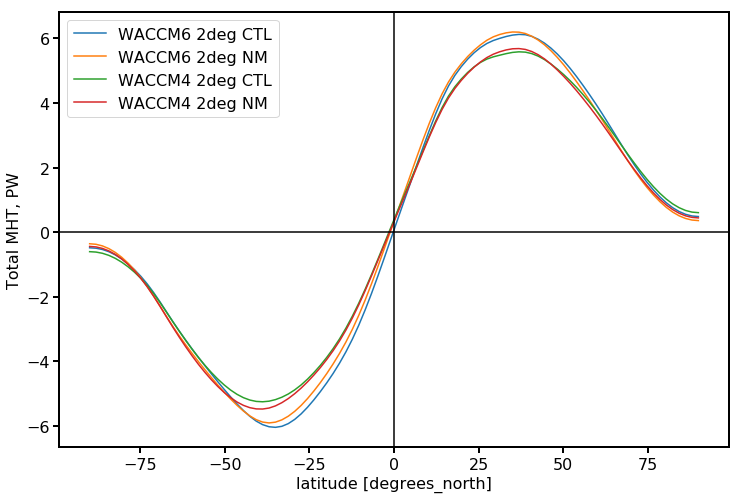

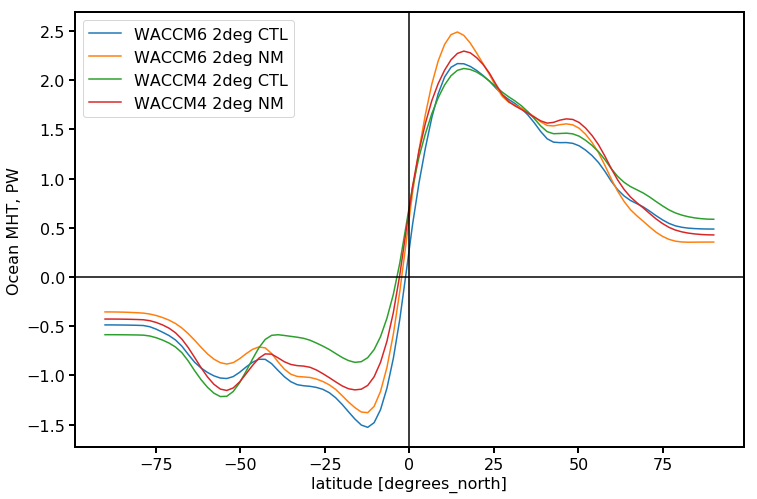

NH
WACCM6_2deg_CTL:4.65; diff: 0.00
WACCM4_CTL:4.05; diff: -0.61
WACCM6_2deg_Flat:4.57; diff: -0.08
WACCM4_Flat:4.07; diff: -0.59


SH
WACCM6_2deg_CTL:-5.01; diff: 0.00
WACCM4_CTL:-4.66; diff: 0.35
WACCM6_2deg_Flat:-5.02; diff: -0.02
WACCM4_Flat:-4.68; diff: 0.32


In [149]:
# Compare model versions
matplotlib.rcParams['figure.figsize']=(12,8)
matplotlib.rcParams.update({'font.size':16})

seas = 'ANN'
HFfields[seas]['WACCM6_2deg_CTL'].HT_atm.mean(dim='time').mean(dim='lon').plot(label='WACCM6 2deg CTL')
HFfields[seas]['WACCM6_2deg_Flat'].HT_atm.mean(dim='time').mean(dim='lon').plot(label='WACCM6 2deg NM')

HFfields[seas]['WACCM4_CTL'].HT_atm.mean(dim='time').mean(dim='lon').plot(label='WACCM4 2deg CTL')
HFfields[seas]['WACCM4_Flat'].HT_atm.mean(dim='time').mean(dim='lon').plot(label='WACCM4 2deg NM')

plt.legend(loc='best')
plt.axhline(color='k')
plt.axvline(color='k')
plt.ylabel('Atmospheric MHT, PW')
plt.show()

seas = 'ANN'
HFfields[seas]['WACCM6_2deg_CTL'].HT_total.mean(dim='time').mean(dim='lon').plot(label='WACCM6 2deg CTL')
HFfields[seas]['WACCM6_2deg_Flat'].HT_total.mean(dim='time').mean(dim='lon').plot(label='WACCM6 2deg NM')

HFfields[seas]['WACCM4_CTL'].HT_total.mean(dim='time').mean(dim='lon').plot(label='WACCM4 2deg CTL')
HFfields[seas]['WACCM4_Flat'].HT_total.mean(dim='time').mean(dim='lon').plot(label='WACCM4 2deg NM')

plt.legend(loc='best')
plt.axhline(color='k')
plt.axvline(color='k')
plt.ylabel('Total MHT, PW')
plt.show()


seas = 'ANN'
HFfields[seas]['WACCM6_2deg_CTL'].HT_ocean.mean(dim='time').mean(dim='lon').plot(label='WACCM6 2deg CTL')
HFfields[seas]['WACCM6_2deg_Flat'].HT_ocean.mean(dim='time').mean(dim='lon').plot(label='WACCM6 2deg NM')

HFfields[seas]['WACCM4_CTL'].HT_ocean.mean(dim='time').mean(dim='lon').plot(label='WACCM4 2deg CTL')
HFfields[seas]['WACCM4_Flat'].HT_ocean.mean(dim='time').mean(dim='lon').plot(label='WACCM4 2deg NM')

plt.legend(loc='best')
plt.axhline(color='k')
plt.axvline(color='k')
plt.ylabel('Ocean MHT, PW')
plt.show()


print('NH')
maxvalues = {}
for exp in ['WACCM6_2deg_CTL', 'WACCM4_CTL','WACCM6_2deg_Flat','WACCM4_Flat']:
    
    # find maximum
    temp = HFfields[seas][exp].HT_atm.mean(dim='time').mean(dim='lon').sel(lat=slice(0,90))
    maxvalue = np.amax(temp)
    
    maxvalues[exp] = maxvalue.values
    
for exp in ['WACCM6_2deg_CTL', 'WACCM4_CTL','WACCM6_2deg_Flat','WACCM4_Flat']:
    print(exp + ':' + '{:4.2f}'.format(maxvalues[exp]) + '; diff: ' + 
          '{:4.2f}'.format(maxvalues[exp] - maxvalues['WACCM6_2deg_CTL']))

print('\n')
print('SH')

maxvalues = {}
for exp in ['WACCM6_2deg_CTL', 'WACCM4_CTL','WACCM6_2deg_Flat','WACCM4_Flat']:
    
    # find maximum
    temp = HFfields[seas][exp].HT_atm.mean(dim='time').mean(dim='lon').sel(lat=slice(-90,0))
    maxvalue = np.amin(temp)
    
    maxvalues[exp] = maxvalue.values
    
for exp in ['WACCM6_2deg_CTL', 'WACCM4_CTL','WACCM6_2deg_Flat','WACCM4_Flat']:
    print(exp + ':' + '{:4.2f}'.format(maxvalues[exp]) + '; diff: ' + 
          '{:4.2f}'.format(maxvalues[exp] - maxvalues['WACCM6_2deg_CTL']))


In [146]:
## Significance testing for Stratospheric winds - calculate DJF mean stratospheric values - 60N
seas='DJF'
U_CTL_60 = const * daily_UV[seas][ictl]['U'].mean(dim='lon').sel(lat=60,method='nearest').sel(lev_p = 10)
U_NM_60 = const * daily_UV[seas][iexp]['U'].mean(dim='lon').sel(lat=60,method='nearest').sel(lev_p = 10)

nyears = len(U_CTL.time)/90

CTL_60_values = np.zeros([nyears-2])
NM_60_values = np.zeros([nyears-2])

# Sum over DJFs, starting with D in the first year (index 60 in time)
for iyear in np.arange(0,nyears-2):
    CTL_60_values[iyear] = U_CTL_60.isel(time=slice(iyear*90 + 60,(iyear*90)+60+90)).mean(dim='time')
    NM_60_values[iyear] = U_NM_60.isel(time=slice(iyear*90 + 60,(iyear*90)+60 + 90)).mean(dim='time')
 

In [147]:
## Significance testing for Stratospheric winds - calculate DJF mean stratospheric values - 50-80N

U_CTL_4090 = const * daily_UV[seas][ictl]['U'].mean(dim='lon').sel(lat=slice(50,80)).sel(lev_p = 10)
U_NM_4090 = const * daily_UV[seas][iexp]['U'].mean(dim='lon').sel(lat=slice(50,80)).sel(lev_p = 10)

# weighted sum over latitude
coslat = np.cos(np.deg2rad(U_CTL_4090.lat))

U_CTL_4090 = (U_CTL_4090 * coslat).sum(dim='lat')/coslat.sum(dim='lat')
U_NM_4090 = (U_NM_4090 * coslat).sum(dim='lat')/coslat.sum(dim='lat')
      
nyears = len(U_CTL_4090.time)/90

CTL_4090_values = np.zeros([nyears-2])
NM_4090_values = np.zeros([nyears-2])

for iyear in np.arange(0,nyears-2):
    CTL_4090_values[iyear] = U_CTL_4090.isel(time=slice(iyear*90 + 60,(iyear*90)+60+90)).mean(dim='time')
    NM_4090_values[iyear] = U_NM_4090.isel(time=slice(iyear*90 + 60,(iyear*90)+60+90)).mean(dim='time')
 

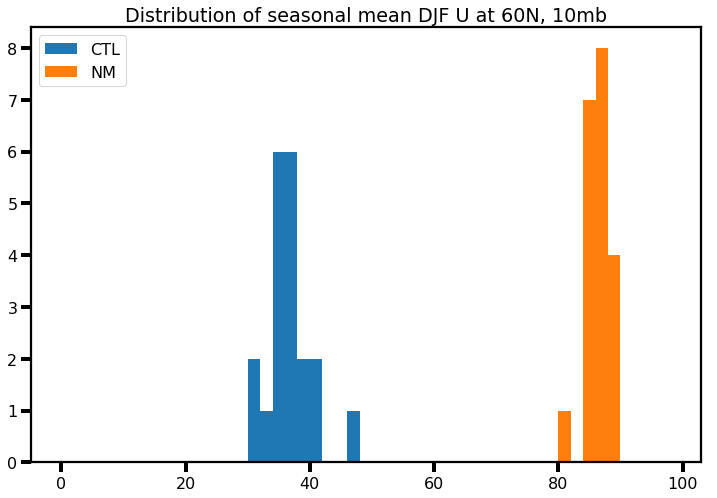

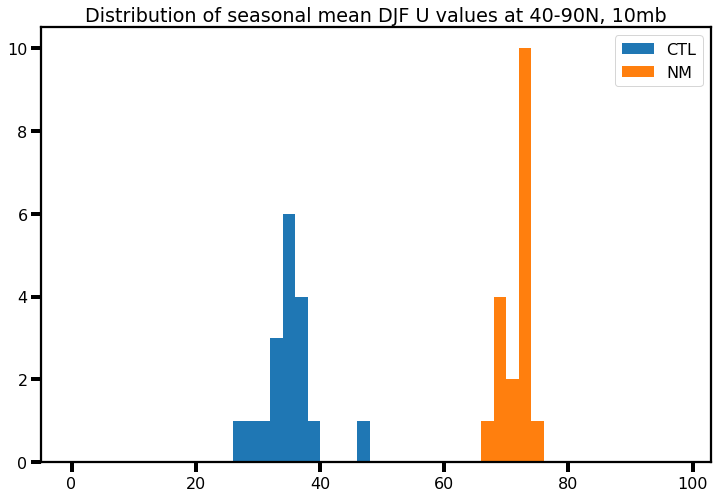

Ttest_indResult(statistic=-33.520394571566825, pvalue=5.252424882081259e-22)


In [148]:
# Create annual DJF means

bins = np.arange(0,100,2)
plt.hist(CTL_values, bins = bins,label = 'CTL')
plt.hist(NM_values, bins = bins,label = 'NM')
plt.title('Distribution of seasonal mean DJF U at 60N, 10mb')
plt.legend()
plt.show()


bins = np.arange(0,100,2)
plt.hist(CTL_4090_values, bins = bins,label = 'CTL')
plt.hist(NM_4090_values, bins = bins,label = 'NM')
plt.title('Distribution of seasonal mean DJF U values at 40-90N, 10mb')
plt.legend()
plt.show()

welchtest = scipy.stats.ttest_ind(CTL_4090_values, NM_4090_values, equal_var=False)
print(welchtest)

In [151]:
## Standard deviation for tropospheric and stratospheric winds

U_CTL = const * daily_UV[seas][ictl]['U'].mean(dim='lon')
U_NM = const * daily_UV[seas][iexp]['U'].mean(dim='lon')
    
nyears = len(U_CTL.time)/90
nlats = len(U_CTL.lat)
nlevs = len(U_CTL.lev_p)

CTL_values = np.zeros([nyears-2,nlevs,nlats])
NM_values = np.zeros([nyears-2,nlevs,nlats])

for iyear in np.arange(0,nyears-2):
    CTL_values[iyear] = U_CTL.isel(time=slice(iyear*90 + 60,(iyear*90)+60+90)).mean(dim='time')
    NM_values[iyear] = U_NM.isel(time=slice(iyear*90 + 60,(iyear*90)+60+90)).mean(dim='time')

    
CTL_SD = np.std(CTL_values,axis=0)
NM_SD = np.std(NM_values,axis=0)


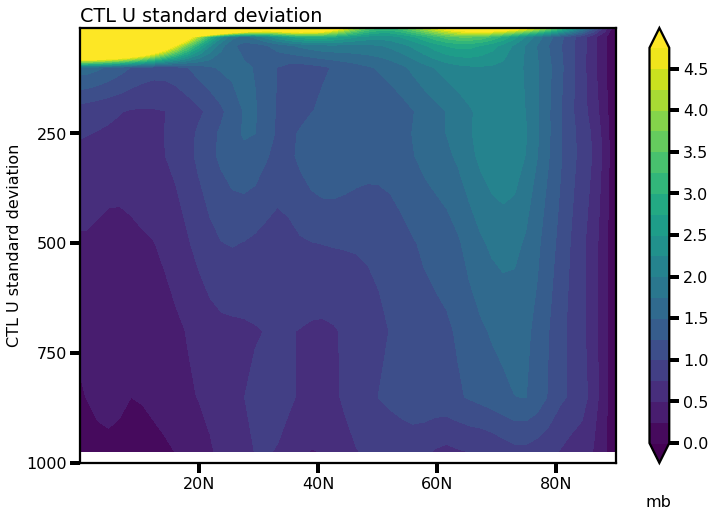

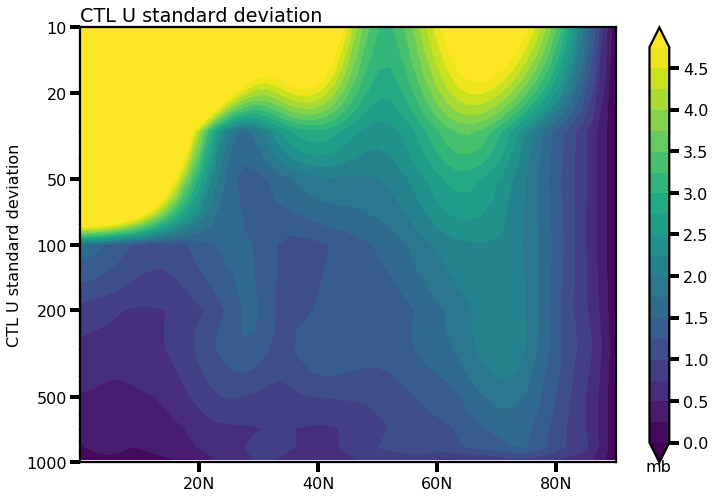

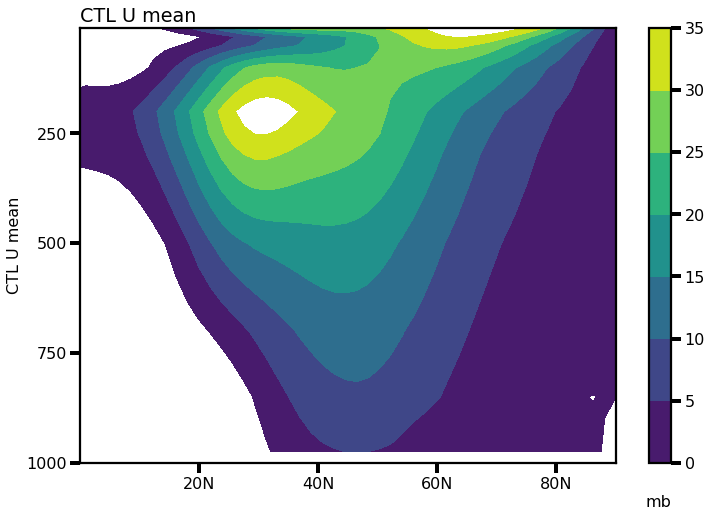

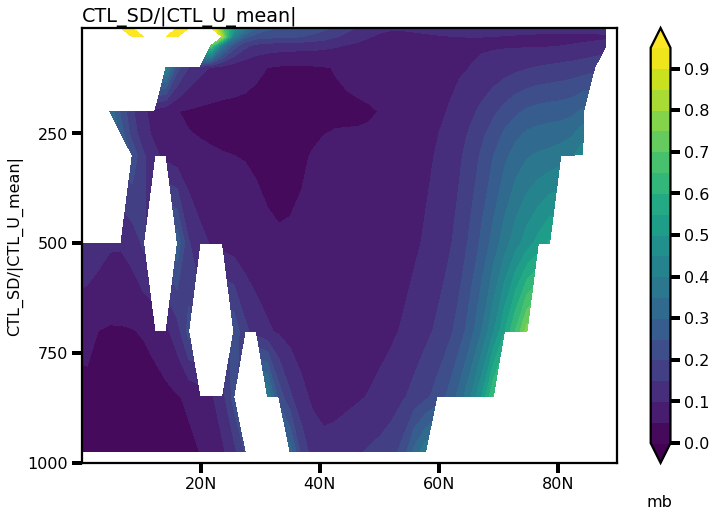

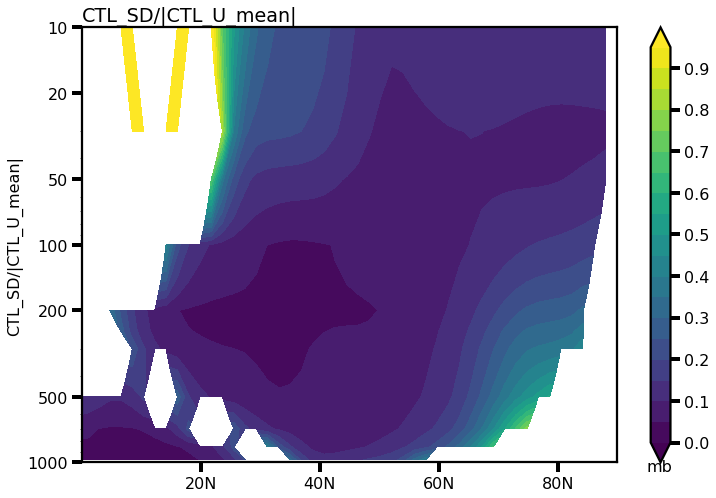

In [181]:
# Plot interannual standard deviation and standard deviation/mean
plt.contourf(U_CTL.lat,U_CTL.lev_p,CTL_SD,levels=np.arange(0,5,0.25),extend='both')
setaxes_latN('CTL U standard deviation','mb',ps=1000,pt=10,fontsize=16,log=False)
plt.colorbar()
plt.show()

plt.contourf(U_CTL.lat,U_CTL.lev_p,CTL_SD,levels=np.arange(0,5,0.25),extend='both')
setaxes_latN('CTL U standard deviation','mb',ps=1000,pt=10,fontsize=16,log=True)
plt.colorbar()
plt.show()

plt.contourf(U_CTL.lat,U_CTL.lev_p,U_CTL.mean(dim='time'),levels=np.arange(0,40,5))
setaxes_latN('CTL U mean','mb',ps=1000,pt=10,fontsize=16,log=False)
plt.colorbar()
plt.show()


toplot = CTL_SD/np.abs(U_CTL.mean(dim='time'))
mask = np.where(np.abs(U_CTL.mean(dim='time')) < 2,np.nan,1)

plt.contourf(U_CTL.lat,U_CTL.lev_p,mask*toplot,levels=np.arange(0,1.0,0.05),extend='both')
setaxes_latN('CTL_SD/|CTL_U_mean|','mb',ps=1000,pt=10,fontsize=16,log=False)
plt.colorbar()
plt.show()

plt.contourf(U_CTL.lat,U_CTL.lev_p,toplot*mask,levels=np.arange(0,1.0,0.05),extend='both')
setaxes_latN('CTL_SD/|CTL_U_mean|','mb',ps=1000,pt=10,fontsize=16,log=True)
plt.colorbar()
plt.show()

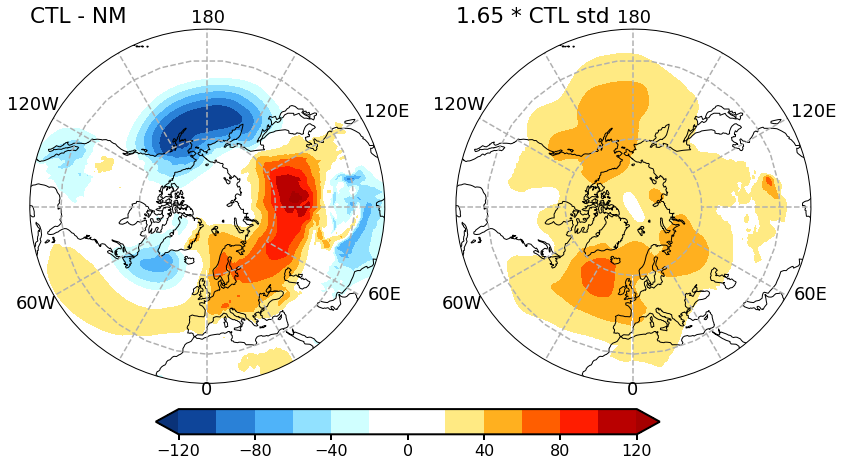

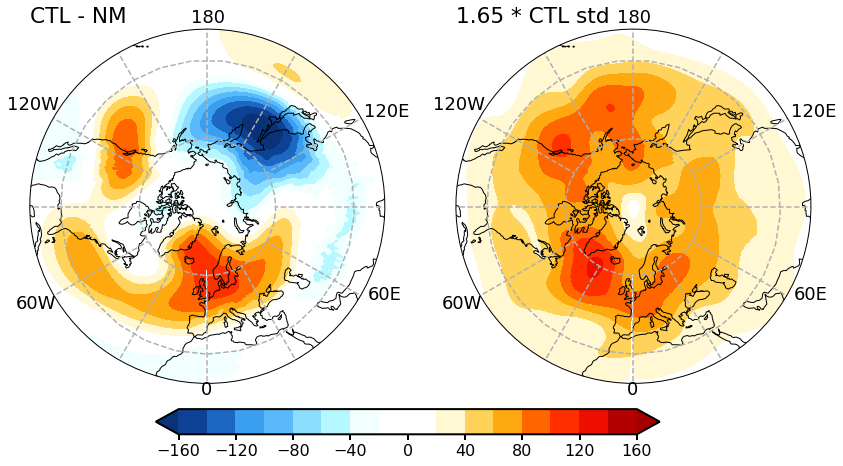

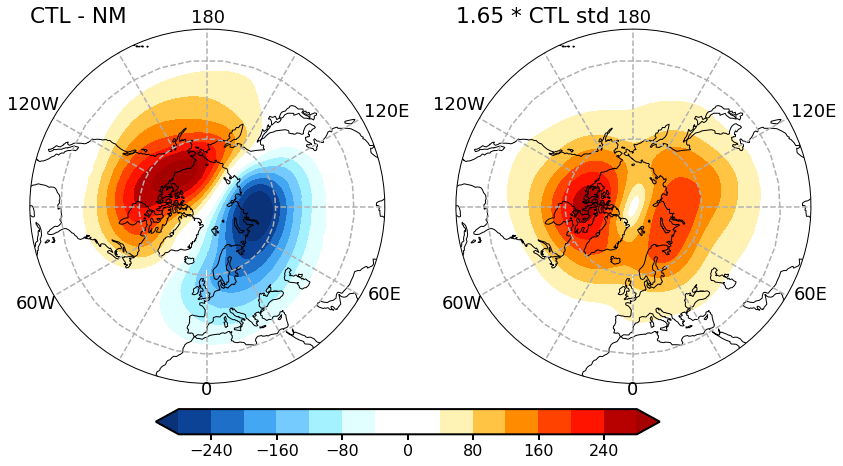

In [225]:
# Interannual Variability of stationary waves

CTL = 'WACCM6_CTL'
EXP = 'WACCM6_Flat'

for plev in [1000,300,30]:
    var_CTL = atmfields_ts[CTL]['DJF']['Z3'].sel(lev_p=plev)
    var_NM = atmfields_ts[EXP]['DJF']['Z3'].sel(lev_p=plev)

    nyears = len(var_CTL.time)/3
    nlats = len(var_CTL.lat)
    nlons = len(var_CTL.lon)

    CTL_Z300_values = np.zeros([nyears-2,nlats,nlons])
    NM_Z300_values = np.zeros([nyears-2,nlats,nlons])

    for iyear in np.arange(0,nyears-2):
        # Start with index 2 as the first Decemeber in the timeseries
        CTL_Z300_values[iyear,:,:] = var_CTL.isel(time=slice(iyear*3 + 2,(iyear*3)+2+3)).mean(dim='time')
        NM_Z300_values[iyear,:,:] = var_NM.isel(time=slice(iyear*3 + 2,(iyear*3)+2+3)).mean(dim='time')

    CTL_Z300_values = xr.DataArray(CTL_Z300_values,
                                  dims = ('time','lat','lon'),
                                  coords = {'time':np.arange(0,nyears-2),'lat':var_CTL.lat,'lon':var_CTL.lon})    
    NM_Z300_values = xr.DataArray(NM_Z300_values,
                                  dims = ('time','lat','lon'),
                                  coords = {'time':np.arange(0,nyears-2),'lat':var_CTL.lat,'lon':var_CTL.lon})    

    CTL_Z300_SD = CTL_Z300_values.std(dim='time')
    NM_Z300_SD = NM_Z300_values.std(dim='time')



    n=1
    nrows=1
    ncols = 2
    matplotlib.rcParams['figure.figsize']=(7*ncols,7*nrows)
    matplotlib.rcParams.update({'font.size':18})
    plt.rcParams["axes.linewidth"]  = 2
    plt.rcParams['xtick.major.width'] = 2
    plt.rcParams['ytick.major.width'] = 2
    plt.rcParams['xtick.major.size'] = 6
    plt.rcParams['ytick.major.size'] = 6

    if plev == 1000:
        levels2 = np.arange(-120,121,20)
    elif plev == 300:
        levels2 = np.arange(-160,161,20)
    elif plev == 30:
        levels2 = np.arange(-280,281,40)
    else:
        exit('unexpected level')

    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols)

    ax = set_NPstereo_small(ncols,nrows,n); n+=1

    toplot = CTL_Z300_values.mean(dim='time') - NM_Z300_values.mean(dim='time')

    toplot2 = toplot - toplot.mean(dim='lon')

    im = plt.contourf(var_CTL.lon, var_CTL.lat,toplot2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')

    plt.title('CTL - NM',loc='left'); labeln +=1


    ax = set_NPstereo_small(ncols,nrows,n); n+=1

    toplot = CTL_Z300_values - CTL_Z300_values.mean(dim='lon')

    toplot2 = toplot.std(dim='time') * 1.65

    im = plt.contourf(var_CTL.lon, var_CTL.lat,toplot2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')

    plt.title('1.65 * CTL std',loc='left'); labeln +=1

    cbar_ax = fig.add_axes([0.25, 0.05, 0.5, 0.05])
    cbar_ax.tick_params(labelsize=16) 
    cb = fig.colorbar(im,cax=cbar_ax,orientation='horizontal')
    plt.show()

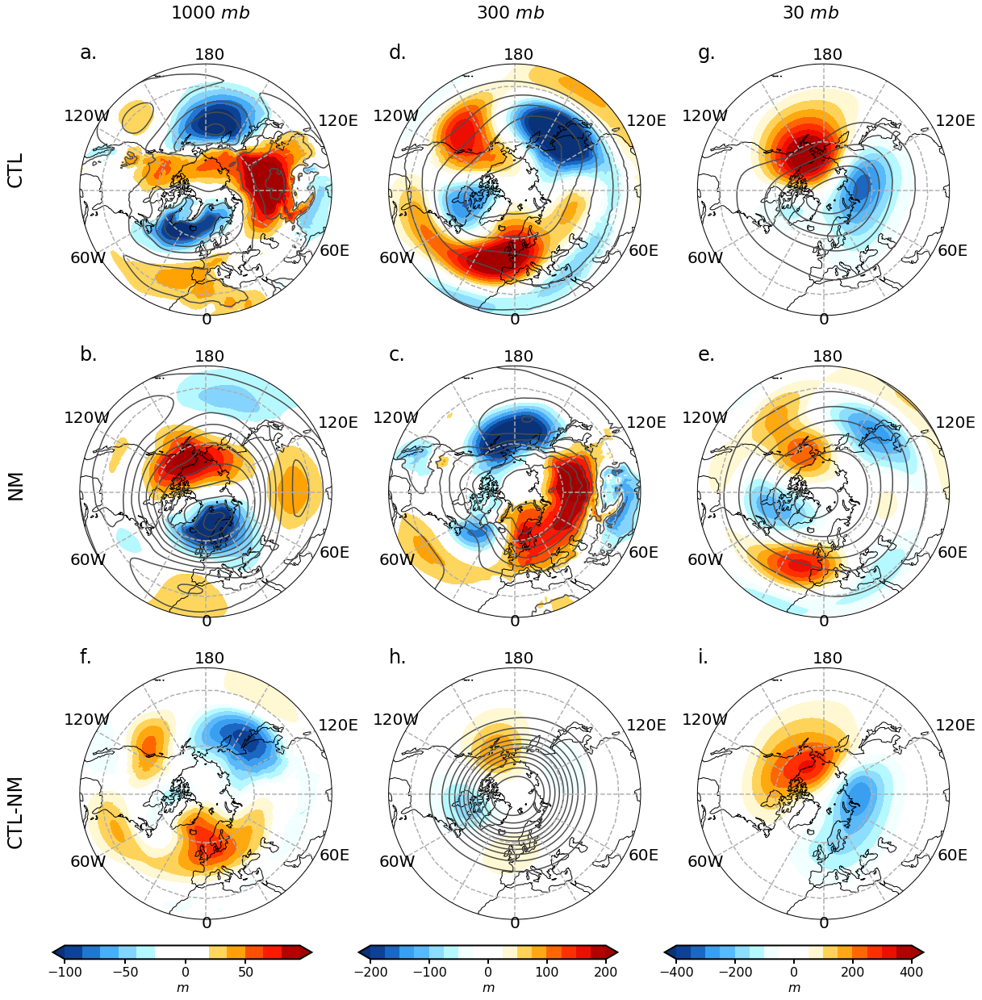

In [217]:
# Robustness to subsampling: years 1-10
#Z300 and Z1000 WACCM ERAI, CTL, and CTL-NM  - years 1-10
CTL = 'WACCM6_CTL'
EXP = 'WACCM6_Flat'

nrows=3
ncols = 3
matplotlib.rcParams['figure.figsize']=(6.75*ncols,6.5*nrows)
matplotlib.rcParams.update({'font.size':20})
plt.rcParams["axes.linewidth"]  = 2
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2
plt.rcParams['xtick.major.size'] = 6
plt.rcParams['ytick.major.size'] = 6

from cartopy.util import add_cyclic_point

seas='DJF'
var='Z3'

n=1

fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
fig.subplots_adjust(wspace=0.05)
fig.subplots_adjust(hspace=0.2)


alpha = 1.0 # doesn't seem to work when printing to eps
ccolor = [(0.3,0.3,0.3)]

vmin0 = 990; vmax0=1035
vmin = -100; vmax = 100
cmap='bwr'
nlevels0 = 16
nlevels = 16
cenlon = 0
const = 0.01
ERAIconst = 1.0/9.81
#plotCTL(seas,var,vmin=vmin0,vmax=vmax0)

font0 = FontProperties()
font0.set_weight('bold')

o=1
p=4
q=7

labeln = 0
labels = ['a.','b.','c.','d.','e.','f.','g.','h.','i.','j.']

n=1

for plev,vbar in [(1000,0.14),(300,0.4),(30,0.66)]:
        
    toplotM = atmfields_ts[CTL]['DJF']['Z3'].sel(lev_p=plev).isel(time=slice(0,30)).mean(dim='time')
    toplotNM = atmfields_ts[EXP]['DJF']['Z3'].sel(lev_p=plev).isel(time=slice(0,30)).mean(dim='time')


    if plev == 1000:
        levels1 = np.arange(-500,500.1,50.0)

        levels2 = np.arange(-100,100.1,15)      
    elif plev == 300:
        levels1 = np.arange(2000,15001,250)

        levels2 = np.arange(-200,201,25) 
    elif plev == 30:
        levels1 = np.arange(15000,30001,250)

        levels2 = np.arange(-400,401,50)
                        
    ax = set_NPstereo_small(ncols,nrows,o); o+=1
    
    toplot = toplotM
    name = 'CTL'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')
  
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')
    
    plt.title(labels[labeln],loc='left'); labeln +=1

    ax = set_NPstereo_small(ncols,nrows,p); p+=1
    
    toplot = toplotNM
    name = 'NM'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')
  
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    
    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')
    
    plt.title(labels[labeln],loc='left'); labeln +=1
              

    ax = set_NPstereo_small(ncols,nrows,p); p+=1
    
    toplot = toplotM - toplotNM
    name = 'CTL-NM'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')
  
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    
    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')
    
    plt.title(labels[labeln],loc='left'); labeln +=1
         
        
    title = (name)
    if plev == 1000:
        fig.text(0.08,0.79,'CTL',fontsize=24,rotation=90)
        fig.text(0.08,0.51,'NM',fontsize=24,rotation=90)
        fig.text(0.08,0.24,'CTL-NM',fontsize=24,rotation=90)

    if plev == 30:
        ticks = [-600,-400,-200,0,200,400,600]        
    elif plev == 300:
        ticks = [-300,-200,-100,0,100,200,300]
    elif plev == 850:
        ticks = [-150,-100,-50,0,50,100,150]
    elif plev == 1000:
        ticks = [-150,-100,-50,0,50,100,150]        
    cbar_ax = fig.add_axes([vbar -0.02, 0.09, 0.22, 0.012])
    cbar_ax.tick_params(labelsize=16) 
    cb = fig.colorbar(im,cax=cbar_ax,orientation='horizontal',ticks=ticks)
    cb.set_label(label = r'$m$',fontsize=16)
    fig.text(vbar+0.08,0.92,r'$' + str(plev) + '$ $mb$',rotation=0,fontsize=22)

plt.show()

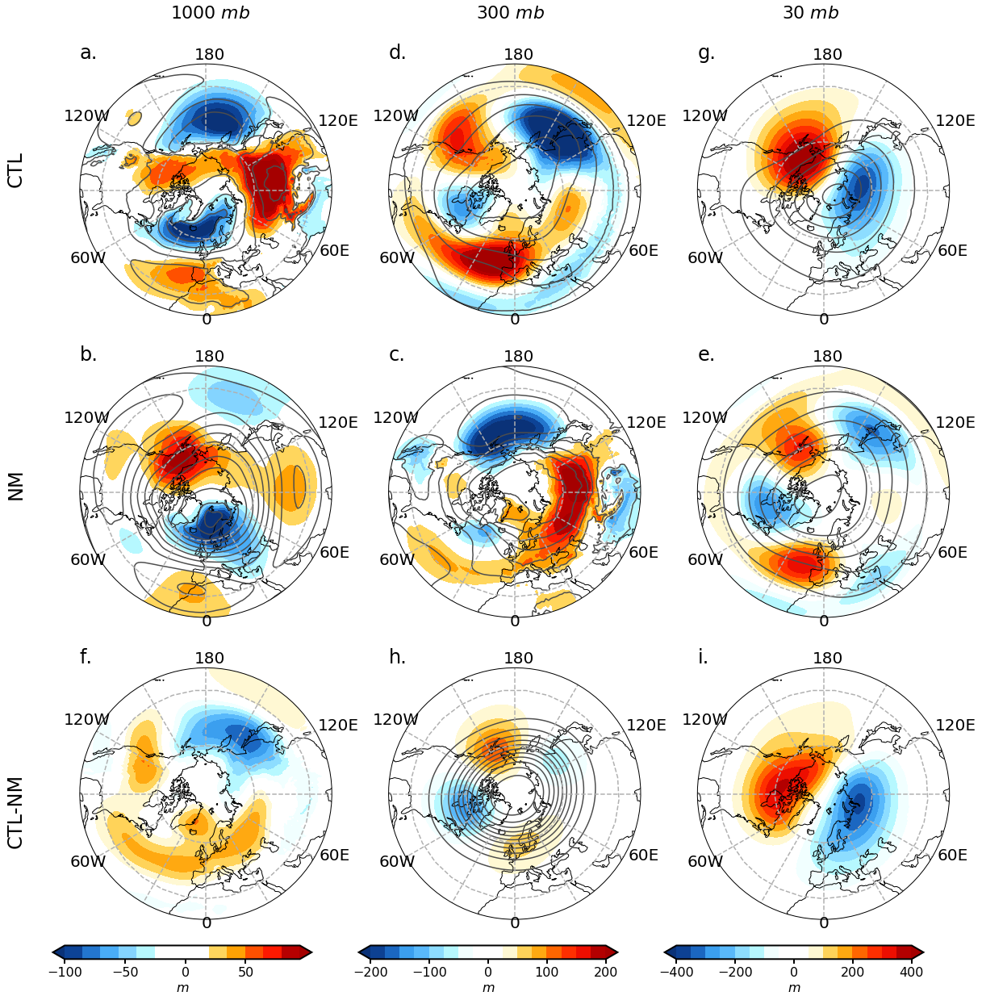

In [218]:
#Robustness to subsampling: years 11-20
#Z300 and Z1000 WACCM ERAI, CTL, and CTL-NM  - years 1-10
CTL = 'WACCM6_CTL'
EXP = 'WACCM6_Flat'

nrows=3
ncols = 3
matplotlib.rcParams['figure.figsize']=(6.75*ncols,6.5*nrows)
matplotlib.rcParams.update({'font.size':20})
plt.rcParams["axes.linewidth"]  = 2
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2
plt.rcParams['xtick.major.size'] = 6
plt.rcParams['ytick.major.size'] = 6

from cartopy.util import add_cyclic_point

seas='DJF'
var='Z3'

n=1

fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
fig.subplots_adjust(wspace=0.05)
fig.subplots_adjust(hspace=0.2)


alpha = 1.0 # doesn't seem to work when printing to eps
ccolor = [(0.3,0.3,0.3)]

vmin0 = 990; vmax0=1035
vmin = -100; vmax = 100
cmap='bwr'
nlevels0 = 16
nlevels = 16
cenlon = 0
const = 0.01
ERAIconst = 1.0/9.81
#plotCTL(seas,var,vmin=vmin0,vmax=vmax0)

font0 = FontProperties()
font0.set_weight('bold')

o=1
p=4
q=7

labeln = 0
labels = ['a.','b.','c.','d.','e.','f.','g.','h.','i.','j.']

n=1

for plev,vbar in [(1000,0.14),(300,0.4),(30,0.66)]:
        
    toplotM = atmfields_ts[CTL]['DJF']['Z3'].sel(lev_p=plev).isel(time=slice(31,60)).mean(dim='time')
    toplotNM = atmfields_ts[EXP]['DJF']['Z3'].sel(lev_p=plev).isel(time=slice(31,60)).mean(dim='time')


    if plev == 1000:
        levels1 = np.arange(-500,500.1,50.0)

        levels2 = np.arange(-100,100.1,15)      
    elif plev == 300:
        levels1 = np.arange(2000,15001,250)

        levels2 = np.arange(-200,201,25) 
    elif plev == 30:
        levels1 = np.arange(15000,30001,250)

        levels2 = np.arange(-400,401,50)
                        
    ax = set_NPstereo_small(ncols,nrows,o); o+=1
    
    toplot = toplotM
    name = 'CTL'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')
  
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')
    
    plt.title(labels[labeln],loc='left'); labeln +=1

    ax = set_NPstereo_small(ncols,nrows,p); p+=1
    
    toplot = toplotNM
    name = 'NM'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')
  
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    
    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')
    
    plt.title(labels[labeln],loc='left'); labeln +=1
              

    ax = set_NPstereo_small(ncols,nrows,p); p+=1
    
    toplot = toplotM - toplotNM
    name = 'CTL-NM'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')
  
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    
    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')
    
    plt.title(labels[labeln],loc='left'); labeln +=1
         
        
    title = (name)
    if plev == 1000:
        fig.text(0.08,0.79,'CTL',fontsize=24,rotation=90)
        fig.text(0.08,0.51,'NM',fontsize=24,rotation=90)
        fig.text(0.08,0.24,'CTL-NM',fontsize=24,rotation=90)

    if plev == 30:
        ticks = [-600,-400,-200,0,200,400,600]        
    elif plev == 300:
        ticks = [-300,-200,-100,0,100,200,300]
    elif plev == 850:
        ticks = [-150,-100,-50,0,50,100,150]
    elif plev == 1000:
        ticks = [-150,-100,-50,0,50,100,150]        
    cbar_ax = fig.add_axes([vbar -0.02, 0.09, 0.22, 0.012])
    cbar_ax.tick_params(labelsize=16) 
    cb = fig.colorbar(im,cax=cbar_ax,orientation='horizontal',ticks=ticks)
    cb.set_label(label = r'$m$',fontsize=16)
    fig.text(vbar+0.08,0.92,r'$' + str(plev) + '$ $mb$',rotation=0,fontsize=22)

plt.show()

## Extra figures

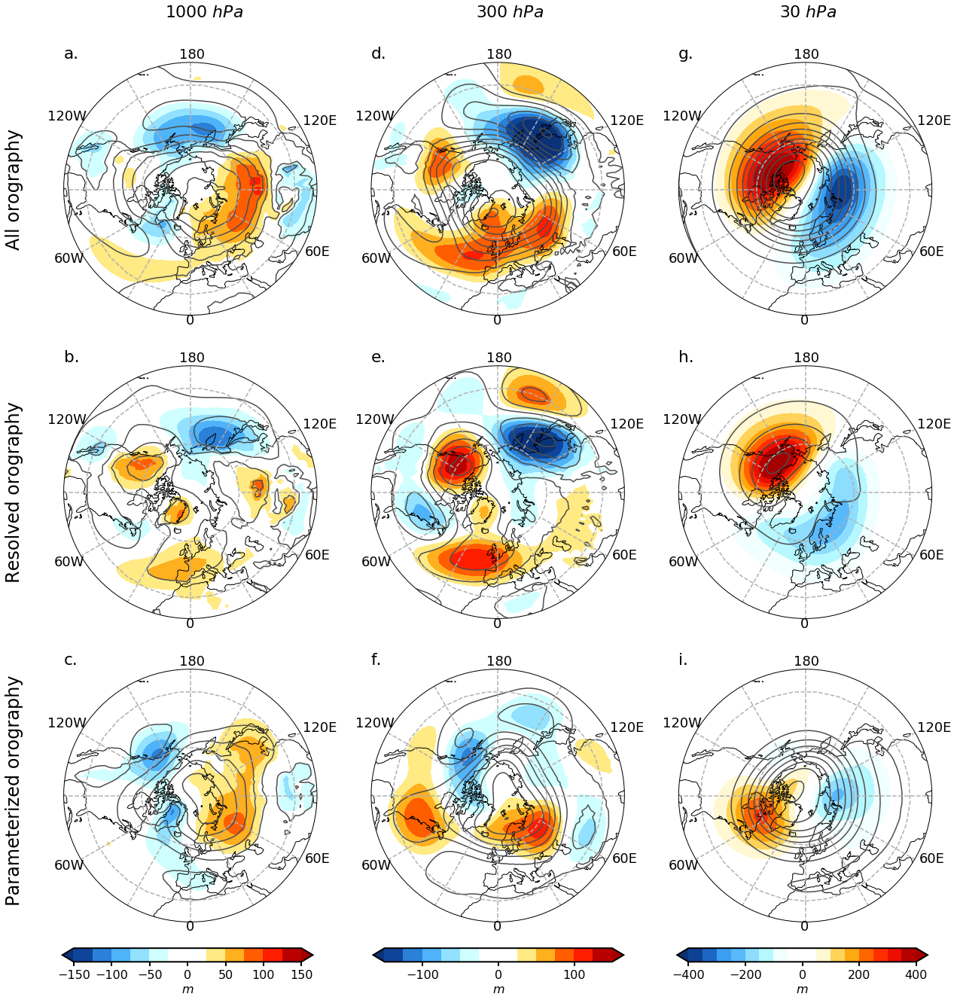

In [35]:
#Fig 6 Z1000, Z300 and Z30 CTL, resolved and parameterized using MSmooth - 2 degrees
filename = 'JAS_May2021_Zmaps_res_par_2deg.eps'

CTL = 'WACCM6_2deg_CTL'
SM = 'WACCM6_2deg_MSmooth'
NM = 'WACCM6_2deg_Flat'

nrows=3
ncols = 3
matplotlib.rcParams['figure.figsize']=(7*ncols,7*nrows)
matplotlib.rcParams.update({'font.size':18})
plt.rcParams["axes.linewidth"]  = 2
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2
plt.rcParams['xtick.major.size'] = 6
plt.rcParams['ytick.major.size'] = 6

seas='DJF'
var='Z3'

n=1

fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
fig.subplots_adjust(wspace=0.05)
fig.subplots_adjust(hspace=0.2)


alpha = 1.0 # doesn't seem to work when printing to eps
ccolor = [(0.3,0.3,0.3)]

vmin0 = 990; vmax0=1035
vmin = -100; vmax = 100
cmap='bwr'
nlevels0 = 16
nlevels = 16
cenlon = 0
const = 0.01
ERAIconst = 1.0/9.81
#plotCTL(seas,var,vmin=vmin0,vmax=vmax0)

font0 = FontProperties()
font0.set_weight('bold')
n=1
o=4
p=7

labeln = 0
labels = ['a.','b.','c.','d.','e.','f.','g.','h.','i.','j.']

n=1

for plev,vbar in [(1000,0.15),(300,0.423),(30,0.69)]:
        
    toplotM = atmfields['p' + CTL]['DJF']['Z3'].sel(lev_p=plev).mean(dim='time')
    toplotNM = atmfields['p' + NM]['DJF']['Z3'].sel(lev_p=plev).mean(dim='time')
    toplotSM = atmfields['p' + SM]['DJF']['Z3'].sel(lev_p=plev).mean(dim='time')


    if plev == 1000:
        levels1 = np.arange(-1000,1000.1,50.0)

        levels2 = np.arange(-150,150.1,25)      
    elif plev == 300:
        levels1 = np.arange(-15000,15001,50)

        levels2 = np.arange(-150,151,25) 
    elif plev == 30:
        levels1 = np.arange(-4000,4000,200)

        levels2 = np.arange(-400,401,50)
                              
        
    ax = set_NPstereo_small(ncols,nrows,n); n+=1
    
    toplot = toplotM - toplotNM
    name = 'All'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')
  
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    # bold zero contour
    #plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
    #        levels=[0],colors=ccolor,extend='both',linewidths=2,alpha=alpha)  

    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')
    
    plt.title(labels[labeln],loc='left'); labeln +=1

    #plt.title(labels[labeln] + ' A = ' + '{:02.2f}'.format(float(latsum.values)),
    #                                                      loc='left'); labeln+=1

    ax = set_NPstereo_small(ncols,nrows,o); o+=1
    
    toplot = toplotSM-toplotNM
    name = 'Resolved'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')
  
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    # bold zero contour
    #plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
    #        levels=[0],colors=ccolor,extend='both',linewidths=2,alpha=alpha)
    
    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')
    
    plt.title(labels[labeln],loc='left'); labeln +=1

        
    ax = set_NPstereo_small(ncols,nrows,p); p+=1
    
    toplot = toplotM - toplotSM
    name = 'NM'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')
  
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    # bold zero contour
    #plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
    #        levels=[0],colors=ccolor,extend='both',linewidths=2,alpha=alpha)
    
    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')
    
    plt.title(labels[labeln],loc='left'); labeln +=1
        
        
    title = (name)
    if plev == 1000:
        fig.text(0.08,0.81,'All orography',fontsize=24,rotation=90)
        fig.text(0.08,0.57,'Resolved orography',fontsize=24,rotation=90)
        fig.text(0.08,0.33,'Parameterized orography',fontsize=24,rotation=90)

    #plt.title(labels[labeln] + ' A = ' + '{:02.2f}'.format(float(latsum.values)),
    #                                                      loc='left'); labeln+=1

    if plev == 30:
        ticks = [-600,-400,-200,0,200,400,600]        
    elif plev == 300:
        ticks = [-300,-200,-100,0,100,200,300]
    elif plev == 850:
        ticks = [-150,-100,-50,0,50,100,150]
    elif plev == 1000:
        ticks = [-150,-100,-50,0,50,100,150]        
    cbar_ax = fig.add_axes([vbar -0.02, 0.09, 0.22, 0.012])
    cbar_ax.tick_params(labelsize=16) 
    cb = fig.colorbar(im,cax=cbar_ax,orientation='horizontal',ticks=ticks)
    cb.set_label(label = r'$m$',fontsize=16)
    fig.text(vbar+0.07,0.92,r'$' + str(plev) + '$ $hPa$',rotation=0,fontsize=22)

plt.subplots_adjust(wspace=0.15)

#plt.savefig('/home/disk/eos4/rachel/Projects/StationaryWaves/FiguresJAS/' + filename, dpi=None, facecolor='w', 
#        edgecolor='w',
#        orientation='portrait')

plt.show()

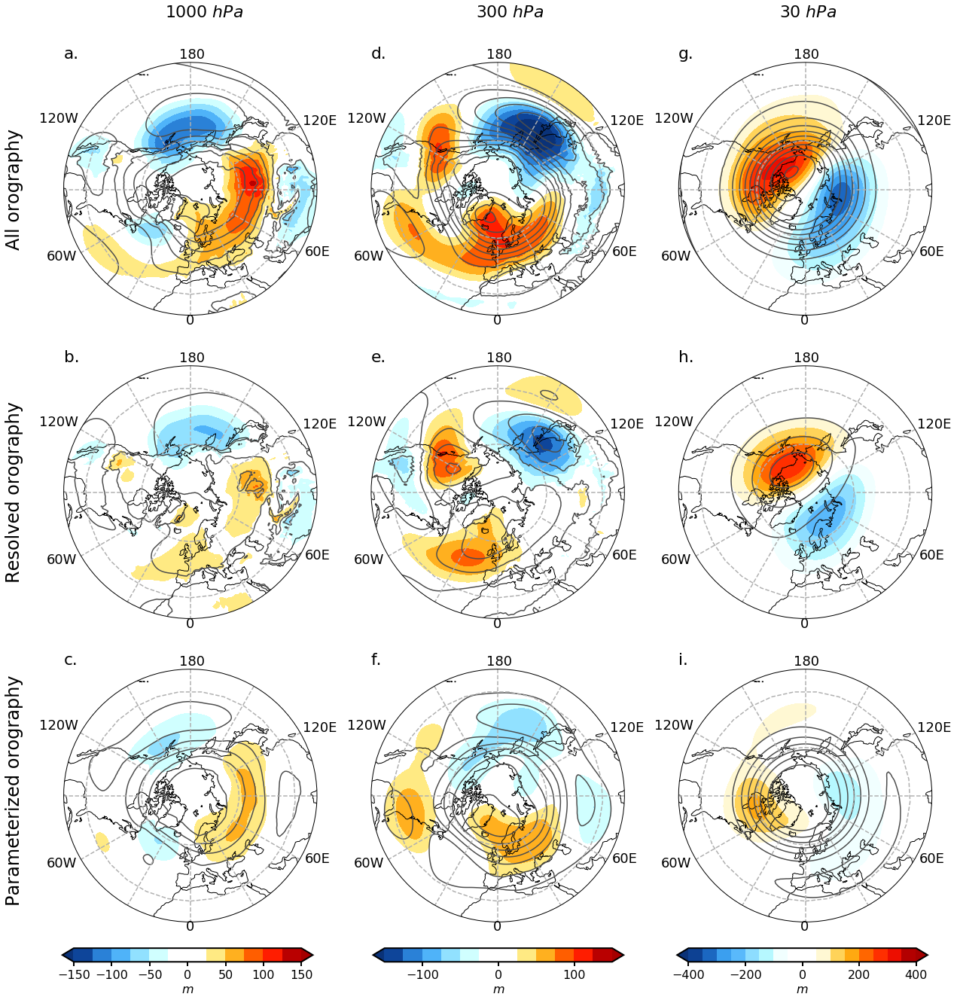

In [59]:
#Fig 6 Z1000, Z300 and Z1000 CTL, CTL-NMrough and NMrough - NM
filename = 'JASMay2021Zmapsrespar_NMrough.eps'

CTL = 'WACCM6_CTL'
NMrough = 'WACCM6_FlatRough'
NM = 'WACCM6_Flat'

nrows=3
ncols = 3
matplotlib.rcParams['figure.figsize']=(7*ncols,7*nrows)
matplotlib.rcParams.update({'font.size':18})
plt.rcParams["axes.linewidth"]  = 2
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['ytick.major.width'] = 2
plt.rcParams['xtick.major.size'] = 6
plt.rcParams['ytick.major.size'] = 6

from cartopy.util import add_cyclic_point

seas='DJF'
var='Z3'

n=1

fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
fig.subplots_adjust(wspace=0.05)
fig.subplots_adjust(hspace=0.2)


alpha = 1.0 # doesn't seem to work when printing to eps
ccolor = [(0.3,0.3,0.3)]

vmin0 = 990; vmax0=1035
vmin = -100; vmax = 100
cmap='bwr'
nlevels0 = 16
nlevels = 16
cenlon = 0
const = 0.01
ERAIconst = 1.0/9.81
#plotCTL(seas,var,vmin=vmin0,vmax=vmax0)

font0 = FontProperties()
font0.set_weight('bold')
n=1
o=4
p=7

labeln = 0
labels = ['a.','b.','c.','d.','e.','f.','g.','h.','i.','j.']

n=1

for plev,vbar in [(1000,0.15),(300,0.423),(30,0.69)]:
        
    toplotM = atmfields['p' + CTL]['DJF']['Z3'].sel(lev_p=plev).mean(dim='time')
    toplotNM = atmfields['p' + NM]['DJF']['Z3'].sel(lev_p=plev).mean(dim='time')
    toplotNMrough = atmfields['p' + NMrough]['DJF']['Z3'].sel(lev_p=plev).mean(dim='time')


    if plev == 1000:
        levels1 = np.arange(-1000,1000.1,50.0)

        levels2 = np.arange(-150,150.1,25)      
    elif plev == 300:
        levels1 = np.arange(-15000,15001,50)

        levels2 = np.arange(-150,151,25) 
    elif plev == 30:
        levels1 = np.arange(-4000,4000,200)

        levels2 = np.arange(-400,401,50)
                              
        
    ax = set_NPstereo_small(ncols,nrows,n); n+=1
    
    toplot = toplotM - toplotNM
    name = 'All'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')
  
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    # bold zero contour
    #plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
    #        levels=[0],colors=ccolor,extend='both',linewidths=2,alpha=alpha)  

    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')
    
    plt.title(labels[labeln],loc='left'); labeln +=1

    #plt.title(labels[labeln] + ' A = ' + '{:02.2f}'.format(float(latsum.values)),
    #                                                      loc='left'); labeln+=1

    ax = set_NPstereo_small(ncols,nrows,o); o+=1
    
    toplot = toplotM-toplotNMrough
    name = 'Resolved'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')
  
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    # bold zero contour
    #plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
    #        levels=[0],colors=ccolor,extend='both',linewidths=2,alpha=alpha)
    
    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')
    
    plt.title(labels[labeln],loc='left'); labeln +=1

        
    ax = set_NPstereo_small(ncols,nrows,p); p+=1
    
    toplot = toplotNMrough - toplotNM
    name = 'NM'

    toplot2 = toplot - toplot.mean(dim='lon')

    new_da = add_lon(toplot,coord='lon')
    new_da2 = add_lon(toplot2,coord='lon')
  
    plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
           levels=levels1,colors=ccolor,extend='both',linestyles='-',alpha=alpha) 
    # bold zero contour
    #plt.contour(new_da.lon, new_da.lat,new_da.values,transform=ccrs.PlateCarree(),
    #        levels=[0],colors=ccolor,extend='both',linewidths=2,alpha=alpha)
    
    im = plt.contourf(new_da2.lon, new_da2.lat,new_da2.values,transform=ccrs.PlateCarree(),
        levels=levels2,cmap=cmap_wc,extend='both')
    
    plt.title(labels[labeln],loc='left'); labeln +=1
        
        
    title = (name)
    if plev == 1000:
        fig.text(0.08,0.81,'All orography',fontsize=24,rotation=90)
        fig.text(0.08,0.57,'Resolved orography',fontsize=24,rotation=90)
        fig.text(0.08,0.33,'Parameterized orography',fontsize=24,rotation=90)

    #plt.title(labels[labeln] + ' A = ' + '{:02.2f}'.format(float(latsum.values)),
    #                                                      loc='left'); labeln+=1

    if plev == 30:
        ticks = [-600,-400,-200,0,200,400,600]        
    elif plev == 300:
        ticks = [-300,-200,-100,0,100,200,300]
    elif plev == 850:
        ticks = [-150,-100,-50,0,50,100,150]
    elif plev == 1000:
        ticks = [-150,-100,-50,0,50,100,150]        
    cbar_ax = fig.add_axes([vbar -0.02, 0.09, 0.22, 0.012])
    cbar_ax.tick_params(labelsize=16) 
    cb = fig.colorbar(im,cax=cbar_ax,orientation='horizontal',ticks=ticks)
    cb.set_label(label = r'$m$',fontsize=16)
    fig.text(vbar+0.07,0.92,r'$' + str(plev) + '$ $hPa$',rotation=0,fontsize=22)

plt.subplots_adjust(wspace=0.15)

plt.savefig('/home/disk/eos4/rachel/Projects/StationaryWaves/FiguresJAS/' + filename, dpi=None, facecolor='w', 
        edgecolor='w',
        orientation='portrait')

plt.show()